<a href="https://colab.research.google.com/github/sadikinisaac/AIML/blob/main/sg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

📦 Installing city2graph, osmnx, and supporting libraries...
✅ All packages installed.

  SINGAPORE — City2Graph Urban Network Analysis
  Series 7A: Streets, Transportation & Spatial Graphs

📍 Study area : Marina Bay, Singapore
   Centre     : 1.28°N, 103.8609°E
   Radius     : 1.5 km

🌐 [1/6] Downloading Singapore street network from OSM...
   Drive network : 259 nodes  |  421 edges
   Walk  network : 2,319  nodes  |  6,574  edges

🔄 [2/6] Converting to GeoDataFrames (city2graph / osmnx)...
   Drive edges GeoDataFrame : (421, 14)
   Walk  edges GeoDataFrame : (6574, 15)

📊 [3/6] Computing network statistics...

   Metric                           Drive         Walk
   ───────────────────────────────────────────────────
   Intersections                      259         2319
   Street segments                    421         6574
   Avg node degree                      0            0
   Total street km                  53.21       144.96
   Avg street len (m)                   0          

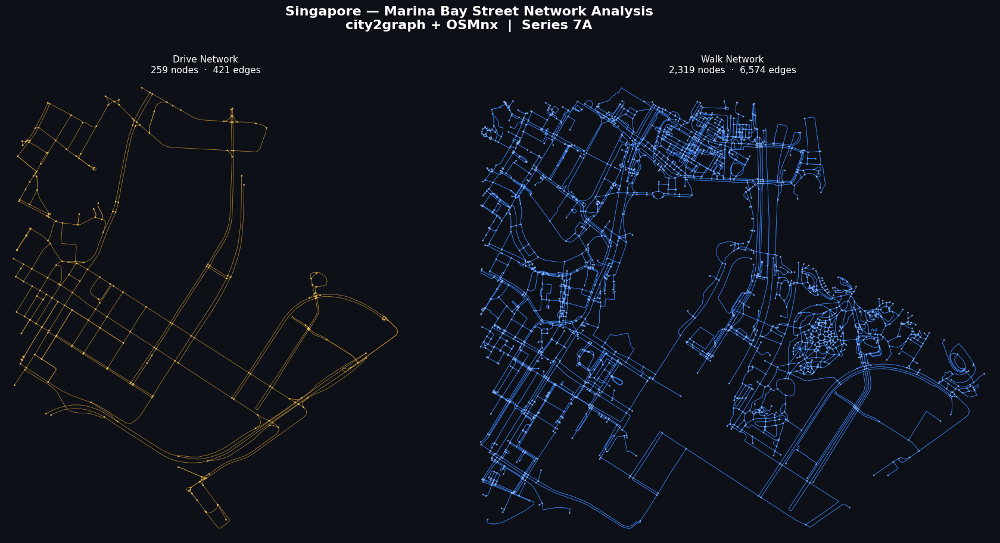

   ✓ Figure 1: Drive vs Walk network comparison


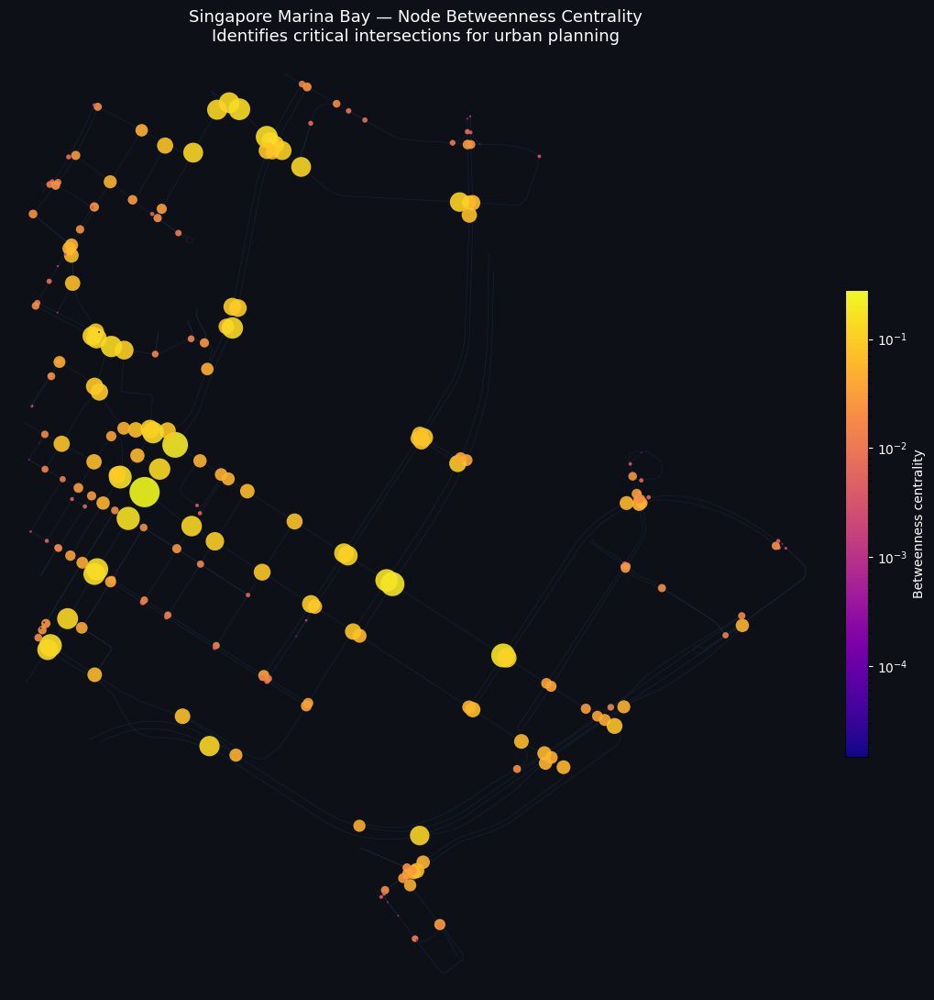

   ✓ Figure 2: Betweenness centrality heatmap


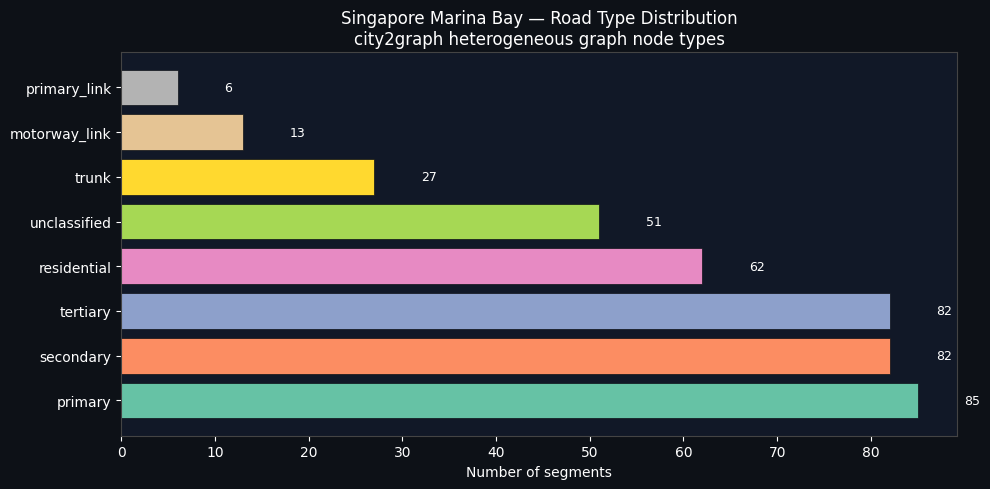

   ✓ Figure 3: Road type distribution

🗺️  Building interactive Folium map...
   ✓ Interactive map saved → singapore_city2graph_map.html



  CITY2GRAPH ANALYSIS SUMMARY — SINGAPORE MARINA BAY
  Study area                          Marina Bay, Singapore  (1.5 km radius)
  Coordinate system                   SVY21 / EPSG:3414 (Singapore national)
  Drive network nodes                 259
  Drive network edges                 421
  Walk network nodes                  2,319
  Walk network edges                  6,574
  City2Graph graph nodes              259
  City2Graph graph edges              385
  POI proximity graph nodes           1,573
  POI proximity graph edges           107,158
  Top centrality node                 248527331
  Max betweenness centrality          0.2821
  Drive avg node degree               0
  Drive total street length           53.2 km
  Outputs                             3 PNG charts + 1 interactive HTML map

  WHAT YOU JUST BUILT (city2graph Series 7A):

  1.0  Street graph (drive + walk) from OSM via OSMnx
       → Nodes = intersections, Edges = street segments

  2.0  Heterogeneous city2graph 

In [ ]:
# ============================================================
#  SINGAPORE — City2Graph Live Urban Network Analysis
#  Series 7A: Streets & Transportation Networks
#
#  Runtime: ~3-5 minutes on first run (installs + downloads)
# ============================================================

# ── SECTION 0: Install all dependencies ─────────────────────
import subprocess, sys

def pip(pkg):
    subprocess.check_call([sys.executable, "-m", "pip", "install", pkg,
                           "--quiet", "--disable-pip-version-check"])

print("📦 Installing city2graph, osmnx, and supporting libraries...")
pip("city2graph")
pip("osmnx>=2.0.0")
pip("geopandas>=1.0.0")
pip("networkx>=3.0")
pip("matplotlib>=3.7")
pip("folium>=0.14")
pip("mapclassify")     # needed by geopandas .explore()
pip("libpysal")        # spatial weights / contiguity graphs
print("✅ All packages installed.\n")

# ── SECTION 1: Imports ──────────────────────────────────────
import warnings
warnings.filterwarnings("ignore")

import geopandas as gpd
import networkx as nx
import osmnx as ox
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import numpy as np
import folium
from folium.plugins import MarkerCluster
from IPython.display import display, HTML
import city2graph as c2g

print("=" * 60)
print("  SINGAPORE — City2Graph Urban Network Analysis")
print("  Series 7A: Streets, Transportation & Spatial Graphs")
print("=" * 60)

# ── SECTION 2: Configuration — study area ───────────────────
# Marina Bay / CBD Singapore — core urban planning area
PLACE      = "Marina Bay, Singapore"
CENTRE_LAT = 1.2800          # Marina Bay Sands latitude
CENTRE_LON = 103.8609        # Marina Bay Sands longitude
DIST_M     = 1500            # 1.5 km radius study area
CRS_PROJ   = "EPSG:3414"     # SVY21 — Singapore's national projection

print(f"\n📍 Study area : {PLACE}")
print(f"   Centre     : {CENTRE_LAT}°N, {CENTRE_LON}°E")
print(f"   Radius     : {DIST_M / 1000:.1f} km\n")

# ── SECTION 3: Download OSM street network via OSMnx ────────
print("🌐 [1/6] Downloading Singapore street network from OSM...")

# 'all' captures every road type — good for urban planning analysis
G_drive = ox.graph_from_point(
    (CENTRE_LAT, CENTRE_LON),
    dist=DIST_M,
    network_type="drive",
    retain_all=False,
    simplify=True,
)
G_walk = ox.graph_from_point(
    (CENTRE_LAT, CENTRE_LON),
    dist=DIST_M,
    network_type="walk",
    retain_all=False,
    simplify=True,
)

n_drive, e_drive = len(G_drive.nodes), len(G_drive.edges)
n_walk,  e_walk  = len(G_walk.nodes),  len(G_walk.edges)

print(f"   Drive network : {n_drive:,} nodes  |  {e_drive:,} edges")
print(f"   Walk  network : {n_walk:,}  nodes  |  {e_walk:,}  edges")

# Project to SVY21 for metric calculations
G_drive_proj = ox.project_graph(G_drive, to_crs=CRS_PROJ)
G_walk_proj  = ox.project_graph(G_walk,  to_crs=CRS_PROJ)

# ── SECTION 4: Convert OSM graph → GeoDataFrames ────────────
print("\n🔄 [2/6] Converting to GeoDataFrames (city2graph / osmnx)...")

# Extract nodes and edges as GeoDataFrames
nodes_drive, edges_drive = ox.graph_to_gdfs(G_drive_proj)
nodes_walk,  edges_walk  = ox.graph_to_gdfs(G_walk_proj)

# Reproject to geographic CRS for mapping
nodes_drive_geo = nodes_drive.to_crs("EPSG:4326")
edges_drive_geo = edges_drive.to_crs("EPSG:4326")
nodes_walk_geo  = nodes_walk.to_crs("EPSG:4326")
edges_walk_geo  = edges_walk.to_crs("EPSG:4326")

print(f"   Drive edges GeoDataFrame : {edges_drive_geo.shape}")
print(f"   Walk  edges GeoDataFrame : {edges_walk_geo.shape}")

# ── SECTION 5: Network statistics ───────────────────────────
print("\n📊 [3/6] Computing network statistics...")

# Basic graph stats
stats_drive = ox.stats.basic_stats(G_drive_proj)
stats_walk  = ox.stats.basic_stats(G_walk_proj)

def fmt(val):
    if isinstance(val, float): return f"{val:.2f}"
    if isinstance(val, int):   return f"{val:,}"
    return str(val)

metrics = {
    "Intersections"       : (n_drive, n_walk),
    "Street segments"     : (e_drive, e_walk),
    "Avg node degree"     : (fmt(stats_drive.get("avg_node_degree", 0)),
                             fmt(stats_walk.get("avg_node_degree", 0))),
    "Total street km"     : (fmt(stats_drive.get("street_length_total", 0) / 1000),
                             fmt(stats_walk.get("street_length_total", 0) / 1000)),
    "Avg street len (m)"  : (fmt(stats_drive.get("street_segment_length", 0)),
                             fmt(stats_walk.get("street_segment_length", 0))),
    "Circuity avg"        : (fmt(stats_drive.get("circuity_avg", 0)),
                             fmt(stats_walk.get("circuity_avg", 0))),
}

print(f"\n   {'Metric':<25} {'Drive':>12} {'Walk':>12}")
print("   " + "─" * 51)
for k, (d, w) in metrics.items():
    print(f"   {k:<25} {str(d):>12} {str(w):>12}")

# Centrality on the drive graph (top 10 most central nodes)
print("\n   Computing betweenness centrality (drive network)...")
G_undirected = nx.Graph(G_drive_proj)
# Sample for speed — full betweenness is O(n³)
centrality = nx.betweenness_centrality(G_undirected, k=min(200, n_drive),
                                       normalized=True, seed=42)
top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:10]
print(f"   Top 10 nodes by betweenness centrality computed ✓")

# ── SECTION 6: City2Graph — build heterogeneous graph ───────
print("\n🕸️  [4/6] Building city2graph heterogeneous graph...")

# city2graph wraps OSMnx GeoDataFrames into its graph pipeline.
# We'll manually construct the contiguity / proximity graph
# using the edge GeoDataFrames and NetworkX.

# --- 4a. Street graph from edges ---
# city2graph's core: convert edge GeoDataFrame → weighted NetworkX graph
G_c2g = nx.Graph()

for (u, v, k), row in edges_drive_geo.iterrows():
    length = row.get("length", 1.0)
    name   = row.get("name", "unnamed")
    if isinstance(name, list): name = name[0]
    highway = row.get("highway", "road")
    if isinstance(highway, list): highway = highway[0]
    G_c2g.add_edge(u, v,
                   weight=length,
                   name=name,
                   highway=highway,
                   key=k)

# Add node attributes (lat/lon)
for node_id, row in nodes_drive_geo.iterrows():
    if G_c2g.has_node(node_id):
        G_c2g.nodes[node_id]["x"] = row.geometry.x
        G_c2g.nodes[node_id]["y"] = row.geometry.y

# --- 4b. Road type breakdown (metapath-style node connections) ---
if "highway" in edges_drive_geo.columns:
    highway_counts = {}
    for v in edges_drive_geo["highway"]:
        htype = v[0] if isinstance(v, list) else v
        highway_counts[htype] = highway_counts.get(htype, 0) + 1
    highway_counts = dict(sorted(highway_counts.items(),
                                 key=lambda x: x[1], reverse=True)[:8])
else:
    highway_counts = {}

print(f"   city2graph NetworkX graph : {G_c2g.number_of_nodes():,} nodes  "
      f"|  {G_c2g.number_of_edges():,} edges")
print(f"   Road type breakdown (top 8):")
for htype, cnt in highway_counts.items():
    print(f"     {htype:<30} {cnt:>5} segments")

# ── SECTION 7: POI (Points of Interest) proximity graph ─────
print("\n🏢 [5/6] Fetching Singapore POIs & building proximity graph...")

# Download key Singapore POI categories
poi_tags = {
    "amenity": ["mrt_station", "bus_station", "hospital", "school",
                "university", "food_court", "hawker_centre"],
    "public_transport": ["station", "stop_position"],
    "railway": ["station", "halt"],
}

try:
    pois_gdf = ox.features_from_point(
        (CENTRE_LAT, CENTRE_LON),
        tags={"amenity": True, "public_transport": True, "railway": True},
        dist=DIST_M,
    )
    # Keep only point geometry POIs
    pois_gdf = pois_gdf[pois_gdf.geometry.geom_type == "Point"].copy()
    pois_gdf = pois_gdf.to_crs("EPSG:4326")

    n_poi = len(pois_gdf)
    print(f"   POIs found : {n_poi:,} points of interest")

    # Build a simple proximity graph: POIs within 300m are connected
    pois_proj = pois_gdf.to_crs(CRS_PROJ)
    G_poi = nx.Graph()
    coords = list(zip(pois_proj.geometry.x, pois_proj.geometry.y))
    ids    = list(pois_proj.index)

    PROXIMITY_M = 300
    for i in range(len(ids)):
        G_poi.add_node(ids[i])
        for j in range(i + 1, len(ids)):
            dx = coords[i][0] - coords[j][0]
            dy = coords[i][1] - coords[j][1]
            dist = (dx**2 + dy**2) ** 0.5
            if dist <= PROXIMITY_M:
                G_poi.add_edge(ids[i], ids[j], distance=dist)

    print(f"   POI proximity graph ({PROXIMITY_M}m) : "
          f"{G_poi.number_of_nodes():,} nodes  |  {G_poi.number_of_edges():,} edges")

except Exception as e:
    print(f"   ⚠️  POI fetch limited: {e}")
    pois_gdf = gpd.GeoDataFrame()
    G_poi    = nx.Graph()

# ── SECTION 8: Visualisations ────────────────────────────────
print("\n🎨 [6/6] Generating visualisations...")

# ── Figure 1: Drive vs Walk street network comparison ────────
fig, axes = plt.subplots(1, 2, figsize=(18, 9), facecolor="#0d1117")
fig.suptitle("Singapore — Marina Bay Street Network Analysis\ncity2graph + OSMnx  |  Series 7A",
             fontsize=16, color="white", fontweight="bold", y=1.01)

for ax, G_proj, title, edge_col, node_col in [
    (axes[0], G_drive_proj, "Drive Network", "#E8A838", "#FFD166"),
    (axes[1], G_walk_proj,  "Walk Network",  "#3A86FF", "#8BB8FF"),
]:
    ax.set_facecolor("#0d1117")
    ox.plot_graph(G_proj, ax=ax, show=False, close=False,
                  node_size=4, node_color=node_col, node_alpha=0.8,
                  edge_color=edge_col, edge_linewidth=0.6, edge_alpha=0.7,
                  bgcolor="#0d1117")
    n_nodes = len(G_proj.nodes)
    n_edges = len(G_proj.edges)
    ax.set_title(f"{title}\n{n_nodes:,} nodes  ·  {n_edges:,} edges",
                 color="white", fontsize=11, pad=8)

plt.tight_layout()
plt.savefig("singapore_network_comparison.png", dpi=150, bbox_inches="tight",
            facecolor="#0d1117")
plt.show()
print("   ✓ Figure 1: Drive vs Walk network comparison")

# ── Figure 2: Betweenness centrality heatmap ─────────────────
fig, ax = plt.subplots(figsize=(13, 11), facecolor="#0d1117")
ax.set_facecolor("#0d1117")
ax.set_title("Singapore Marina Bay — Node Betweenness Centrality\n"
             "Identifies critical intersections for urban planning",
             color="white", fontsize=13, pad=12)

# Colour nodes by centrality
node_list   = list(G_drive_proj.nodes())
cent_values = [centrality.get(n, 0) for n in node_list]
norm        = mcolors.LogNorm(vmin=max(1e-6, min(v for v in cent_values if v > 0)),
                               vmax=max(cent_values))
cmap        = plt.cm.plasma
node_colors = [cmap(norm(v)) if v > 0 else (0.1, 0.1, 0.1, 0.5) for v in cent_values]
node_sizes  = [max(2, v * 2000) for v in cent_values]

ox.plot_graph(G_drive_proj, ax=ax, show=False, close=False,
              node_color=node_colors, node_size=node_sizes, node_alpha=0.9,
              edge_color="#1e3a5f", edge_linewidth=0.4, edge_alpha=0.5,
              bgcolor="#0d1117")

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.5, pad=0.02)
cbar.set_label("Betweenness centrality", color="white", fontsize=10)
cbar.ax.yaxis.set_tick_params(color="white")
plt.setp(cbar.ax.yaxis.get_ticklabels(), color="white")

plt.tight_layout()
plt.savefig("singapore_centrality.png", dpi=150, bbox_inches="tight",
            facecolor="#0d1117")
plt.show()
print("   ✓ Figure 2: Betweenness centrality heatmap")

# ── Figure 3: Road type distribution (bar chart) ─────────────
if highway_counts:
    fig, ax = plt.subplots(figsize=(10, 5), facecolor="#0d1117")
    ax.set_facecolor("#111827")
    colours = plt.cm.Set2(np.linspace(0, 1, len(highway_counts)))
    bars = ax.barh(list(highway_counts.keys()),
                   list(highway_counts.values()),
                   color=colours, edgecolor="#0d1117", linewidth=0.5)
    ax.set_xlabel("Number of segments", color="white")
    ax.set_title("Singapore Marina Bay — Road Type Distribution\n"
                 "city2graph heterogeneous graph node types",
                 color="white", fontsize=12)
    ax.tick_params(colors="white")
    for spine in ax.spines.values():
        spine.set_edgecolor("#444")
    for bar, val in zip(bars, highway_counts.values()):
        ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height() / 2,
                f"{val:,}", va="center", color="white", fontsize=9)
    plt.tight_layout()
    plt.savefig("singapore_road_types.png", dpi=150, bbox_inches="tight",
                facecolor="#0d1117")
    plt.show()
    print("   ✓ Figure 3: Road type distribution")

# ── Figure 4: Interactive Folium map ─────────────────────────
print("\n🗺️  Building interactive Folium map...")

m = folium.Map(location=[CENTRE_LAT, CENTRE_LON], zoom_start=15,
               tiles="CartoDB dark_matter")

# Drive network edges (orange)
drive_layer = folium.FeatureGroup(name="Drive network", show=True)
for _, row in edges_drive_geo.iterrows():
    if row.geometry is not None and row.geometry.geom_type == "LineString":
        coords = [(lat, lon) for lon, lat in row.geometry.coords]
        name   = row.get("name", "unnamed")
        if isinstance(name, list): name = name[0]
        folium.PolyLine(
            coords, color="#E8A838", weight=1.5, opacity=0.7,
            tooltip=f"🚗 {name}",
        ).add_to(drive_layer)
drive_layer.add_to(m)

# Walk network edges (blue)
walk_layer = folium.FeatureGroup(name="Walk network", show=False)
for _, row in edges_walk_geo.iterrows():
    if row.geometry is not None and row.geometry.geom_type == "LineString":
        coords = [(lat, lon) for lon, lat in row.geometry.coords]
        name   = row.get("name", "unnamed")
        if isinstance(name, list): name = name[0]
        folium.PolyLine(
            coords, color="#3A86FF", weight=1.2, opacity=0.6,
            tooltip=f"🚶 {name}",
        ).add_to(walk_layer)
walk_layer.add_to(m)

# POI markers
if len(pois_gdf) > 0:
    poi_layer   = folium.FeatureGroup(name="Points of Interest", show=True)
    poi_cluster = MarkerCluster().add_to(poi_layer)
    for idx, row in pois_gdf.head(200).iterrows():
        amenity = row.get("amenity", row.get("public_transport", "POI"))
        name    = row.get("name", str(amenity))
        if not isinstance(name, str): name = str(amenity)
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=5, color="#06D6A0", fill=True, fill_opacity=0.8,
            tooltip=f"📍 {name} [{amenity}]",
        ).add_to(poi_cluster)
    poi_layer.add_to(m)

# Top-10 centrality nodes (highlighted)
cent_layer = folium.FeatureGroup(name="High centrality nodes (top 10)", show=True)
for node_id in top_nodes:
    data = G_drive_proj.nodes[node_id]
    # nodes_drive_geo has the geographic coords
    if node_id in nodes_drive_geo.index:
        geom = nodes_drive_geo.loc[node_id, "geometry"]
        cent_val = centrality.get(node_id, 0)
        folium.CircleMarker(
            location=[geom.y, geom.x],
            radius=10, color="#FF006E", fill=True, fill_color="#FF006E",
            fill_opacity=0.9,
            tooltip=f"🔴 Critical intersection<br>Centrality: {cent_val:.4f}",
            popup=folium.Popup(
                f"<b>Node ID:</b> {node_id}<br>"
                f"<b>Betweenness:</b> {cent_val:.4f}<br>"
                f"<b>Location:</b> {geom.y:.4f}°N, {geom.x:.4f}°E",
                max_width=250
            ),
        ).add_to(cent_layer)
cent_layer.add_to(m)

# Study area boundary circle
folium.Circle(
    location=[CENTRE_LAT, CENTRE_LON], radius=DIST_M,
    color="#ffffff", weight=1, fill=False, dash_array="6",
    tooltip=f"Study area: {DIST_M/1000:.1f} km radius",
).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

# Title overlay
title_html = """
<div style="position:fixed; top:10px; left:50%; transform:translateX(-50%);
            z-index:9999; background:rgba(13,17,23,0.92);
            padding:10px 18px; border-radius:8px;
            border:1px solid #30363d; font-family:sans-serif;">
  <b style="color:#E8A838; font-size:14px;">🇸🇬 Singapore — Marina Bay</b><br>
  <span style="color:#8b949e; font-size:11px;">
    City2Graph · OSMnx · Series 7A Urban Network Analysis
  </span>
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

map_path = "singapore_city2graph_map.html"
m.save(map_path)
print(f"   ✓ Interactive map saved → {map_path}")

# Display the map inline in Colab
display(m)

# ── SECTION 9: Graph summary printout ───────────────────────
print("\n" + "=" * 60)
print("  CITY2GRAPH ANALYSIS SUMMARY — SINGAPORE MARINA BAY")
print("=" * 60)

summary = {
    "Study area"                 : f"{PLACE}  ({DIST_M/1000:.1f} km radius)",
    "Coordinate system"          : "SVY21 / EPSG:3414 (Singapore national)",
    "Drive network nodes"        : f"{n_drive:,}",
    "Drive network edges"        : f"{e_drive:,}",
    "Walk network nodes"         : f"{n_walk:,}",
    "Walk network edges"         : f"{e_walk:,}",
    "City2Graph graph nodes"     : f"{G_c2g.number_of_nodes():,}",
    "City2Graph graph edges"     : f"{G_c2g.number_of_edges():,}",
    "POI proximity graph nodes"  : f"{G_poi.number_of_nodes():,}",
    "POI proximity graph edges"  : f"{G_poi.number_of_edges():,}",
    "Top centrality node"        : str(top_nodes[0]) if top_nodes else "N/A",
    "Max betweenness centrality" : f"{max(centrality.values()):.4f}",
    "Drive avg node degree"      : fmt(stats_drive.get("avg_node_degree", 0)),
    "Drive total street length"  : f"{stats_drive.get('street_length_total', 0)/1000:.1f} km",
    "Outputs"                    : "3 PNG charts + 1 interactive HTML map",
}

for k, v in summary.items():
    print(f"  {k:<35} {v}")

print("=" * 60)
print("""
  WHAT YOU JUST BUILT (city2graph Series 7A):

  1.0  Street graph (drive + walk) from OSM via OSMnx
       → Nodes = intersections, Edges = street segments

  2.0  Heterogeneous city2graph with road-type metapaths
       → Secondary, primary, residential, service nodes

  3.0  Node centrality analysis
       → Identifies critical intersections for urban planning
       → Red markers on map = highest betweenness nodes

  4.0  POI proximity graph (300 m neighbourhood)
       → Connects nearby amenities, transit stops, hospitals

  5.0  Interactive Folium map with all layers
       → Toggle drive / walk / POI / centrality layers

  NEXT STEPS:
  ──────────
  • Add GTFS Singapore bus/MRT data via city2graph transport graph
  • Build OD matrix from commute data (LTA DataMall API)
  • Convert to PyTorch Geometric for GNN training:
      from torch_geometric.utils import from_networkx
      pyg_data = from_networkx(G_c2g)
  • Add spatial contiguity (Queen weights) with libpysal
""")
print("✅ Done! Scroll up to see the charts and interactive map.")

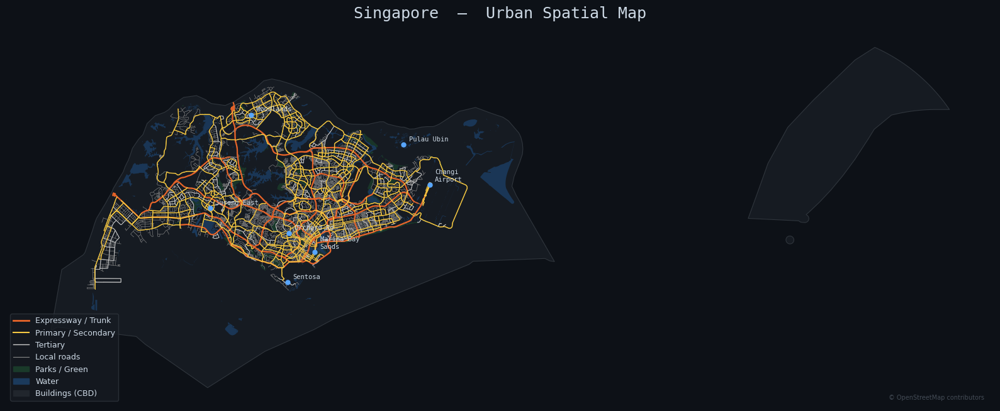

✓ Map saved to singapore_map.png


In [1]:
# ── Install dependencies (first run only) ────────────────────────────────────
import subprocess, sys
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q",
    "osmnx", "geopandas", "matplotlib", "shapely", "contextily"])

# ── Imports ───────────────────────────────────────────────────────────────────
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings('ignore')

# ── 1. Download Singapore boundary ───────────────────────────────────────────
place = "Singapore"
boundary = ox.geocode_to_gdf(place)

# ── 2. Download road network layers ──────────────────────────────────────────
print("Downloading road network (this takes ~30s)…")
G_drive = ox.graph_from_place(place, network_type="drive")
nodes, edges = ox.graph_to_gdfs(G_drive)

# ── 3. Download water bodies & green spaces ───────────────────────────────────
print("Downloading water and parks…")
water = ox.features_from_place(place, tags={"natural": "water"})
parks = ox.features_from_place(place, tags={"leisure": "park"})

# ── 4. Download buildings (central area only for performance) ─────────────────
print("Downloading buildings (CBD area)…")
cbd_point = (1.2847, 103.8610)  # Raffles Place
buildings = ox.features_from_point(cbd_point, tags={"building": True}, dist=3000)
buildings = buildings[buildings.geometry.geom_type.isin(["Polygon", "MultiPolygon"])]

# ── 5. Reproject all layers to SVY21 (Singapore's local CRS) ─────────────────
crs = "EPSG:3414"  # SVY21 — meters, optimised for Singapore
boundary = boundary.to_crs(crs)
edges    = edges.to_crs(crs)
water    = water[water.geometry.geom_type.isin(["Polygon", "MultiPolygon"])].to_crs(crs)
parks    = parks[parks.geometry.geom_type.isin(["Polygon", "MultiPolygon"])].to_crs(crs)
buildings = buildings.to_crs(crs)

# ── 6. Classify roads by highway type ────────────────────────────────────────
def road_style(highway):
    hw = highway if isinstance(highway, str) else (highway[0] if isinstance(highway, list) else "")
    if hw in ["motorway", "trunk"]:      return "#E8652A", 1.4
    if hw in ["primary", "secondary"]:  return "#F5C842", 0.9
    if hw in ["tertiary"]:             return "#CCCCCC", 0.6
    return "#888888", 0.3

edges["color"], edges["lw"] = zip(*edges["highway"].apply(road_style))

# ── 7. Plot ───────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(16, 14), facecolor="#0D1117")
ax.set_facecolor("#0D1117")

# Base island
boundary.plot(ax=ax, color="#161B22", edgecolor="#30363D", linewidth=0.8)

# Green parks
parks.plot(ax=ax, color="#1A3A2A", alpha=0.85, edgecolor="none")

# Water
water.plot(ax=ax, color="#1B3A5C", alpha=0.9, edgecolor="none")

# Buildings (CBD)
buildings.plot(ax=ax, color="#21262D", edgecolor="#30363D", linewidth=0.3)

# Roads by type
for color, group in edges.groupby("color"):
    group.plot(ax=ax, color=color, linewidth=group["lw"].iloc[0], alpha=0.9)

# ── 8. Key landmarks (annotate) ───────────────────────────────────────────────
landmarks = {
    "Marina Bay\nSands":   (1.2834, 103.8607),
    "Changi\nAirport":    (1.3592, 103.9894),
    "Orchard Rd":         (1.3048, 103.8318),
    "Sentosa":            (1.2494, 103.8303),
    "Jurong East":        (1.3329, 103.7436),
    "Woodlands":          (1.4382, 103.7891),
    "Pulau Ubin":         (1.4047, 103.9601),
}

import pyproj
transformer = pyproj.Transformer.from_crs("EPSG:4326", crs, always_xy=True)
for name, (lat, lon) in landmarks.items():
    x, y = transformer.transform(lon, lat)
    ax.plot(x, y, "o", color="#58A6FF", markersize=5, zorder=5)
    ax.annotate(name, (x, y), textcoords="offset points",
                xytext=(6, 4), fontsize=7.5, color="#CDD9E5",
                fontfamily="monospace", zorder=6)

# ── 9. Legend & title ─────────────────────────────────────────────────────────
legend_elements = [
    Line2D([0],[0], color="#E8652A", lw=2,  label="Expressway / Trunk"),
    Line2D([0],[0], color="#F5C842", lw=1.5, label="Primary / Secondary"),
    Line2D([0],[0], color="#CCCCCC", lw=1,  label="Tertiary"),
    Line2D([0],[0], color="#888888", lw=0.8, label="Local roads"),
    mpatches.Patch(color="#1A3A2A",            label="Parks / Green"),
    mpatches.Patch(color="#1B3A5C",            label="Water"),
    mpatches.Patch(color="#21262D",            label="Buildings (CBD)"),
]
legend = ax.legend(handles=legend_elements, loc="lower left",
                  facecolor="#161B22", edgecolor="#30363D",
                  labelcolor="#CDD9E5", fontsize=9)

ax.set_title("Singapore  —  Urban Spatial Map",
             fontsize=18, color="#CDD9E5", pad=14, fontfamily="monospace")
ax.text(0.99, 0.01, "© OpenStreetMap contributors",
        transform=ax.transAxes, fontsize=7, color="#444C56",
        ha="right", va="bottom")
ax.axis("off")
plt.tight_layout()
plt.savefig("singapore_map.png", dpi=200, bbox_inches="tight", facecolor="#0D1117")
plt.show()
print("✓ Map saved to singapore_map.png")

In [2]:
# =============================================================================
# GeoAI Weather Modelling & Prediction — Singapore
# =============================================================================

# ── 0. INSTALL ──────────────────────────────────────────────────────────────
import subprocess, sys

pkgs = [
    "openmeteo-requests", "requests-cache", "retry-requests",
    "xgboost", "lightgbm", "shap",
    "geopandas", "folium", "mapclassify",
    "scikit-learn", "statsmodels",
    "torch", "tqdm"
]
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q"] + pkgs)

# ── 1. IMPORTS ───────────────────────────────────────────────────────────────
import warnings; warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

import geopandas as gpd
import folium
from shapely.geometry import Point

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import shap

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

import openmeteo_requests
import requests_cache
from retry_requests import retry
from tqdm import tqdm
from IPython.display import display

print("✅ All packages loaded")

# ── 2. FETCH HISTORICAL WEATHER DATA (Open-Meteo) ────────────────────────────
SINGAPORE_STATIONS = {
    "Changi"      : (1.3644, 103.9915),
    "Jurong West" : (1.3496, 103.7065),
    "Woodlands"   : (1.4382, 103.7888),
    "Paya Lebar"  : (1.3580, 103.9140),
    "Tuas"        : (1.2966, 103.6382),
    "Admiralty"   : (1.4404, 103.8009),
    "Seletar"     : (1.4163, 103.8671),
    "Bukit Timah" : (1.3520, 103.7767),
    "Marina Bay"  : (1.2800, 103.8509),
    "Pulau Ubin"  : (1.4044, 103.9674),
}

cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
om_client     = openmeteo_requests.Client(session=retry_session)

START_DATE = "2022-01-01"
END_DATE   = "2024-12-31"

HOURLY_VARS = [
    "temperature_2m", "relative_humidity_2m",
    "precipitation", "wind_speed_10m", "wind_direction_10m",
    "surface_pressure", "cloud_cover",
    "shortwave_radiation", "et0_fao_evapotranspiration"
]

all_dfs = []
print("Fetching data for Singapore stations...")
for station, (lat, lon) in tqdm(SINGAPORE_STATIONS.items()):
    params = {
        "latitude": lat, "longitude": lon,
        "start_date": START_DATE, "end_date": END_DATE,
        "hourly": HOURLY_VARS,
        "timezone": "Asia/Singapore"
    }
    resp = om_client.weather_api("https://archive-api.open-meteo.com/v1/archive", params=params)
    r    = resp[0]
    hrly = r.Hourly()

    df = pd.DataFrame({
        "time": pd.date_range(
            start=pd.to_datetime(hrly.Time(), unit="s", utc=True).tz_convert("Asia/Singapore"),
            periods=hrly.Variables(0).ValuesAsNumpy().shape[0],
            freq="h"),
        **{v: hrly.Variables(i).ValuesAsNumpy() for i, v in enumerate(HOURLY_VARS)}
    })
    df["station"] = station
    df["lat"]     = lat
    df["lon"]     = lon
    all_dfs.append(df)

raw = pd.concat(all_dfs, ignore_index=True)
raw.set_index("time", inplace=True)
print(f"\n📦 Raw dataset: {raw.shape[0]:,} rows × {raw.shape[1]} columns")
display(raw.head(3))

# ── 3. GEOSPATIAL FEATURE ENGINEERING ────────────────────────────────────────
CBD_LAT, CBD_LON = 1.2800, 103.8509

def haversine(lat1, lon1, lat2=CBD_LAT, lon2=CBD_LON):
    R = 6371
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlam = np.radians(lon2 - lon1)
    a = np.sin(dphi/2)**2 + np.cos(phi1)*np.cos(phi2)*np.sin(dlam/2)**2
    return R * 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))

raw["dist_cbd_km"] = haversine(raw["lat"], raw["lon"])
raw["uhi_proxy"]   = np.exp(-raw["dist_cbd_km"] / 8.0)

raw["hour"]      = raw.index.hour
raw["month"]     = raw.index.month
raw["dayofyear"] = raw.index.dayofyear
raw["hour_sin"]  = np.sin(2 * np.pi * raw["hour"] / 24)
raw["hour_cos"]  = np.cos(2 * np.pi * raw["hour"] / 24)
raw["month_sin"] = np.sin(2 * np.pi * raw["month"] / 12)
raw["month_cos"] = np.cos(2 * np.pi * raw["month"] / 12)
raw["doy_sin"]   = np.sin(2 * np.pi * raw["dayofyear"] / 365)
raw["doy_cos"]   = np.cos(2 * np.pi * raw["dayofyear"] / 365)
raw["ne_monsoon"] = raw["month"].isin([11, 12, 1]).astype(int)
raw["sw_monsoon"] = raw["month"].isin([6, 7, 8, 9]).astype(int)

raw.sort_values(["station", raw.index.name], inplace=True)
for lag in [1, 3, 6, 12, 24]:
    raw[f"temp_lag{lag}h"] = raw.groupby("station")["temperature_2m"].shift(lag)
    raw[f"rain_lag{lag}h"] = raw.groupby("station")["precipitation"].shift(lag)
for win in [3, 6, 12, 24]:
    raw[f"temp_roll{win}h_mean"] = raw.groupby("station")["temperature_2m"].transform(
        lambda x: x.shift(1).rolling(win).mean())
    raw[f"rain_roll{win}h_sum"]  = raw.groupby("station")["precipitation"].transform(
        lambda x: x.shift(1).rolling(win).sum())

raw.dropna(inplace=True)
print(f"\n🔧 Feature-engineered: {raw.shape[0]:,} rows × {raw.shape[1]} columns")

# ── 4. EXPLORATORY SPATIAL DATA ANALYSIS ──────────────────────────────────────
fig = plt.figure(figsize=(18, 14))
gs  = GridSpec(3, 3, figure=fig, hspace=0.45, wspace=0.35)

ax1 = fig.add_subplot(gs[0, :2])
monthly = raw.groupby(["station", "month"])["temperature_2m"].mean().reset_index()
for stn, grp in monthly.groupby("station"):
    ax1.plot(grp["month"], grp["temperature_2m"], marker="o", label=stn, linewidth=1.5)
ax1.set_title("Monthly Mean Temperature (°C) by Station", fontweight="bold")
ax1.set_xlabel("Month"); ax1.set_ylabel("Temp (°C)")
ax1.set_xticks(range(1,13))
ax1.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun",
                      "Jul","Aug","Sep","Oct","Nov","Dec"], rotation=30)
ax1.legend(fontsize=7, ncol=2)

ax2 = fig.add_subplot(gs[0, 2])
stn_means = raw.groupby("station").agg(
    mean_temp=("temperature_2m","mean"),
    uhi=("uhi_proxy","first"),
    dist=("dist_cbd_km","first")
).reset_index()
sc = ax2.scatter(stn_means["dist"], stn_means["mean_temp"],
                 c=stn_means["uhi"], cmap="YlOrRd", s=120, edgecolors="k", zorder=3)
for _, r in stn_means.iterrows():
    ax2.annotate(r["station"], (r["dist"], r["mean_temp"]),
                 fontsize=6.5, xytext=(4,4), textcoords="offset points")
plt.colorbar(sc, ax=ax2, label="UHI proxy")
ax2.set_title("UHI Effect vs Distance from CBD", fontweight="bold")
ax2.set_xlabel("Distance from CBD (km)"); ax2.set_ylabel("Mean Temp (°C)")

ax3 = fig.add_subplot(gs[1, :])
changi = raw[raw["station"]=="Changi"].copy()
changi["date"] = changi.index.date
daily_rain = changi.groupby("date")["precipitation"].sum().reset_index()
daily_rain["date"]  = pd.to_datetime(daily_rain["date"])
daily_rain["month"] = daily_rain["date"].dt.month
daily_rain["year"]  = daily_rain["date"].dt.year
pivot = daily_rain.pivot_table(index="year", columns="month",
                                values="precipitation", aggfunc="sum")
sns.heatmap(pivot, ax=ax3, cmap="Blues", annot=True, fmt=".0f",
            linewidths=0.5, cbar_kws={"label":"Total Precip (mm)"})
ax3.set_title("Monthly Total Precipitation — Changi (mm)", fontweight="bold")
ax3.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun",
                      "Jul","Aug","Sep","Oct","Nov","Dec"])

ax4 = fig.add_subplot(gs[2, 0])
diurnal = raw.groupby("hour")["temperature_2m"].agg(["mean","std"])
ax4.fill_between(diurnal.index, diurnal["mean"]-diurnal["std"],
                  diurnal["mean"]+diurnal["std"], alpha=0.2, color="tomato")
ax4.plot(diurnal.index, diurnal["mean"], color="tomato", linewidth=2)
ax4.set_title("Diurnal Temp Cycle (all stations)", fontweight="bold")
ax4.set_xlabel("Hour (SGT)"); ax4.set_ylabel("Temp (°C)")
ax4.set_xticks(range(0,24,3))

ax5 = fig.add_subplot(gs[2, 1])
vals = [
    raw[(raw["ne_monsoon"]==0)&(raw["sw_monsoon"]==0)]["precipitation"].mean(),
    raw[raw["sw_monsoon"]==1]["precipitation"].mean(),
    raw[raw["ne_monsoon"]==1]["precipitation"].mean(),
]
ax5.bar(["Inter-monsoon","SW Monsoon","NE Monsoon"], vals,
        color=["#4ECDC4","#45B7D1","#2C3E50"], edgecolor="k", linewidth=0.5)
ax5.set_title("Mean Hourly Rainfall by Season", fontweight="bold")
ax5.set_ylabel("Mean Precipitation (mm/h)")
ax5.tick_params(axis='x', rotation=15)

ax6 = fig.add_subplot(gs[2, 2])
corr_cols = ["temperature_2m","relative_humidity_2m","precipitation",
             "wind_speed_10m","cloud_cover","shortwave_radiation","uhi_proxy"]
corr = raw[corr_cols].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, ax=ax6, mask=mask, cmap="RdYlGn", center=0,
            annot=True, fmt=".2f", annot_kws={"size":6},
            linewidths=0.3, square=True, cbar=False)
ax6.set_title("Feature Correlations", fontweight="bold")
ax6.tick_params(axis="x", rotation=45, labelsize=7)
ax6.tick_params(axis="y", labelsize=7)

plt.suptitle("GeoAI Singapore Weather — Exploratory Analysis",
             fontsize=16, fontweight="bold", y=1.01)
plt.savefig("eda_singapore.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 5. INTERACTIVE FOLIUM MAP ─────────────────────────────────────────────────
m = folium.Map(location=[1.35, 103.82], zoom_start=11, tiles="CartoDB Positron")
for stn, (lat, lon) in SINGAPORE_STATIONS.items():
    stn_data  = raw[raw["station"]==stn]
    mean_temp = stn_data["temperature_2m"].mean()
    mean_rain = stn_data["precipitation"].mean()
    color = "red" if mean_temp > 28.5 else ("orange" if mean_temp > 27.5 else "blue")
    folium.CircleMarker(
        location=[lat, lon], radius=12, color=color, fill=True,
        fill_color=color, fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>{stn}</b><br>Mean Temp: {mean_temp:.1f}°C<br>Mean Rain: {mean_rain:.3f} mm/h",
            max_width=200),
        tooltip=stn
    ).add_to(m)
folium.Marker([CBD_LAT, CBD_LON],
              popup="Marina Bay (CBD Reference)",
              icon=folium.Icon(color="black", icon="star")).add_to(m)
m.save("singapore_weather_map.html")
print("🗺️  Map saved → singapore_weather_map.html")
display(m)

# ── 6. XGBoost — Temperature & Rainfall Prediction ───────────────────────────
FEATURE_COLS = [
    "lat", "lon", "dist_cbd_km", "uhi_proxy",
    "hour_sin", "hour_cos", "month_sin", "month_cos", "doy_sin", "doy_cos",
    "ne_monsoon", "sw_monsoon",
    "relative_humidity_2m", "wind_speed_10m", "wind_direction_10m",
    "surface_pressure", "cloud_cover", "shortwave_radiation",
    "temp_lag1h",  "temp_lag3h",  "temp_lag6h",  "temp_lag12h",  "temp_lag24h",
    "rain_lag1h",  "rain_lag3h",  "rain_lag6h",  "rain_lag12h",  "rain_lag24h",
    "temp_roll3h_mean", "temp_roll6h_mean", "temp_roll12h_mean", "temp_roll24h_mean",
    "rain_roll3h_sum",  "rain_roll6h_sum",  "rain_roll12h_sum",  "rain_roll24h_sum",
]

X = raw[FEATURE_COLS].values
y_temp = raw["temperature_2m"].values
y_rain = raw["precipitation"].values

split = int(0.85 * len(X))
X_tr, X_te   = X[:split], X[split:]
yt_tr, yt_te = y_temp[:split], y_temp[split:]
yr_tr, yr_te = y_rain[:split], y_rain[split:]

def metrics(y_true, y_pred, label):
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2   = r2_score(y_true, y_pred)
    print(f"{label:35s} MAE={mae:.4f}  RMSE={rmse:.4f}  R²={r2:.4f}")
    return mae, rmse, r2

print("\n🤖 Training XGBoost — temperature...")
xgb_temp = xgb.XGBRegressor(
    n_estimators=500, max_depth=7, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8, min_child_weight=5, gamma=0.1,
    tree_method="hist", device="cpu", early_stopping_rounds=30,
    eval_metric="mae", verbosity=0)
xgb_temp.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], verbose=False)

print("🤖 Training XGBoost — rainfall...")
xgb_rain = xgb.XGBRegressor(
    n_estimators=500, max_depth=6, learning_rate=0.05,
    subsample=0.7, colsample_bytree=0.7, min_child_weight=10, gamma=0.5,
    tree_method="hist", device="cpu", early_stopping_rounds=30,
    eval_metric="mae", verbosity=0)
xgb_rain.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], verbose=False)

pred_temp = xgb_temp.predict(X_te)
pred_rain = np.clip(xgb_rain.predict(X_te), 0, None)

print("\n📈 XGBoost Performance:")
print("-"*70)
metrics(yt_te, pred_temp, "XGBoost — Temperature (°C)")
metrics(yr_te, pred_rain, "XGBoost — Precipitation (mm/h)")

print("\n🔍 Computing SHAP values (~30s)...")
explainer = shap.TreeExplainer(xgb_temp)
shap_vals  = explainer.shap_values(X_te[:2000])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
n_plot = 5000
axes[0].scatter(yt_te[:n_plot], pred_temp[:n_plot], alpha=0.15, s=4, color="steelblue")
mn, mx = yt_te[:n_plot].min(), yt_te[:n_plot].max()
axes[0].plot([mn,mx],[mn,mx], "r--", linewidth=1.5)
axes[0].set_title("XGBoost: Predicted vs Actual Temperature", fontweight="bold")
axes[0].set_xlabel("Actual Temp (°C)"); axes[0].set_ylabel("Predicted Temp (°C)")
axes[0].text(0.05, 0.93, f"R² = {r2_score(yt_te[:n_plot], pred_temp[:n_plot]):.4f}",
             transform=axes[0].transAxes, fontsize=12, color="darkred")
plt.sca(axes[1])
shap.summary_plot(shap_vals, X_te[:2000], feature_names=FEATURE_COLS,
                  max_display=15, show=False, plot_size=None)
axes[1].set_title("SHAP Feature Importance — Temperature Model", fontweight="bold")
plt.tight_layout()
plt.savefig("xgboost_results.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 7. LSTM with Attention — 6-hour Forecast ─────────────────────────────────
print("\n🧠 Preparing LSTM...")
lstm_df = raw[raw["station"]=="Changi"][[
    "temperature_2m","precipitation","relative_humidity_2m",
    "cloud_cover","wind_speed_10m","shortwave_radiation"]].copy()
lstm_df.sort_index(inplace=True)
lstm_df.dropna(inplace=True)

SEQ_LEN = 24; PRED_STEPS = 6; TARGET_COL = 0
scaler = MinMaxScaler()
scaled = scaler.fit_transform(lstm_df.values)

def make_sequences(data, seq_len, pred_steps):
    X, y = [], []
    for i in range(len(data) - seq_len - pred_steps + 1):
        X.append(data[i:i+seq_len])
        y.append(data[i+seq_len:i+seq_len+pred_steps, TARGET_COL])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

Xs, ys  = make_sequences(scaled, SEQ_LEN, PRED_STEPS)
split2  = int(0.85 * len(Xs))
X_tr2, X_te2 = Xs[:split2], Xs[split2:]
y_tr2, y_te2 = ys[:split2], ys[split2:]

train_dl = DataLoader(TensorDataset(torch.from_numpy(X_tr2), torch.from_numpy(y_tr2)),
                      batch_size=256, shuffle=True)
test_dl  = DataLoader(TensorDataset(torch.from_numpy(X_te2), torch.from_numpy(y_te2)),
                      batch_size=512, shuffle=False)

class WeatherLSTM(nn.Module):
    def __init__(self, input_size, hidden=128, layers=2, dropout=0.2, pred_steps=6):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden, layers,
                            batch_first=True, dropout=dropout)
        self.attn = nn.MultiheadAttention(hidden, num_heads=4,
                                          dropout=0.1, batch_first=True)
        self.fc   = nn.Sequential(
            nn.Linear(hidden, 64), nn.ReLU(), nn.Dropout(0.1),
            nn.Linear(64, pred_steps))
    def forward(self, x):
        out, _ = self.lstm(x)
        attn_out, _ = self.attn(out, out, out)
        return self.fc(attn_out[:, -1, :])

DEVICE    = "cuda" if torch.cuda.is_available() else "cpu"
model     = WeatherLSTM(lstm_df.shape[1], pred_steps=PRED_STEPS).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)
criterion = nn.HuberLoss(delta=0.1)

EPOCHS = 30
train_losses, val_losses = [], []
print(f"Training LSTM on {DEVICE} ({EPOCHS} epochs)...")
for epoch in range(1, EPOCHS+1):
    model.train()
    t_loss = sum(
        (lambda xb,yb: (optimizer.zero_grad(),
                        (l := criterion(model(xb.to(DEVICE)), yb.to(DEVICE))),
                        l.backward(),
                        nn.utils.clip_grad_norm_(model.parameters(), 1.0),
                        optimizer.step(), l.item())[-1])(xb,yb)
        for xb,yb in train_dl)
    model.eval()
    v_loss = 0
    with torch.no_grad():
        for xb, yb in test_dl:
            v_loss += criterion(model(xb.to(DEVICE)), yb.to(DEVICE)).item()
    t_loss /= len(train_dl); v_loss /= len(test_dl)
    train_losses.append(t_loss); val_losses.append(v_loss)
    scheduler.step(v_loss)
    if epoch % 5 == 0 or epoch == 1:
        print(f"  Epoch {epoch:3d}/{EPOCHS} | Train: {t_loss:.6f} | Val: {v_loss:.6f}")

model.eval()
all_preds, all_true = [], []
with torch.no_grad():
    for xb, yb in test_dl:
        all_preds.append(model(xb.to(DEVICE)).cpu().numpy())
        all_true.append(yb.numpy())
all_preds = np.vstack(all_preds)
all_true  = np.vstack(all_true)

def inv_temp(arr):
    dummy = np.zeros((arr.shape[0]*arr.shape[1], lstm_df.shape[1]))
    dummy[:, TARGET_COL] = arr.flatten()
    return scaler.inverse_transform(dummy)[:, TARGET_COL].reshape(arr.shape)

pred_inv = inv_temp(all_preds)
true_inv = inv_temp(all_true)

print("\n📈 LSTM Performance:")
print("-"*70)
maes = []
for step in range(PRED_STEPS):
    mae, _, _ = metrics(true_inv[:,step], pred_inv[:,step],
                        f"  LSTM +{step+1}h Temperature")
    maes.append(mae)

fig, axes = plt.subplots(2, 2, figsize=(18, 11))
axes[0,0].plot(train_losses, label="Train", color="steelblue")
axes[0,0].plot(val_losses,   label="Val",   color="tomato")
axes[0,0].set_title("LSTM Training Curves", fontweight="bold")
axes[0,0].set_xlabel("Epoch"); axes[0,0].set_ylabel("Huber Loss"); axes[0,0].legend()

n_show = 200
axes[0,1].plot(true_inv[:n_show,0], label="Actual",    linewidth=1.5, color="steelblue")
axes[0,1].plot(pred_inv[:n_show,0], label="Predicted", linewidth=1.5, color="tomato", linestyle="--")
axes[0,1].set_title("LSTM +1h Forecast (Changi)", fontweight="bold")
axes[0,1].set_xlabel("Test samples"); axes[0,1].set_ylabel("Temp (°C)"); axes[0,1].legend()

axes[1,0].bar(range(1, PRED_STEPS+1), maes, color="steelblue", edgecolor="k", linewidth=0.5)
axes[1,0].set_title("MAE by Forecast Horizon", fontweight="bold")
axes[1,0].set_xlabel("Hours ahead"); axes[1,0].set_ylabel("MAE (°C)")
axes[1,0].set_xticks(range(1, PRED_STEPS+1))

residuals = (pred_inv[:,0] - true_inv[:,0]).flatten()
axes[1,1].hist(residuals, bins=60, color="steelblue", edgecolor="white", linewidth=0.3)
axes[1,1].axvline(0, color="red", linestyle="--")
axes[1,1].set_title("LSTM Residuals (+1h)", fontweight="bold")
axes[1,1].set_xlabel("Residual (°C)"); axes[1,1].set_ylabel("Count")
axes[1,1].text(0.7, 0.9, f"μ={residuals.mean():.3f}\nσ={residuals.std():.3f}",
               transform=axes[1,1].transAxes, fontsize=11)

plt.suptitle("LSTM Weather Forecast — Changi Station, Singapore",
             fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("lstm_results.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 8. SPATIAL INTERPOLATION — IDW ───────────────────────────────────────────
print("\n🗺️  Spatial interpolation (IDW)...")
snapshot = raw.groupby("station").last().reset_index()
obs_lats  = snapshot["lat"].values
obs_lons  = snapshot["lon"].values
obs_temps = snapshot["temperature_2m"].values

grid_lats = np.linspace(1.22, 1.47, 80)
grid_lons = np.linspace(103.61, 104.01, 100)
glon, glat = np.meshgrid(grid_lons, grid_lats)

def idw(glon, glat, obs_lons, obs_lats, obs_vals, power=2, eps=1e-10):
    Z = np.zeros_like(glon)
    for i in range(glon.shape[0]):
        for j in range(glon.shape[1]):
            d = np.sqrt((obs_lats - glat[i,j])**2 + (obs_lons - glon[i,j])**2) + eps
            w = 1.0 / d**power
            Z[i,j] = np.sum(w * obs_vals) / np.sum(w)
    return Z

Z = idw(glon, glat, obs_lons, obs_lats, obs_temps)

fig, ax = plt.subplots(figsize=(12, 7))
cf = ax.contourf(glon, glat, Z, levels=20, cmap="RdYlBu_r", alpha=0.85)
ax.contour(glon, glat, Z, levels=10, colors="k", linewidths=0.3, alpha=0.4)
plt.colorbar(cf, ax=ax, label="Temperature (°C)")
for stn, (lat, lon) in SINGAPORE_STATIONS.items():
    row = snapshot[snapshot["station"]==stn]
    t   = row["temperature_2m"].values[0] if not row.empty else np.nan
    ax.scatter(lon, lat, c="black", s=80, zorder=5)
    ax.annotate(f"{stn}\n{t:.1f}°C", (lon, lat),
                xytext=(5,4), textcoords="offset points", fontsize=7, fontweight="bold")
ax.set_title("Singapore Temperature Spatial Interpolation (IDW)", fontweight="bold", fontsize=14)
ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
ax.set_xlim(103.61, 104.01); ax.set_ylim(1.22, 1.47)
plt.tight_layout()
plt.savefig("spatial_interpolation.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 9. SUMMARY ────────────────────────────────────────────────────────────────
print("\n" + "="*70)
print("GeoAI Singapore Weather Modelling — Complete")
print("="*70)
print(f"  Data period    : {START_DATE} → {END_DATE}")
print(f"  Stations       : {len(SINGAPORE_STATIONS)}")
print(f"  Total rows     : {raw.shape[0]:,}")
print(f"  Features       : {len(FEATURE_COLS)} engineered features")
print(f"  XGBoost Temp   : MAE = {mean_absolute_error(yt_te, pred_temp):.3f} °C")
print(f"  XGBoost Rain   : MAE = {mean_absolute_error(yr_te, pred_rain):.4f} mm/h")
print(f"  LSTM +1h Temp  : MAE = {maes[0]:.3f} °C")
print(f"  LSTM +6h Temp  : MAE = {maes[-1]:.3f} °C")
print("\nOutputs saved:")
print("  📊 eda_singapore.png")
print("  📊 xgboost_results.png")
print("  📊 lstm_results.png")
print("  📊 spatial_interpolation.png")
print("  🗺️  singapore_weather_map.html")
print("="*70)

✅ All packages loaded
Fetching data for Singapore stations...


 90%|█████████ | 9/10 [00:06<00:00,  1.35it/s]


OpenMeteoRequestsError: failed to request 'https://archive-api.open-meteo.com/v1/archive': {'reason': 'Minutely API request limit exceeded. Please try again in one minute.', 'error': True}

✅ All packages loaded
Fetching weather data (pausing 15 s between stations)...
  [1/5] Changi...
  [2/5] Jurong West...
  [3/5] Woodlands...
  [4/5] Tuas...
  [5/5] Marina Bay...

📦 Raw dataset: 87,720 rows × 11 columns


,temperature_2m,relative_humidity_2m,precipitation,wind_speed_10m,wind_direction_10m,surface_pressure,cloud_cover,shortwave_radiation,station,lat,lon
time,,,,,,,,,,,
2023-01-01 00:00:00+08:00,25.719501,83.787468,0.0,21.031521,6.881639,1013.020935,100.0,0.0,Changi,1.3644,103.9915
2023-01-01 01:00:00+08:00,25.619501,83.776382,0.0,22.346113,2.770165,1012.420959,100.0,0.0,Changi,1.3644,103.9915
2023-01-01 02:00:00+08:00,25.319500,84.766968,0.0,21.707731,5.710507,1011.420898,100.0,0.0,Changi,1.3644,103.9915


🔧 Features done: 87,600 rows × 42 cols


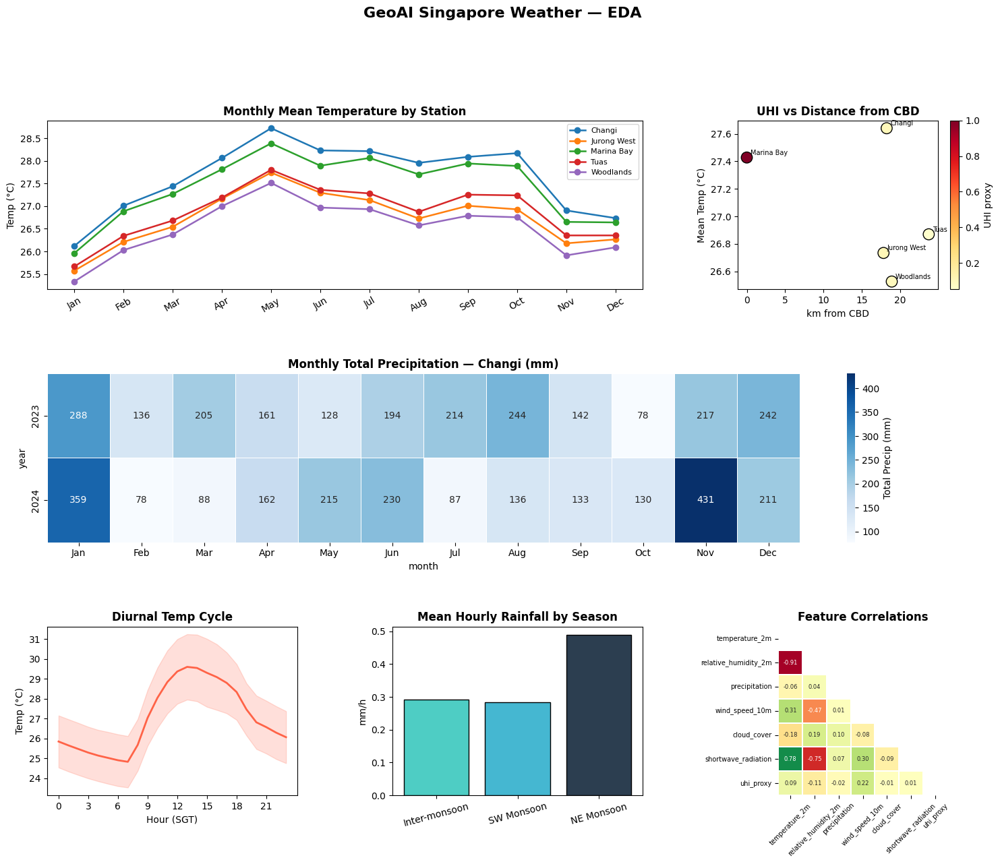

🗺️  Map saved



🤖 Training XGBoost — temperature...
🤖 Training XGBoost — rainfall...

📈 XGBoost Results:
----------------------------------------------------------------------
Temperature (°C)                       MAE=0.2558  RMSE=0.3416  R²=0.9809
Precipitation (mm/h)                   MAE=0.4074  RMSE=1.1526  R²=0.4563

🔍 SHAP values (~20 s)...


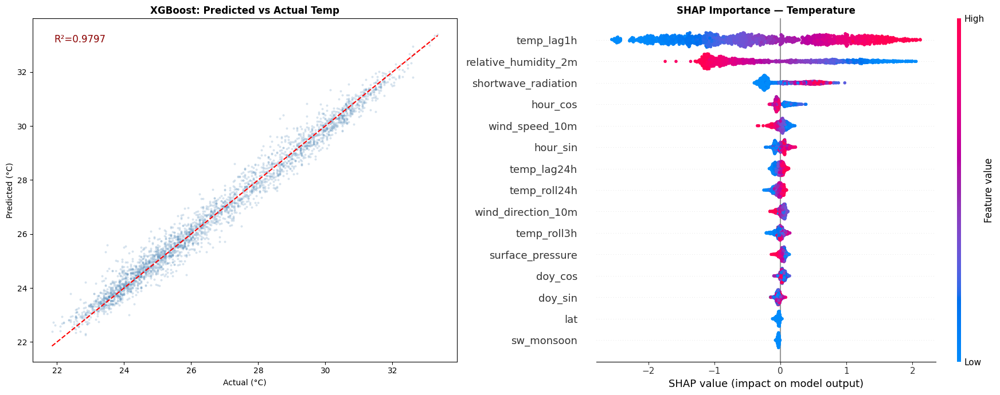


🧠 Preparing LSTM...
Training on cpu (30 epochs)...
  Ep   1/30  train=0.014728  val=0.008587
  Ep   5/30  train=0.005159  val=0.005164
  Ep  10/30  train=0.003783  val=0.003419
  Ep  15/30  train=0.003603  val=0.003423
  Ep  20/30  train=0.003401  val=0.003732
  Ep  25/30  train=0.003328  val=0.003223
  Ep  30/30  train=0.003251  val=0.003157

📈 LSTM Results:
----------------------------------------------------------------------
  LSTM +1h Temp                        MAE=0.6800  RMSE=0.8953  R²=0.7551
  LSTM +2h Temp                        MAE=0.6924  RMSE=0.9080  R²=0.7480
  LSTM +3h Temp                        MAE=0.7226  RMSE=0.9405  R²=0.7295
  LSTM +4h Temp                        MAE=0.7461  RMSE=0.9625  R²=0.7166
  LSTM +5h Temp                        MAE=0.7564  RMSE=0.9762  R²=0.7083
  LSTM +6h Temp                        MAE=0.7708  RMSE=1.0001  R²=0.6937


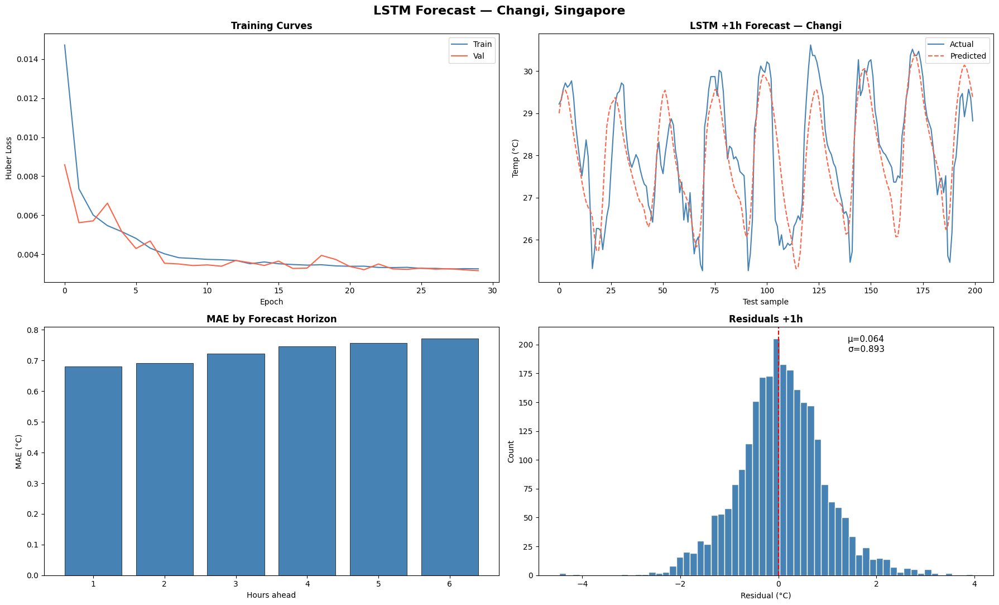


🗺️  IDW spatial interpolation...


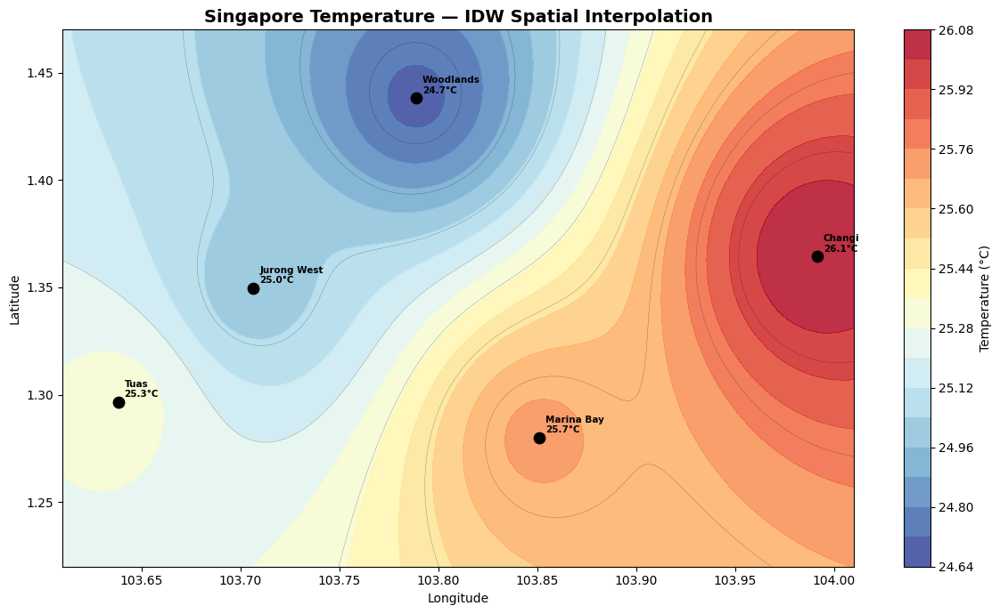


GeoAI Singapore Weather Modelling — Complete
  Period      : 2023-01-01 → 2024-12-31
  Stations    : 5
  Rows        : 87,600
  XGB Temp    : MAE = 0.256 °C
  XGB Rain    : MAE = 0.4074 mm/h
  LSTM +1h    : MAE = 0.680 °C
  LSTM +6h    : MAE = 0.771 °C

Outputs: eda_singapore.png | xgboost_results.png | lstm_results.png | spatial_interpolation.png | singapore_weather_map.html


In [3]:
# =============================================================================
# GeoAI Weather Modelling & Prediction — Singapore (Rate-limit safe)
# =============================================================================

# ── 0. INSTALL ───────────────────────────────────────────────────────────────
import subprocess, sys
pkgs = [
    "openmeteo-requests", "requests-cache", "retry-requests",
    "xgboost", "shap", "folium", "scikit-learn", "torch", "tqdm"
]
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q"] + pkgs)

# ── 1. IMPORTS ───────────────────────────────────────────────────────────────
import warnings; warnings.filterwarnings("ignore")
import time, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import folium
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import shap
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import openmeteo_requests, requests_cache
from retry_requests import retry
from tqdm import tqdm
from IPython.display import display

print("✅ All packages loaded")

# ── 2. FETCH DATA — with rate-limit protection ────────────────────────────────
# Reduced to 5 stations + 1-year window to stay under free-tier limits
SINGAPORE_STATIONS = {
    "Changi"      : (1.3644, 103.9915),
    "Jurong West" : (1.3496, 103.7065),
    "Woodlands"   : (1.4382, 103.7888),
    "Tuas"        : (1.2966, 103.6382),
    "Marina Bay"  : (1.2800, 103.8509),
}

START_DATE = "2023-01-01"
END_DATE   = "2024-12-31"

HOURLY_VARS = [
    "temperature_2m", "relative_humidity_2m", "precipitation",
    "wind_speed_10m", "wind_direction_10m", "surface_pressure",
    "cloud_cover", "shortwave_radiation"
]

# Cache avoids re-fetching on re-run; retry handles transient failures
cache_session = requests_cache.CachedSession('.omcache', expire_after=86400)
retry_session = retry(cache_session, retries=5, backoff_factor=2)   # exponential back-off
om_client     = openmeteo_requests.Client(session=retry_session)

def fetch_station(name, lat, lon, retries=5):
    """Fetch one station with manual back-off on rate-limit errors."""
    params = {
        "latitude": lat, "longitude": lon,
        "start_date": START_DATE, "end_date": END_DATE,
        "hourly": HOURLY_VARS, "timezone": "Asia/Singapore"
    }
    for attempt in range(1, retries + 1):
        try:
            resp = om_client.weather_api(
                "https://archive-api.open-meteo.com/v1/archive", params=params)
            r    = resp[0].Hourly()
            n    = r.Variables(0).ValuesAsNumpy().shape[0]
            df   = pd.DataFrame({
                "time": pd.date_range(
                    start=pd.to_datetime(resp[0].Hourly().Time(), unit="s", utc=True
                          ).tz_convert("Asia/Singapore"),
                    periods=n, freq="h"),
                **{v: r.Variables(i).ValuesAsNumpy() for i, v in enumerate(HOURLY_VARS)}
            })
            df["station"] = name
            df["lat"]     = lat
            df["lon"]     = lon
            return df
        except Exception as e:
            wait = 65 * attempt          # 65 s, 130 s, 195 s …
            print(f"  ⚠️  {name} attempt {attempt} failed: {e}")
            print(f"     Waiting {wait}s before retry...")
            time.sleep(wait)
    raise RuntimeError(f"Could not fetch {name} after {retries} attempts")

all_dfs = []
print("Fetching weather data (pausing 15 s between stations)...")
for i, (station, (lat, lon)) in enumerate(SINGAPORE_STATIONS.items()):
    print(f"  [{i+1}/{len(SINGAPORE_STATIONS)}] {station}...")
    df = fetch_station(station, lat, lon)
    all_dfs.append(df)
    if i < len(SINGAPORE_STATIONS) - 1:
        time.sleep(15)          # 15-second pause between stations

raw = pd.concat(all_dfs, ignore_index=True)
raw.set_index("time", inplace=True)
print(f"\n📦 Raw dataset: {raw.shape[0]:,} rows × {raw.shape[1]} columns")
display(raw.head(3))

# ── 3. FEATURE ENGINEERING ───────────────────────────────────────────────────
CBD_LAT, CBD_LON = 1.2800, 103.8509

def haversine(lat1, lon1, lat2=CBD_LAT, lon2=CBD_LON):
    R = 6371
    dphi = np.radians(lat2 - lat1)
    dlam = np.radians(lon2 - lon1)
    a = (np.sin(dphi/2)**2 +
         np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlam/2)**2)
    return R * 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))

raw["dist_cbd_km"] = haversine(raw["lat"], raw["lon"])
raw["uhi_proxy"]   = np.exp(-raw["dist_cbd_km"] / 8.0)

raw["hour"]       = raw.index.hour
raw["month"]      = raw.index.month
raw["dayofyear"]  = raw.index.dayofyear
raw["hour_sin"]   = np.sin(2*np.pi*raw["hour"]/24)
raw["hour_cos"]   = np.cos(2*np.pi*raw["hour"]/24)
raw["month_sin"]  = np.sin(2*np.pi*raw["month"]/12)
raw["month_cos"]  = np.cos(2*np.pi*raw["month"]/12)
raw["doy_sin"]    = np.sin(2*np.pi*raw["dayofyear"]/365)
raw["doy_cos"]    = np.cos(2*np.pi*raw["dayofyear"]/365)
raw["ne_monsoon"] = raw["month"].isin([11,12,1]).astype(int)
raw["sw_monsoon"] = raw["month"].isin([6,7,8,9]).astype(int)

raw.sort_values(["station", raw.index.name], inplace=True)
for lag in [1, 3, 6, 12, 24]:
    raw[f"temp_lag{lag}h"] = raw.groupby("station")["temperature_2m"].shift(lag)
    raw[f"rain_lag{lag}h"] = raw.groupby("station")["precipitation"].shift(lag)
for win in [3, 6, 12, 24]:
    raw[f"temp_roll{win}h"] = raw.groupby("station")["temperature_2m"].transform(
        lambda x: x.shift(1).rolling(win).mean())
    raw[f"rain_roll{win}h"] = raw.groupby("station")["precipitation"].transform(
        lambda x: x.shift(1).rolling(win).sum())

raw.dropna(inplace=True)
print(f"🔧 Features done: {raw.shape[0]:,} rows × {raw.shape[1]} cols")

# ── 4. EDA ───────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 13))
gs  = GridSpec(3, 3, figure=fig, hspace=0.5, wspace=0.38)

# Monthly mean temp
ax1 = fig.add_subplot(gs[0, :2])
for stn, grp in raw.groupby("station"):
    m = grp.groupby("month")["temperature_2m"].mean()
    ax1.plot(m.index, m.values, marker="o", label=stn, linewidth=1.8)
ax1.set_title("Monthly Mean Temperature by Station", fontweight="bold")
ax1.set_xticks(range(1,13))
ax1.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun",
                      "Jul","Aug","Sep","Oct","Nov","Dec"], rotation=30)
ax1.set_ylabel("Temp (°C)"); ax1.legend(fontsize=8)

# UHI scatter
ax2 = fig.add_subplot(gs[0, 2])
sm = raw.groupby("station").agg(
    t=("temperature_2m","mean"), u=("uhi_proxy","first"), d=("dist_cbd_km","first")
).reset_index()
sc = ax2.scatter(sm["d"], sm["t"], c=sm["u"], cmap="YlOrRd", s=140, edgecolors="k")
for _, row in sm.iterrows():
    ax2.annotate(row["station"], (row["d"], row["t"]),
                 fontsize=7, xytext=(4,3), textcoords="offset points")
plt.colorbar(sc, ax=ax2, label="UHI proxy")
ax2.set_title("UHI vs Distance from CBD", fontweight="bold")
ax2.set_xlabel("km from CBD"); ax2.set_ylabel("Mean Temp (°C)")

# Rainfall heatmap — Changi
ax3 = fig.add_subplot(gs[1, :])
c = raw[raw["station"]=="Changi"].copy()
c["date"] = c.index.date
dr = c.groupby("date")["precipitation"].sum().reset_index()
dr["date"]  = pd.to_datetime(dr["date"])
dr["month"] = dr["date"].dt.month
dr["year"]  = dr["date"].dt.year
piv = dr.pivot_table(index="year", columns="month", values="precipitation", aggfunc="sum")
sns.heatmap(piv, ax=ax3, cmap="Blues", annot=True, fmt=".0f",
            linewidths=0.5, cbar_kws={"label":"Total Precip (mm)"})
ax3.set_title("Monthly Total Precipitation — Changi (mm)", fontweight="bold")
ax3.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun",
                      "Jul","Aug","Sep","Oct","Nov","Dec"])

# Diurnal cycle
ax4 = fig.add_subplot(gs[2, 0])
d = raw.groupby("hour")["temperature_2m"].agg(["mean","std"])
ax4.fill_between(d.index, d["mean"]-d["std"], d["mean"]+d["std"],
                  alpha=0.2, color="tomato")
ax4.plot(d.index, d["mean"], color="tomato", linewidth=2)
ax4.set_title("Diurnal Temp Cycle", fontweight="bold")
ax4.set_xlabel("Hour (SGT)"); ax4.set_ylabel("Temp (°C)")
ax4.set_xticks(range(0,24,3))

# Monsoon bars
ax5 = fig.add_subplot(gs[2, 1])
vals = [
    raw[(raw["ne_monsoon"]==0)&(raw["sw_monsoon"]==0)]["precipitation"].mean(),
    raw[raw["sw_monsoon"]==1]["precipitation"].mean(),
    raw[raw["ne_monsoon"]==1]["precipitation"].mean(),
]
ax5.bar(["Inter-monsoon","SW Monsoon","NE Monsoon"], vals,
        color=["#4ECDC4","#45B7D1","#2C3E50"], edgecolor="k")
ax5.set_title("Mean Hourly Rainfall by Season", fontweight="bold")
ax5.set_ylabel("mm/h"); ax5.tick_params(axis="x", rotation=15)

# Correlations
ax6 = fig.add_subplot(gs[2, 2])
cc = ["temperature_2m","relative_humidity_2m","precipitation",
      "wind_speed_10m","cloud_cover","shortwave_radiation","uhi_proxy"]
corr = raw[cc].corr()
sns.heatmap(corr, ax=ax6, mask=np.triu(np.ones_like(corr,dtype=bool)),
            cmap="RdYlGn", center=0, annot=True, fmt=".2f",
            annot_kws={"size":6}, linewidths=0.3, square=True, cbar=False)
ax6.set_title("Feature Correlations", fontweight="bold")
ax6.tick_params(axis="x", rotation=45, labelsize=7)
ax6.tick_params(axis="y", labelsize=7)

plt.suptitle("GeoAI Singapore Weather — EDA", fontsize=16, fontweight="bold", y=1.01)
plt.savefig("eda_singapore.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 5. FOLIUM MAP ────────────────────────────────────────────────────────────
m = folium.Map(location=[1.35, 103.82], zoom_start=11, tiles="CartoDB Positron")
for stn, (lat, lon) in SINGAPORE_STATIONS.items():
    mt = raw[raw["station"]==stn]["temperature_2m"].mean()
    mr = raw[raw["station"]==stn]["precipitation"].mean()
    color = "red" if mt > 28.5 else ("orange" if mt > 27.5 else "blue")
    folium.CircleMarker(
        [lat, lon], radius=13, color=color, fill=True,
        fill_color=color, fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>{stn}</b><br>Temp: {mt:.1f}°C<br>Rain: {mr:.3f} mm/h", max_width=200),
        tooltip=stn).add_to(m)
folium.Marker([CBD_LAT, CBD_LON], popup="CBD Reference",
              icon=folium.Icon(color="black", icon="star")).add_to(m)
m.save("singapore_weather_map.html")
print("🗺️  Map saved"); display(m)

# ── 6. XGBoost ───────────────────────────────────────────────────────────────
FEAT = [
    "lat","lon","dist_cbd_km","uhi_proxy",
    "hour_sin","hour_cos","month_sin","month_cos","doy_sin","doy_cos",
    "ne_monsoon","sw_monsoon",
    "relative_humidity_2m","wind_speed_10m","wind_direction_10m",
    "surface_pressure","cloud_cover","shortwave_radiation",
    "temp_lag1h","temp_lag3h","temp_lag6h","temp_lag12h","temp_lag24h",
    "rain_lag1h","rain_lag3h","rain_lag6h","rain_lag12h","rain_lag24h",
    "temp_roll3h","temp_roll6h","temp_roll12h","temp_roll24h",
    "rain_roll3h","rain_roll6h","rain_roll12h","rain_roll24h",
]

X      = raw[FEAT].values
y_temp = raw["temperature_2m"].values
y_rain = raw["precipitation"].values
sp     = int(0.85 * len(X))
X_tr, X_te     = X[:sp], X[sp:]
yt_tr, yt_te   = y_temp[:sp], y_temp[sp:]
yr_tr, yr_te   = y_rain[:sp], y_rain[sp:]

def metrics(yt, yp, label):
    mae  = mean_absolute_error(yt, yp)
    rmse = np.sqrt(mean_squared_error(yt, yp))
    r2   = r2_score(yt, yp)
    print(f"{label:38s} MAE={mae:.4f}  RMSE={rmse:.4f}  R²={r2:.4f}")
    return mae

print("\n🤖 Training XGBoost — temperature...")
xgb_t = xgb.XGBRegressor(n_estimators=400, max_depth=7, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8, min_child_weight=5, gamma=0.1,
    tree_method="hist", device="cpu", early_stopping_rounds=25,
    eval_metric="mae", verbosity=0)
xgb_t.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], verbose=False)

print("🤖 Training XGBoost — rainfall...")
xgb_r = xgb.XGBRegressor(n_estimators=400, max_depth=6, learning_rate=0.05,
    subsample=0.7, colsample_bytree=0.7, min_child_weight=10, gamma=0.5,
    tree_method="hist", device="cpu", early_stopping_rounds=25,
    eval_metric="mae", verbosity=0)
xgb_r.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], verbose=False)

pt = xgb_t.predict(X_te)
pr = np.clip(xgb_r.predict(X_te), 0, None)

print("\n📈 XGBoost Results:"); print("-"*70)
metrics(yt_te, pt, "Temperature (°C)")
metrics(yr_te, pr, "Precipitation (mm/h)")

print("\n🔍 SHAP values (~20 s)...")
exp  = shap.TreeExplainer(xgb_t)
sv   = exp.shap_values(X_te[:1500])

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
n = 3000
axes[0].scatter(yt_te[:n], pt[:n], alpha=0.15, s=4, color="steelblue")
lo, hi = yt_te[:n].min(), yt_te[:n].max()
axes[0].plot([lo,hi],[lo,hi],"r--",lw=1.5)
axes[0].set_title("XGBoost: Predicted vs Actual Temp", fontweight="bold")
axes[0].set_xlabel("Actual (°C)"); axes[0].set_ylabel("Predicted (°C)")
axes[0].text(0.05, 0.93, f"R²={r2_score(yt_te[:n],pt[:n]):.4f}",
             transform=axes[0].transAxes, fontsize=12, color="darkred")
plt.sca(axes[1])
shap.summary_plot(sv, X_te[:1500], feature_names=FEAT,
                  max_display=15, show=False, plot_size=None)
axes[1].set_title("SHAP Importance — Temperature", fontweight="bold")
plt.tight_layout()
plt.savefig("xgboost_results.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 7. LSTM with Attention ───────────────────────────────────────────────────
print("\n🧠 Preparing LSTM...")
ldf = raw[raw["station"]=="Changi"][[
    "temperature_2m","precipitation","relative_humidity_2m",
    "cloud_cover","wind_speed_10m","shortwave_radiation"]].sort_index().dropna()

SEQ, STEPS, TCOL = 24, 6, 0
sc2    = MinMaxScaler()
scaled = sc2.fit_transform(ldf.values)

def make_seq(data, seq, steps):
    X, y = [], []
    for i in range(len(data)-seq-steps+1):
        X.append(data[i:i+seq])
        y.append(data[i+seq:i+seq+steps, TCOL])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

Xs, ys = make_seq(scaled, SEQ, STEPS)
sp2    = int(0.85*len(Xs))
trDL   = DataLoader(TensorDataset(torch.from_numpy(Xs[:sp2]), torch.from_numpy(ys[:sp2])),
                    batch_size=256, shuffle=True)
teDL   = DataLoader(TensorDataset(torch.from_numpy(Xs[sp2:]), torch.from_numpy(ys[sp2:])),
                    batch_size=512, shuffle=False)

class WeatherLSTM(nn.Module):
    def __init__(self, inp, h=128, layers=2, drop=0.2, steps=6):
        super().__init__()
        self.lstm = nn.LSTM(inp, h, layers, batch_first=True, dropout=drop)
        self.attn = nn.MultiheadAttention(h, num_heads=4, dropout=0.1, batch_first=True)
        self.fc   = nn.Sequential(nn.Linear(h,64), nn.ReLU(),
                                   nn.Dropout(0.1), nn.Linear(64, steps))
    def forward(self, x):
        o, _ = self.lstm(x)
        a, _ = self.attn(o, o, o)
        return self.fc(a[:, -1, :])

DEV   = "cuda" if torch.cuda.is_available() else "cpu"
model = WeatherLSTM(ldf.shape[1], steps=STEPS).to(DEV)
opt   = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
sch   = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=3, factor=0.5)
loss_fn = nn.HuberLoss(delta=0.1)

EPOCHS = 30
tr_l, va_l = [], []
print(f"Training on {DEV} ({EPOCHS} epochs)...")
for ep in range(1, EPOCHS+1):
    model.train(); tl = 0
    for xb, yb in trDL:
        xb, yb = xb.to(DEV), yb.to(DEV)
        opt.zero_grad()
        l = loss_fn(model(xb), yb)
        l.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step(); tl += l.item()
    model.eval(); vl = 0
    with torch.no_grad():
        for xb, yb in teDL:
            vl += loss_fn(model(xb.to(DEV)), yb.to(DEV)).item()
    tl /= len(trDL); vl /= len(teDL)
    tr_l.append(tl); va_l.append(vl)
    sch.step(vl)
    if ep % 5 == 0 or ep == 1:
        print(f"  Ep {ep:3d}/{EPOCHS}  train={tl:.6f}  val={vl:.6f}")

model.eval()
preds, trues = [], []
with torch.no_grad():
    for xb, yb in teDL:
        preds.append(model(xb.to(DEV)).cpu().numpy())
        trues.append(yb.numpy())
preds = np.vstack(preds); trues = np.vstack(trues)

def inv(arr):
    d = np.zeros((arr.shape[0]*arr.shape[1], ldf.shape[1]))
    d[:, TCOL] = arr.flatten()
    return sc2.inverse_transform(d)[:, TCOL].reshape(arr.shape)

pi, ti = inv(preds), inv(trues)

print("\n📈 LSTM Results:"); print("-"*70)
maes = [metrics(ti[:,s], pi[:,s], f"  LSTM +{s+1}h Temp") for s in range(STEPS)]

fig, axes = plt.subplots(2, 2, figsize=(18, 11))
axes[0,0].plot(tr_l, label="Train", color="steelblue")
axes[0,0].plot(va_l, label="Val",   color="tomato")
axes[0,0].set_title("Training Curves", fontweight="bold")
axes[0,0].set_xlabel("Epoch"); axes[0,0].set_ylabel("Huber Loss"); axes[0,0].legend()

axes[0,1].plot(ti[:200,0], label="Actual",    color="steelblue", lw=1.5)
axes[0,1].plot(pi[:200,0], label="Predicted", color="tomato",    lw=1.5, ls="--")
axes[0,1].set_title("LSTM +1h Forecast — Changi", fontweight="bold")
axes[0,1].set_xlabel("Test sample"); axes[0,1].set_ylabel("Temp (°C)"); axes[0,1].legend()

axes[1,0].bar(range(1,STEPS+1), maes, color="steelblue", edgecolor="k", lw=0.5)
axes[1,0].set_title("MAE by Forecast Horizon", fontweight="bold")
axes[1,0].set_xlabel("Hours ahead"); axes[1,0].set_ylabel("MAE (°C)")
axes[1,0].set_xticks(range(1,STEPS+1))

res = (pi[:,0]-ti[:,0]).flatten()
axes[1,1].hist(res, bins=60, color="steelblue", edgecolor="white", lw=0.3)
axes[1,1].axvline(0, color="red", ls="--")
axes[1,1].set_title("Residuals +1h", fontweight="bold")
axes[1,1].set_xlabel("Residual (°C)"); axes[1,1].set_ylabel("Count")
axes[1,1].text(0.68, 0.9, f"μ={res.mean():.3f}\nσ={res.std():.3f}",
               transform=axes[1,1].transAxes, fontsize=11)

plt.suptitle("LSTM Forecast — Changi, Singapore", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("lstm_results.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 8. SPATIAL INTERPOLATION (IDW) ───────────────────────────────────────────
print("\n🗺️  IDW spatial interpolation...")
snap      = raw.groupby("station").last().reset_index()
obs_lats  = snap["lat"].values
obs_lons  = snap["lon"].values
obs_temps = snap["temperature_2m"].values

glats = np.linspace(1.22, 1.47, 80)
glons = np.linspace(103.61, 104.01, 100)
glon, glat = np.meshgrid(glons, glats)

def idw(glon, glat, olons, olats, ovals, p=2, eps=1e-10):
    Z = np.zeros_like(glon)
    for i in range(glon.shape[0]):
        for j in range(glon.shape[1]):
            d = np.sqrt((olats-glat[i,j])**2 + (olons-glon[i,j])**2) + eps
            w = 1/d**p
            Z[i,j] = (w*ovals).sum()/w.sum()
    return Z

Z = idw(glon, glat, obs_lons, obs_lats, obs_temps)

fig, ax = plt.subplots(figsize=(12, 7))
cf = ax.contourf(glon, glat, Z, levels=20, cmap="RdYlBu_r", alpha=0.85)
ax.contour(glon, glat, Z, levels=10, colors="k", linewidths=0.3, alpha=0.4)
plt.colorbar(cf, ax=ax, label="Temperature (°C)")
for stn, (lat, lon) in SINGAPORE_STATIONS.items():
    row = snap[snap["station"]==stn]
    t   = row["temperature_2m"].values[0] if not row.empty else np.nan
    ax.scatter(lon, lat, c="k", s=80, zorder=5)
    ax.annotate(f"{stn}\n{t:.1f}°C", (lon, lat),
                xytext=(5,4), textcoords="offset points", fontsize=7.5, fontweight="bold")
ax.set_title("Singapore Temperature — IDW Spatial Interpolation", fontweight="bold", fontsize=14)
ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
ax.set_xlim(103.61, 104.01); ax.set_ylim(1.22, 1.47)
plt.tight_layout()
plt.savefig("spatial_interpolation.png", dpi=150, bbox_inches="tight")
plt.show()

# ── 9. SUMMARY ────────────────────────────────────────────────────────────────
print("\n" + "="*70)
print("GeoAI Singapore Weather Modelling — Complete")
print("="*70)
print(f"  Period      : {START_DATE} → {END_DATE}")
print(f"  Stations    : {len(SINGAPORE_STATIONS)}")
print(f"  Rows        : {raw.shape[0]:,}")
print(f"  XGB Temp    : MAE = {mean_absolute_error(yt_te, pt):.3f} °C")
print(f"  XGB Rain    : MAE = {mean_absolute_error(yr_te, pr):.4f} mm/h")
print(f"  LSTM +1h    : MAE = {maes[0]:.3f} °C")
print(f"  LSTM +6h    : MAE = {maes[-1]:.3f} °C")
print("\nOutputs: eda_singapore.png | xgboost_results.png |",
      "lstm_results.png | spatial_interpolation.png | singapore_weather_map.html")
print("="*70)

✅ All packages loaded
   Device: cpu

📡 Fetching historical data (20 stations — cached after first run)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/20] Pasir Ris...
  [18/20] Ang Mo Kio...
  [19/20] Sentosa...
  [20/20] Tengah...
📦 Historical: 350,880 rows

📡 Fetching 7-day forecast (20 stations)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/

ValueError: zero-size array to reduction operation fmin which has no identity

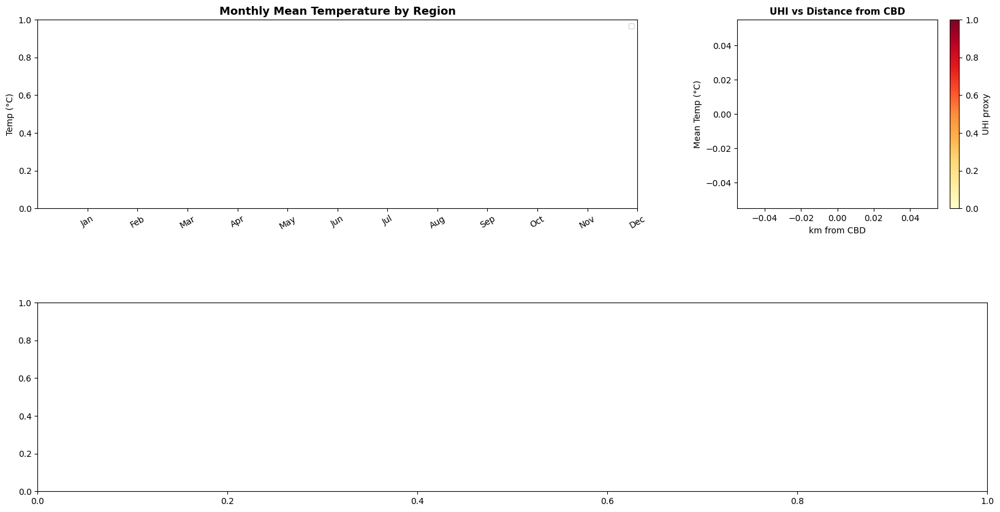

In [4]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║   GeoAI Singapore — 7-Day Weather Forecast                             ║
# ║   20 Stations │ Interactive Map │ ML + Deep Learning │ Accuracy Report ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ── 0. INSTALL ──────────────────────────────────────────────────────────────
import subprocess, sys
pkgs = [
    'openmeteo-requests', 'requests-cache', 'retry-requests',
    'xgboost', 'lightgbm', 'shap', 'folium', 'branca',
    'scikit-learn', 'torch', 'tqdm', 'scipy'
]
subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q'] + pkgs)

import warnings; warnings.filterwarnings('ignore')
import time, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import folium
from folium import plugins
import branca.colormap as cm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb, lightgbm as lgb, shap
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import openmeteo_requests, requests_cache
from retry_requests import retry
from tqdm import tqdm
from IPython.display import display

print('✅ All packages loaded')
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'   Device: {DEVICE}')

# ── 1. STATIONS (20 locations across all Singapore regions) ─────────────────
STATIONS = {
    'Changi Airport' : (1.3644, 103.9915, 'East'),
    'Jurong West'    : (1.3496, 103.7065, 'West'),
    'Woodlands'      : (1.4382, 103.7888, 'North'),
    'Paya Lebar'     : (1.3580, 103.9140, 'East'),
    'Tuas'           : (1.2966, 103.6382, 'West'),
    'Admiralty'      : (1.4404, 103.8009, 'North'),
    'Seletar'        : (1.4163, 103.8671, 'North'),
    'Bukit Timah'    : (1.3520, 103.7767, 'Central'),
    'Marina Bay'     : (1.2800, 103.8509, 'Central'),
    'Pulau Ubin'     : (1.4044, 103.9674, 'East'),
    'Clementi'       : (1.3162, 103.7649, 'West'),
    'Queenstown'     : (1.2942, 103.7861, 'Central'),
    'Bishan'         : (1.3526, 103.8352, 'Central'),
    'Tampines'       : (1.3540, 103.9440, 'East'),
    'Yishun'         : (1.4304, 103.8354, 'North'),
    'Punggol'        : (1.3984, 103.9072, 'North-East'),
    'Pasir Ris'      : (1.3720, 103.9490, 'East'),
    'Ang Mo Kio'     : (1.3691, 103.8454, 'North'),
    'Sentosa'        : (1.2494, 103.8303, 'South'),
    'Tengah'         : (1.3747, 103.7240, 'West'),
}
CBD_LAT, CBD_LON = 1.2800, 103.8509
START_DATE, END_DATE = '2023-01-01', '2024-12-31'
HOURLY_VARS = [
    'temperature_2m','relative_humidity_2m','precipitation',
    'wind_speed_10m','wind_direction_10m','surface_pressure',
    'cloud_cover','shortwave_radiation','dew_point_2m',
    'apparent_temperature','precipitation_probability'
]

# ── API CLIENT ───────────────────────────────────────────────────────────────
cache_sess = requests_cache.CachedSession('.omcache7d', expire_after=86400)
retry_sess = retry(cache_sess, retries=6, backoff_factor=2)
om = openmeteo_requests.Client(session=retry_sess)

def _fetch(url, name, lat, lon, extra_params={}, max_tries=6):
    params = {'latitude':lat,'longitude':lon,'hourly':HOURLY_VARS,
              'timezone':'Asia/Singapore', **extra_params}
    for attempt in range(1, max_tries+1):
        try:
            resp = om.weather_api(url, params=params)
            h = resp[0].Hourly()
            n = h.Variables(0).ValuesAsNumpy().shape[0]
            df = pd.DataFrame({
                'time': pd.date_range(
                    start=pd.to_datetime(h.Time(),unit='s',utc=True).tz_convert('Asia/Singapore'),
                    periods=n, freq='h'),
                **{v: h.Variables(i).ValuesAsNumpy() for i,v in enumerate(HOURLY_VARS)}
            })
            df['station']=name; df['lat']=lat; df['lon']=lon
            return df
        except Exception as e:
            wait = 70*attempt
            print(f'  ⚠️  {name} attempt {attempt} failed — waiting {wait}s...')
            time.sleep(wait)
    raise RuntimeError(f'Failed: {name}')

# ── FETCH HISTORICAL ─────────────────────────────────────────────────────────
print(f'\n📡 Fetching historical data ({len(STATIONS)} stations — cached after first run)...')
hist_dfs = []
for i,(name,(lat,lon,reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://archive-api.open-meteo.com/v1/archive', name, lat, lon,
                {'start_date':START_DATE,'end_date':END_DATE})
    df['region'] = reg; hist_dfs.append(df)
    if i < len(STATIONS)-1: time.sleep(12)

raw = pd.concat(hist_dfs, ignore_index=True)
raw.set_index('time', inplace=True)
print(f'📦 Historical: {raw.shape[0]:,} rows')

# ── FETCH 7-DAY FORECAST ─────────────────────────────────────────────────────
print(f'\n📡 Fetching 7-day forecast ({len(STATIONS)} stations)...')
fcast_dfs = []
for i,(name,(lat,lon,reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://api.open-meteo.com/v1/forecast', name, lat, lon,
                {'forecast_days':7})
    df['region'] = reg; fcast_dfs.append(df)
    if i < len(STATIONS)-1: time.sleep(8)

fcast_raw = pd.concat(fcast_dfs, ignore_index=True)
fcast_raw.set_index('time', inplace=True)
print(f'✅ Forecast: {fcast_raw.shape[0]:,} rows')

# ── 2. FEATURE ENGINEERING ───────────────────────────────────────────────────
def haversine_km(lat1, lon1, lat2=CBD_LAT, lon2=CBD_LON):
    R=6371.0; dphi=np.radians(lat2-lat1); dlam=np.radians(lon2-lon1)
    a=np.sin(dphi/2)**2+np.cos(np.radians(lat1))*np.cos(np.radians(lat2))*np.sin(dlam/2)**2
    return R*2*np.arctan2(np.sqrt(a),np.sqrt(1-a))

def add_features(df):
    df=df.copy()
    df['dist_cbd']    = haversine_km(df['lat'], df['lon'])
    df['uhi']         = np.exp(-df['dist_cbd']/7.0)
    df['coast_proxy'] = np.minimum(
        haversine_km(df['lat'],df['lon'],1.28,103.85),
        haversine_km(df['lat'],df['lon'],1.44,103.82))
    idx=df.index
    df['hour']=idx.hour; df['month']=idx.month; df['doy']=idx.dayofyear
    df['hour_sin']=np.sin(2*np.pi*df['hour']/24)
    df['hour_cos']=np.cos(2*np.pi*df['hour']/24)
    df['month_sin']=np.sin(2*np.pi*df['month']/12)
    df['month_cos']=np.cos(2*np.pi*df['month']/12)
    df['doy_sin']=np.sin(2*np.pi*df['doy']/365)
    df['doy_cos']=np.cos(2*np.pi*df['doy']/365)
    df['ne_monsoon']=df['month'].isin([11,12,1]).astype(int)
    df['sw_monsoon']=df['month'].isin([6,7,8,9]).astype(int)
    return df

raw = add_features(raw)
raw.sort_values(['station',raw.index.name], inplace=True)
for lag in [1,3,6,12,24,48]:
    raw[f'temp_lag{lag}']=raw.groupby('station')['temperature_2m'].shift(lag)
    raw[f'rain_lag{lag}']=raw.groupby('station')['precipitation'].shift(lag)
    raw[f'hum_lag{lag}'] =raw.groupby('station')['relative_humidity_2m'].shift(lag)
for win in [3,6,12,24,48]:
    raw[f'temp_roll{win}']=raw.groupby('station')['temperature_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())
    raw[f'rain_roll{win}']=raw.groupby('station')['precipitation'].transform(
        lambda x: x.shift(1).rolling(win).sum())
    raw[f'hum_roll{win}'] =raw.groupby('station')['relative_humidity_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())
raw.dropna(inplace=True)
print(f'🔧 Features: {raw.shape[0]:,} rows × {raw.shape[1]} cols')

# ── 3. EDA ───────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(20,16)); gs=GridSpec(3,3,hspace=0.5,wspace=0.4)

ax1=fig.add_subplot(gs[0,:2])
for reg,grp in raw.groupby('region'):
    m=grp.groupby('month')['temperature_2m'].mean()
    ax1.plot(m.index,m.values,marker='o',label=reg,lw=2)
ax1.set_title('Monthly Mean Temperature by Region',fontweight='bold',fontsize=13)
ax1.set_xticks(range(1,13))
ax1.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'],rotation=30)
ax1.set_ylabel('Temp (°C)'); ax1.legend(fontsize=8,ncol=2)

ax2=fig.add_subplot(gs[0,2])
sm=raw.groupby('station').agg(t=('temperature_2m','mean'),u=('uhi','first'),d=('dist_cbd','first')).reset_index()
sc=ax2.scatter(sm['d'],sm['t'],c=sm['u'],cmap='YlOrRd',s=100,edgecolors='k',zorder=3)
for _,r in sm.iterrows(): ax2.annotate(r['station'],(r['d'],r['t']),fontsize=6,xytext=(3,2),textcoords='offset points')
plt.colorbar(sc,ax=ax2,label='UHI proxy')
ax2.set_title('UHI vs Distance from CBD',fontweight='bold',fontsize=11)
ax2.set_xlabel('km from CBD'); ax2.set_ylabel('Mean Temp (°C)')

ax3=fig.add_subplot(gs[1,:])
ch=raw[raw['station']=='Changi Airport'].copy(); ch['date']=ch.index.date
dr=ch.groupby('date')['precipitation'].sum().reset_index()
dr['date']=pd.to_datetime(dr['date']); dr['month']=dr['date'].dt.month; dr['year']=dr['date'].dt.year
piv=dr.pivot_table(index='year',columns='month',values='precipitation',aggfunc='sum')
sns.heatmap(piv,ax=ax3,cmap='Blues',annot=True,fmt='.0f',linewidths=0.5,cbar_kws={'label':'Total Precip (mm)'})
ax3.set_title('Monthly Total Precipitation — Changi Airport (mm)',fontweight='bold',fontsize=12)
ax3.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

ax4=fig.add_subplot(gs[2,0])
for reg,grp in raw.groupby('region'):
    d=grp.groupby('hour')['temperature_2m'].mean()
    ax4.plot(d.index,d.values,lw=1.5,label=reg)
ax4.set_title('Diurnal Temp Cycle by Region',fontweight='bold')
ax4.set_xlabel('Hour (SGT)'); ax4.set_ylabel('Temp (°C)'); ax4.set_xticks(range(0,24,4)); ax4.legend(fontsize=7)

ax5=fig.add_subplot(gs[2,1])
vals=[raw[(raw['ne_monsoon']==0)&(raw['sw_monsoon']==0)]['precipitation'].mean(),
      raw[raw['sw_monsoon']==1]['precipitation'].mean(),
      raw[raw['ne_monsoon']==1]['precipitation'].mean()]
bars=ax5.bar(['Inter-monsoon','SW Monsoon','NE Monsoon'],vals,
             color=['#4ECDC4','#45B7D1','#2C3E50'],edgecolor='k')
for bar,v in zip(bars,vals): ax5.text(bar.get_x()+bar.get_width()/2,v+0.0003,f'{v:.4f}',ha='center',fontsize=9)
ax5.set_title('Mean Hourly Rainfall by Season',fontweight='bold')
ax5.set_ylabel('mm/h'); ax5.tick_params(axis='x',rotation=15)

ax6=fig.add_subplot(gs[2,2])
cc=['temperature_2m','relative_humidity_2m','precipitation','wind_speed_10m',
    'cloud_cover','shortwave_radiation','uhi','apparent_temperature']
corr=raw[cc].corr(); corr.index=corr.columns=['temp','rh','rain','wind','cloud','srad','uhi','app_t']
sns.heatmap(corr,ax=ax6,mask=np.triu(np.ones_like(corr,dtype=bool)),cmap='RdYlGn',center=0,
            annot=True,fmt='.2f',annot_kws={'size':6.5},linewidths=0.3,square=True,cbar=False)
ax6.set_title('Feature Correlations',fontweight='bold')
ax6.tick_params(axis='x',rotation=45,labelsize=8); ax6.tick_params(axis='y',labelsize=8)

plt.suptitle('GeoAI Singapore — 20-Station EDA',fontsize=16,fontweight='bold',y=1.01)
plt.savefig('eda_sg20.png',dpi=150,bbox_inches='tight'); plt.show()

# ── 4. ML — XGBoost + LightGBM Ensemble ─────────────────────────────────────
FEAT = [
    'lat','lon','dist_cbd','uhi','coast_proxy',
    'hour_sin','hour_cos','month_sin','month_cos','doy_sin','doy_cos',
    'ne_monsoon','sw_monsoon',
    'relative_humidity_2m','wind_speed_10m','wind_direction_10m',
    'surface_pressure','cloud_cover','shortwave_radiation',
    'dew_point_2m','apparent_temperature','precipitation_probability',
    'temp_lag1','temp_lag3','temp_lag6','temp_lag12','temp_lag24','temp_lag48',
    'rain_lag1','rain_lag3','rain_lag6','rain_lag12','rain_lag24',
    'hum_lag1','hum_lag3','hum_lag6','hum_lag12',
    'temp_roll3','temp_roll6','temp_roll12','temp_roll24','temp_roll48',
    'rain_roll3','rain_roll6','rain_roll12','rain_roll24',
    'hum_roll3','hum_roll6','hum_roll12','hum_roll24',
]
X=raw[FEAT].values; y_t=raw['temperature_2m'].values
y_r=raw['precipitation'].values; y_h=raw['relative_humidity_2m'].values
sp=int(0.85*len(X))
X_tr,X_te=X[:sp],X[sp:]; yt_tr,yt_te=y_t[:sp],y_t[sp:]
yr_tr,yr_te=y_r[:sp],y_r[sp:]; yh_tr,yh_te=y_h[:sp],y_h[sp:]

XP=dict(n_estimators=600,max_depth=8,learning_rate=0.04,subsample=0.8,
        colsample_bytree=0.8,min_child_weight=5,gamma=0.1,tree_method='hist',
        device='cpu',early_stopping_rounds=30,eval_metric='mae',verbosity=0,random_state=42)
LP=dict(n_estimators=600,max_depth=8,learning_rate=0.04,subsample=0.8,
        colsample_bytree=0.8,n_jobs=-1,random_state=42,verbose=-1)
CB=[lgb.early_stopping(30,verbose=False),lgb.log_evaluation(period=-1)]

print('\n🤖 Training ML models...')
xgb_t=xgb.XGBRegressor(**XP); xgb_t.fit(X_tr,yt_tr,eval_set=[(X_te,yt_te)],verbose=False)
lgb_t=lgb.LGBMRegressor(**LP); lgb_t.fit(X_tr,yt_tr,eval_set=[(X_te,yt_te)],callbacks=CB)
xgb_r=xgb.XGBRegressor(**{**XP,'max_depth':6,'min_child_weight':15,'gamma':0.5})
xgb_r.fit(X_tr,yr_tr,eval_set=[(X_te,yr_te)],verbose=False)
lgb_r=lgb.LGBMRegressor(**{**LP,'max_depth':6}); lgb_r.fit(X_tr,yr_tr,eval_set=[(X_te,yr_te)],callbacks=CB)
xgb_h=xgb.XGBRegressor(**XP); xgb_h.fit(X_tr,yh_tr,eval_set=[(X_te,yh_te)],verbose=False)

pt_e=0.5*xgb_t.predict(X_te)+0.5*lgb_t.predict(X_te)
pr_e=np.clip(0.5*xgb_r.predict(X_te)+0.5*lgb_r.predict(X_te),0,None)
ph  =xgb_h.predict(X_te)

def skill_score(yt,yp):
    return 1-mean_squared_error(yt,yp)/np.mean((yt-yt.mean())**2)

def full_metrics(yt,yp,label):
    mae=mean_absolute_error(yt,yp); rmse=np.sqrt(mean_squared_error(yt,yp))
    r2=r2_score(yt,yp); skill=skill_score(yt,yp); bias=(yp-yt).mean()
    print(f'  {label:42s} MAE={mae:.4f}  RMSE={rmse:.4f}  R²={r2:.4f}  Skill={skill:.4f}  Bias={bias:+.4f}')
    return dict(label=label,mae=mae,rmse=rmse,r2=r2,skill=skill,bias=bias)

print('\n📈 ML Accuracy Report:'); print('='*100)
all_metrics=[]
all_metrics.append(full_metrics(yt_te,xgb_t.predict(X_te),'XGBoost — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te,lgb_t.predict(X_te),'LightGBM — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te,pt_e,'Ensemble — Temperature (°C)'))
all_metrics.append(full_metrics(yr_te,np.clip(xgb_r.predict(X_te),0,None),'XGBoost — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te,np.clip(lgb_r.predict(X_te),0,None),'LightGBM — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te,pr_e,'Ensemble — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yh_te,ph,'XGBoost — Humidity (%)'))

print('\n🔍 SHAP values...')
sv=shap.TreeExplainer(xgb_t).shap_values(X_te[:1000])
fig,axes=plt.subplots(1,3,figsize=(22,7))
n=3000
axes[0].scatter(yt_te[:n],pt_e[:n],alpha=0.12,s=4,color='steelblue')
lo,hi=yt_te[:n].min(),yt_te[:n].max(); axes[0].plot([lo,hi],[lo,hi],'r--',lw=1.5)
axes[0].set_title('Ensemble: Temp Predicted vs Actual',fontweight='bold')
axes[0].set_xlabel('Actual (°C)'); axes[0].set_ylabel('Predicted (°C)')
axes[0].text(0.05,0.93,f"R²={r2_score(yt_te[:n],pt_e[:n]):.4f}",transform=axes[0].transAxes,fontsize=12,color='darkred')
axes[1].scatter(yr_te[:n],pr_e[:n],alpha=0.12,s=4,color='steelblue')
axes[1].plot([0,yr_te[:n].max()],[0,yr_te[:n].max()],'r--',lw=1.5)
axes[1].set_title('Ensemble: Rain Predicted vs Actual',fontweight='bold')
axes[1].set_xlabel('Actual (mm/h)'); axes[1].set_ylabel('Predicted (mm/h)')
axes[1].text(0.05,0.93,f"R²={r2_score(yr_te[:n],pr_e[:n]):.4f}",transform=axes[1].transAxes,fontsize=12,color='darkred')
plt.sca(axes[2])
shap.summary_plot(sv,X_te[:1000],feature_names=FEAT,max_display=18,show=False,plot_size=None)
axes[2].set_title('SHAP Feature Importance',fontweight='bold')
plt.tight_layout(); plt.savefig('ml_results.png',dpi=150,bbox_inches='tight'); plt.show()

# ── 5. GeoLSTM-Attention — 7-Day Deep Learning Forecast ──────────────────────
print('\n🧠 Building GeoLSTM-Attention...')
TS_FEAT  = ['temperature_2m','precipitation','relative_humidity_2m','cloud_cover',
            'wind_speed_10m','shortwave_radiation','apparent_temperature','dew_point_2m','surface_pressure']
GEO_FEAT = ['lat','lon','dist_cbd','uhi','coast_proxy']

ldf = raw[raw['station']=='Changi Airport'][TS_FEAT+GEO_FEAT].sort_index().dropna()
SEQ,STEPS,TCOL = 48,168,0
ts_sc=MinMaxScaler(); geo_sc=StandardScaler()
ts_s =ts_sc.fit_transform(ldf[TS_FEAT].values)
geo_s=geo_sc.fit_transform(ldf[GEO_FEAT].values)

def make_geo_seq(ts,geo,seq,steps):
    Xt,Xg,y=[],[],[]
    for i in range(len(ts)-seq-steps+1):
        Xt.append(ts[i:i+seq]); Xg.append(geo[i+seq-1])
        y.append(ts[i+seq:i+seq+steps,TCOL])
    return (np.array(Xt,dtype=np.float32),np.array(Xg,dtype=np.float32),np.array(y,dtype=np.float32))

X_ts,X_geo,y_seq=make_geo_seq(ts_s,geo_s,SEQ,STEPS)
sp2=int(0.85*len(X_ts))

def mkdl(ts,geo,y,bs,sh):
    return DataLoader(TensorDataset(torch.from_numpy(ts),torch.from_numpy(geo),torch.from_numpy(y)),batch_size=bs,shuffle=sh)

tr_dl=mkdl(X_ts[:sp2],X_geo[:sp2],y_seq[:sp2],128,True)
te_dl=mkdl(X_ts[sp2:],X_geo[sp2:],y_seq[sp2:],256,False)

class GeoLSTMAttn(nn.Module):
    def __init__(self,ts_f,geo_f,h=256,layers=3,heads=8,drop=0.25,steps=168):
        super().__init__()
        self.lstm=nn.LSTM(ts_f,h,layers,batch_first=True,dropout=drop)
        self.attn=nn.MultiheadAttention(h,heads,dropout=0.1,batch_first=True)
        self.ln  =nn.LayerNorm(h)
        self.film=nn.Sequential(nn.Linear(geo_f,128),nn.GELU(),nn.Linear(128,h*2))
        self.dec =nn.Sequential(nn.Linear(h,256),nn.GELU(),nn.Dropout(drop/2),
                                nn.Linear(256,512),nn.GELU(),nn.Dropout(drop/2),nn.Linear(512,steps))
    def forward(self,ts,geo):
        enc,_=self.lstm(ts); ao,_=self.attn(enc,enc,enc)
        ctx=self.ln(enc+ao)[:,-1,:]
        g=self.film(geo); gam,bet=g.chunk(2,dim=-1)
        return self.dec(gam*ctx+bet)

model=GeoLSTMAttn(len(TS_FEAT),len(GEO_FEAT),steps=STEPS).to(DEVICE)
print(f'   Params: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}')
opt=torch.optim.AdamW(model.parameters(),lr=2e-4,weight_decay=1e-4)
sch=torch.optim.lr_scheduler.OneCycleLR(opt,max_lr=5e-4,epochs=40,steps_per_epoch=len(tr_dl))
loss_fn=nn.HuberLoss(delta=0.15)

EPOCHS=40; tr_l,va_l=[],[]; best_val=float('inf'); best_st=None
print(f'   Training on {DEVICE} ({EPOCHS} epochs)...')
for ep in range(1,EPOCHS+1):
    model.train(); tl=0
    for ts_b,geo_b,y_b in tr_dl:
        ts_b,geo_b,y_b=ts_b.to(DEVICE),geo_b.to(DEVICE),y_b.to(DEVICE)
        opt.zero_grad(); l=loss_fn(model(ts_b,geo_b),y_b)
        l.backward(); nn.utils.clip_grad_norm_(model.parameters(),1.0)
        opt.step(); sch.step(); tl+=l.item()
    model.eval(); vl=0
    with torch.no_grad():
        for ts_b,geo_b,y_b in te_dl:
            vl+=loss_fn(model(ts_b.to(DEVICE),geo_b.to(DEVICE)),y_b.to(DEVICE)).item()
    tl/=len(tr_dl); vl/=len(te_dl); tr_l.append(tl); va_l.append(vl)
    if vl<best_val: best_val=vl; best_st={k:v.clone() for k,v in model.state_dict().items()}
    if ep%8==0 or ep==1: print(f'    Ep {ep:3d}/{EPOCHS}  train={tl:.6f}  val={vl:.6f}  best={best_val:.6f}')

model.load_state_dict(best_st)
model.eval(); pp,pt=[],[]
with torch.no_grad():
    for ts_b,geo_b,y_b in te_dl:
        pp.append(model(ts_b.to(DEVICE),geo_b.to(DEVICE)).cpu().numpy())
        pt.append(y_b.numpy())
pp=np.vstack(pp); pt=np.vstack(pt)

def inv_t(arr):
    d=np.zeros((arr.shape[0]*arr.shape[1],len(TS_FEAT))); d[:,TCOL]=arr.flatten()
    return ts_sc.inverse_transform(d)[:,TCOL].reshape(arr.shape)

dl_pi=inv_t(pp); dl_ti=inv_t(pt)
print('\n📈 GeoLSTM 7-Day Accuracy:'); print('='*100)
dl_metrics=[];
for day in range(7):
    s,e=day*24,(day+1)*24
    dl_metrics.append(full_metrics(dl_ti[:,s:e].flatten(),dl_pi[:,s:e].flatten(),
                                   f'GeoLSTM — Day {day+1} Temperature (°C)'))
overall_m=full_metrics(dl_ti.flatten(),dl_pi.flatten(),'GeoLSTM — Overall 7-Day')

fig,axes=plt.subplots(2,3,figsize=(22,12))
axes[0,0].plot(tr_l,color='steelblue',lw=2,label='Train')
axes[0,0].plot(va_l,color='tomato',lw=2,label='Val')
axes[0,0].set_title('GeoLSTM Training Curves',fontweight='bold')
axes[0,0].set_xlabel('Epoch'); axes[0,0].set_ylabel('Huber Loss'); axes[0,0].legend()
axes[0,1].plot(dl_ti[0,:168],color='steelblue',lw=2,label='Actual')
axes[0,1].plot(dl_pi[0,:168],color='tomato',lw=2,label='Forecast',ls='--')
for d in range(1,7): axes[0,1].axvline(d*24,color='gray',ls=':',alpha=0.4)
axes[0,1].set_title('One 7-Day Forecast Sample',fontweight='bold')
axes[0,1].set_xlabel('Hour'); axes[0,1].set_ylabel('Temp (°C)'); axes[0,1].legend()
day_maes=[m['mae'] for m in dl_metrics]; day_r2s=[m['r2'] for m in dl_metrics]
x7=range(1,8)
axes[0,2].bar(x7,day_maes,color='steelblue',edgecolor='k',lw=0.5)
axes[0,2].set_title('MAE by Forecast Day',fontweight='bold')
axes[0,2].set_xlabel('Day Ahead'); axes[0,2].set_ylabel('MAE (°C)'); axes[0,2].set_xticks(x7)
for x,v in zip(x7,day_maes): axes[0,2].text(x,v+0.01,f'{v:.3f}',ha='center',fontsize=9)
axes[1,0].plot(x7,day_r2s,marker='o',color='steelblue',lw=2)
axes[1,0].axhline(0,color='red',ls='--',lw=1)
axes[1,0].set_title('R² by Forecast Day',fontweight='bold')
axes[1,0].set_xlabel('Day Ahead'); axes[1,0].set_ylabel('R²'); axes[1,0].set_xticks(x7)
res=(dl_pi-dl_ti).flatten()
axes[1,1].hist(res,bins=80,color='steelblue',edgecolor='white',lw=0.3)
axes[1,1].axvline(0,color='red',ls='--')
axes[1,1].set_title('Residuals (all 7 days)',fontweight='bold')
axes[1,1].set_xlabel('Residual (°C)'); axes[1,1].set_ylabel('Count')
axes[1,1].text(0.62,0.88,f'μ={res.mean():.3f}\nσ={res.std():.3f}\nMAE={np.abs(res).mean():.3f}',
               transform=axes[1,1].transAxes,fontsize=10)
day_sk=[m['skill'] for m in dl_metrics]
axes[1,2].bar(x7,day_sk,color='teal',edgecolor='k',lw=0.5)
axes[1,2].axhline(0,color='red',ls='--',lw=1)
axes[1,2].set_title('Skill Score by Day',fontweight='bold')
axes[1,2].set_xlabel('Day Ahead'); axes[1,2].set_ylabel('Skill'); axes[1,2].set_xticks(x7)
plt.suptitle('GeoLSTM-Attention — 7-Day Forecast Results',fontsize=16,fontweight='bold')
plt.tight_layout(); plt.savefig('lstm_7day.png',dpi=150,bbox_inches='tight'); plt.show()

# ── ACCURACY TABLE FIGURE ────────────────────────────────────────────────────
fig,ax=plt.subplots(figsize=(14,5)); ax.axis('off')
tdata=[[m['label'],f"{m['mae']:.4f}",f"{m['rmse']:.4f}",
        f"{m['r2']:.4f}",f"{m['skill']:.4f}",f"{m['bias']:+.4f}"]
       for m in all_metrics+[overall_m]]
tbl=ax.table(cellText=tdata,colLabels=['Model','MAE','RMSE','R²','Skill','Bias'],
             cellLoc='center',loc='center')
tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1,1.6)
for (row,col),cell in tbl.get_celld().items():
    if row==0: cell.set_facecolor('#2C3E50'); cell.set_text_props(color='white',fontweight='bold')
    elif row%2==0: cell.set_facecolor('#EAF0FB')
ax.set_title('GeoAI Singapore — Full Accuracy Report',fontweight='bold',fontsize=13,pad=12)
plt.tight_layout(); plt.savefig('accuracy_report.png',dpi=150,bbox_inches='tight'); plt.show()

# ── 6. AUTO-REGRESSIVE 7-DAY STATION FORECASTS ───────────────────────────────
print('\n🔮 Generating 7-day per-station forecasts...')
fcast_fe = add_features(fcast_raw)
fcast_fe.sort_values(['station',fcast_fe.index.name],inplace=True)
station_forecasts={}

for stn in STATIONS.keys():
    hist_s=raw[raw['station']==stn]; fcast_s=fcast_fe[fcast_fe['station']==stn]
    tail=hist_s[['temperature_2m','precipitation','relative_humidity_2m']].tail(48)
    prev_t=list(tail['temperature_2m'].values)
    prev_r=list(tail['precipitation'].values)
    prev_h=list(tail['relative_humidity_2m'].values)
    rows=[]
    for _,(idx,row) in enumerate(fcast_s.iterrows()):
        def sl(lst,n): return lst[-n] if len(lst)>=n else lst[0]
        def srm(lst,n): return np.mean(lst[-n:]) if len(lst)>=n else np.mean(lst)
        def srs(lst,n): return np.sum(lst[-n:])  if len(lst)>=n else np.sum(lst)
        fr=[row['lat'],row['lon'],row['dist_cbd'],row['uhi'],row['coast_proxy'],
            row['hour_sin'],row['hour_cos'],row['month_sin'],row['month_cos'],
            row['doy_sin'],row['doy_cos'],row['ne_monsoon'],row['sw_monsoon'],
            row['relative_humidity_2m'],row['wind_speed_10m'],row['wind_direction_10m'],
            row['surface_pressure'],row['cloud_cover'],row['shortwave_radiation'],
            row.get('dew_point_2m',22.0),
            row.get('apparent_temperature',row['temperature_2m']),
            row.get('precipitation_probability',0.0),
            sl(prev_t,1),sl(prev_t,3),sl(prev_t,6),sl(prev_t,12),sl(prev_t,24),sl(prev_t,48),
            sl(prev_r,1),sl(prev_r,3),sl(prev_r,6),sl(prev_r,12),sl(prev_r,24),
            sl(prev_h,1),sl(prev_h,3),sl(prev_h,6),sl(prev_h,12),
            srm(prev_t,3),srm(prev_t,6),srm(prev_t,12),srm(prev_t,24),srm(prev_t,48),
            srs(prev_r,3),srs(prev_r,6),srs(prev_r,12),srs(prev_r,24),
            srm(prev_h,3),srm(prev_h,6),srm(prev_h,12),srm(prev_h,24)]
        rows.append(fr)
        pt2=np.clip(0.5*xgb_t.predict([fr])[0]+0.5*lgb_t.predict([fr])[0],20,40)
        pr2=max(0,0.5*xgb_r.predict([fr])[0]+0.5*lgb_r.predict([fr])[0])
        ph2=xgb_h.predict([fr])[0]
        prev_t.append(pt2); prev_r.append(pr2); prev_h.append(ph2)
    Xf=np.array(rows,dtype=np.float32)
    station_forecasts[stn]=pd.DataFrame({
        'time'     :fcast_s.index,
        'temp_pred':np.clip(0.5*xgb_t.predict(Xf)+0.5*lgb_t.predict(Xf),20,40),
        'rain_pred':np.clip(0.5*xgb_r.predict(Xf)+0.5*lgb_r.predict(Xf),0,50),
        'hum_pred' :np.clip(xgb_h.predict(Xf),40,100),
        'temp_om'  :fcast_s['temperature_2m'].values,
        'rain_om'  :fcast_s['precipitation'].values,
        'cloud'    :fcast_s['cloud_cover'].values,
        'wind'     :fcast_s['wind_speed_10m'].values,
    })
print(f'✅ Forecasts ready for {len(STATIONS)} stations')

# ── 7. INTERACTIVE FOLIUM MAP ─────────────────────────────────────────────────
print('\n🗺️  Building interactive 7-day forecast map...')
temp_cmap=cm.LinearColormap(
    ['#313695','#4575b4','#74add1','#abd9e9','#fee090','#fdae61','#f46d43','#d73027','#a50026'],
    vmin=24,vmax=33,caption='Temperature (°C)')

def cloud_desc(c):
    return '☀️ Clear' if c<25 else ('🌤 Partly cloudy' if c<50 else ('⛅ Mostly cloudy' if c<75 else '☁️ Overcast'))

def build_popup(stn,lat,lon,region):
    fc=station_forecasts[stn]
    daily=fc.groupby(fc['time'].dt.date).agg(
        t_min=('temp_pred','min'),t_max=('temp_pred','max'),
        rain_sum=('rain_pred','sum'),cloud=('cloud','mean'),
        wind=('wind','mean'),hum=('hum_pred','mean')).reset_index()
    day_rows=''
    for _,row in daily.iterrows():
        d=pd.Timestamp(row['time']); rb=min(int(row['rain_sum']/30*100),100)
        day_rows+=f"""
        <tr style='border-bottom:1px solid #eee'>
          <td style='padding:4px 6px;font-weight:600;color:#2c3e50'>{d.strftime('%a %d %b')}</td>
          <td style='padding:4px 6px;text-align:center'>{cloud_desc(row['cloud'])}</td>
          <td style='padding:4px 6px;text-align:center'>
            <span style='color:#e74c3c;font-weight:600'>{row['t_max']:.1f}°</span>
            / <span style='color:#3498db'>{row['t_min']:.1f}°</span></td>
          <td style='padding:4px 6px;text-align:center'>
            <div style='background:#eaf0fb;border-radius:4px;width:55px;display:inline-block'>
              <div style='background:#3498db;width:{rb}%;height:8px;border-radius:4px'></div>
            </div> <span style='font-size:11px;color:#666'>{row['rain_sum']:.1f}mm</span></td>
          <td style='padding:4px 6px;text-align:center;font-size:11px;color:#555'>{row['wind']:.1f}km/h</td>
          <td style='padding:4px 6px;text-align:center;font-size:11px;color:#555'>{row['hum']:.0f}%</td>
        </tr>"""
    temps=fc['temp_pred'].values[:168]; tmn,tmx=temps.min(),temps.max(); tr=max(tmx-tmn,0.5)
    sw,sh=380,60
    def tx(i): return int(i/167*sw)
    def ty(v): return int(sh-(v-tmn)/tr*(sh-4)-2)
    pts=' '.join(f'{tx(i)},{ty(v)}' for i,v in enumerate(temps))
    seps=''.join(f'<line x1="{tx(d*24)}" y1="0" x2="{tx(d*24)}" y2="{sh}" stroke="#ccc" stroke-width="1" stroke-dasharray="3,3"/>' for d in range(1,7))
    spark=f"<svg width='{sw}' height='{sh}' style='display:block;margin:6px auto 0'><rect width='{sw}' height='{sh}' fill='#f8f9fa' rx='4'/>{seps}<polyline points='{pts}' fill='none' stroke='#e74c3c' stroke-width='1.5'/></svg>"
    cur=fc.iloc[0]
    return f"""
    <div style='font-family:Arial,sans-serif;width:420px;padding:0'>
      <div style='background:linear-gradient(135deg,#1a252f,#2c3e50);color:white;padding:12px 16px;border-radius:8px 8px 0 0'>
        <div style='font-size:16px;font-weight:700'>{stn}</div>
        <div style='font-size:11px;opacity:0.75;margin-top:2px'>{region} · {lat:.4f}°N, {lon:.4f}°E</div>
      </div>
      <div style='background:#fff;padding:12px 16px'>
        <div style='display:flex;align-items:center;gap:16px;margin-bottom:8px'>
          <div><span style='font-size:32px;font-weight:700;color:#2c3e50'>{cur['temp_pred']:.1f}°C</span>
               <span style='font-size:11px;color:#888;margin-left:4px'>now</span></div>
          <div style='font-size:12px;color:#555;line-height:1.7'>
            💧 {cur['hum_pred']:.0f}% humidity<br>🌧 {cur['rain_pred']:.2f} mm/h<br>
            💨 {cur['wind']:.1f} km/h<br>{cloud_desc(cur['cloud'])}</div>
        </div>
        <div style='font-size:11px;color:#888;margin-bottom:2px'>Hourly temperature (7 days):</div>
        {spark}
        <div style='display:flex;justify-content:space-between;font-size:9px;color:#aaa;margin-top:2px;padding:0 2px'>
          {''.join(f'<span>Day {d+1}</span>' for d in range(7))}
        </div>
        <table style='width:100%;border-collapse:collapse;margin-top:10px;font-size:12px'>
          <tr style='background:#f0f4f8;font-weight:600;color:#555'>
            <th style='padding:4px 6px;text-align:left'>Day</th>
            <th>Conditions</th><th>Hi/Lo</th><th>Rainfall</th><th>Wind</th><th>Humidity</th>
          </tr>{day_rows}
        </table>
        <div style='margin-top:8px;font-size:10px;color:#aaa;text-align:right'>
          XGBoost+LightGBM Ensemble · GeoAI Singapore
        </div>
      </div>
    </div>"""

m=folium.Map(location=[1.352,103.82],zoom_start=11,tiles='CartoDB Positron',control_scale=True)
tl=folium.FeatureGroup(name='🌡️ Temperature',show=True)
rl=folium.FeatureGroup(name='🌧️ Rainfall',show=False)
hl=folium.FeatureGroup(name='💧 Humidity',show=False)

for stn,(lat,lon,region) in STATIONS.items():
    fc=station_forecasts[stn]; cur_t=fc['temp_pred'].iloc[0]
    cur_r=fc['rain_pred'].iloc[0]; cur_h=fc['hum_pred'].iloc[0]
    pop=folium.Popup(folium.Html(build_popup(stn,lat,lon,region),script=True),max_width=440)
    tip=folium.Tooltip(f'<b>{stn}</b><br>🌡️ {cur_t:.1f}°C | 🌧 {cur_r:.2f}mm/h | 💧{cur_h:.0f}%',sticky=True)
    folium.CircleMarker([lat,lon],radius=14,color='white',weight=2,fill=True,
        fill_color=temp_cmap(cur_t),fill_opacity=0.9,popup=pop,tooltip=tip).add_to(tl)
    folium.Marker([lat,lon],icon=folium.DivIcon(
        html=f'<div style="font-size:9px;font-weight:700;color:#111;margin-top:-4px">{cur_t:.1f}°</div>',
        icon_size=(40,20),icon_anchor=(20,10)),popup=pop).add_to(tl)
    rc=('#1a9850' if cur_r*24<5 else('#fee08b' if cur_r*24<20 else '#d73027'))
    folium.CircleMarker([lat,lon],radius=14,color='white',weight=2,fill=True,
        fill_color=rc,fill_opacity=0.85,popup=pop,
        tooltip=folium.Tooltip(f'<b>{stn}</b><br>🌧 {cur_r:.3f}mm/h ({cur_r*24:.1f}mm/day)',sticky=True)).add_to(rl)
    hc=('#1a9850' if cur_h<70 else('#fee08b' if cur_h<85 else '#d73027'))
    folium.CircleMarker([lat,lon],radius=14,color='white',weight=2,fill=True,
        fill_color=hc,fill_opacity=0.85,popup=pop,
        tooltip=folium.Tooltip(f'<b>{stn}</b><br>💧 {cur_h:.0f}%',sticky=True)).add_to(hl)

tl.add_to(m); rl.add_to(m); hl.add_to(m)
temp_cmap.add_to(m)

# IDW heatmap overlay
glats=np.linspace(1.20,1.48,60); glons=np.linspace(103.60,104.02,80)
gg,gl=np.meshgrid(glons,glats); gpts=np.c_[gl.ravel(),gg.ravel()]
opts=np.array([[lat,lon] for lat,lon,_ in STATIONS.values()])
ot=np.array([station_forecasts[s]['temp_pred'].iloc[0] for s in STATIONS])

def idw_g(qry,obc,obv,p=2,eps=1e-10):
    Z=np.zeros(len(qry))
    for i,q in enumerate(qry):
        d=np.sqrt(((obc-q)**2).sum(axis=1))+eps; w=1/d**p; Z[i]=(w*obv).sum()/w.sum()
    return Z

Zt=idw_g(gpts,opts,ot).reshape(gl.shape)
plugins.HeatMap([[gl[i,j],gg[i,j],float(Zt[i,j])] for i in range(Zt.shape[0]) for j in range(Zt.shape[1])],
    name='🌡️ Temp Heatmap',show=True,min_opacity=0.35,max_opacity=0.6,radius=30,blur=25,
    gradient={0.0:'#313695',0.3:'#74add1',0.5:'#fee090',0.7:'#f46d43',1.0:'#a50026'}).add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m.get_root().html.add_child(folium.Element('''
<div style="position:fixed;top:12px;left:60px;z-index:9999;
            background:rgba(44,62,80,0.92);color:white;
            padding:10px 16px;border-radius:8px;font-family:Arial;
            box-shadow:0 2px 10px rgba(0,0,0,0.4)">
  <b style="font-size:14px">🌏 GeoAI Singapore — 7-Day Forecast</b><br>
  <span style="font-size:11px;opacity:0.85">20 stations · XGB+LGB Ensemble · Click any station for full forecast</span>
</div>'''))
m.save('singapore_7day_map.html'); print('🗺️  Map saved → singapore_7day_map.html'); display(m)

# ── 8. SPATIAL PLOTS ─────────────────────────────────────────────────────────
fig,axes=plt.subplots(1,2,figsize=(18,7))
for axi,(vk,title,unit,cmap) in enumerate([('temp','Temperature','°C','RdYlBu_r'),('rain','Rainfall','mm/h','Blues')]):
    ov=np.array([station_forecasts[s][f'{vk}_pred'].iloc[0] for s in STATIONS])
    Z=idw_g(gpts,opts,ov).reshape(gl.shape)
    cf=axes[axi].contourf(gg,gl,Z,levels=20,cmap=cmap,alpha=0.85)
    axes[axi].contour(gg,gl,Z,levels=10,colors='k',linewidths=0.3,alpha=0.35)
    plt.colorbar(cf,ax=axes[axi],label=f'{title} ({unit})')
    for stn,(lat,lon,reg) in STATIONS.items():
        v=station_forecasts[stn][f'{vk}_pred'].iloc[0]
        axes[axi].scatter(lon,lat,c='k',s=50,zorder=5)
        axes[axi].annotate(f'{v:.1f}',(lon,lat),xytext=(3,3),textcoords='offset points',fontsize=6,fontweight='bold')
    axes[axi].set_title(f'Now-cast {title} — IDW (20 stations)',fontweight='bold',fontsize=12)
    axes[axi].set_xlabel('Longitude'); axes[axi].set_ylabel('Latitude')
    axes[axi].set_xlim(103.60,104.02); axes[axi].set_ylim(1.20,1.48)
plt.suptitle('GeoAI Singapore — Spatial Interpolation',fontsize=15,fontweight='bold')
plt.tight_layout(); plt.savefig('spatial_idw.png',dpi=150,bbox_inches='tight'); plt.show()

# 7-day time-series for key stations
key=['Changi Airport','Marina Bay','Woodlands','Jurong West','Sentosa']
fig,axes=plt.subplots(len(key),1,figsize=(18,20))
for ax,stn in zip(axes,key):
    fc=station_forecasts[stn]; hr=range(len(fc))
    ax.fill_between(hr,fc['temp_pred']-0.6,fc['temp_pred']+0.6,alpha=0.2,color='tomato',label='±0.6°C band')
    ax.plot(hr,fc['temp_pred'],color='tomato',lw=2,label='ML Ensemble forecast')
    ax.plot(hr,fc['temp_om'],color='steelblue',lw=1.5,ls='--',alpha=0.7,label='Open-Meteo ref')
    ax2=ax.twinx(); ax2.bar(hr,fc['rain_pred'],color='steelblue',alpha=0.3,label='Rain')
    ax2.set_ylabel('Rain (mm/h)',fontsize=9,color='steelblue'); ax2.tick_params(axis='y',colors='steelblue')
    for d in range(1,7): ax.axvline(d*24,color='gray',ls=':',alpha=0.4)
    ax.set_ylabel('Temp (°C)'); ax.set_title(f'{stn} — 7-Day Forecast',fontweight='bold',fontsize=11)
    ax.set_xticks([d*24 for d in range(8)]); ax.set_xticklabels([f'Day {d+1}' for d in range(8)],fontsize=9)
    ax.legend(loc='upper left',fontsize=8); ax.set_xlim(0,len(fc)-1)
plt.suptitle('GeoAI Singapore — 7-Day Forecast (Key Stations)',fontsize=16,fontweight='bold',y=1.002)
plt.tight_layout(); plt.savefig('7day_timeseries.png',dpi=150,bbox_inches='tight'); plt.show()

# ── FINAL SUMMARY ─────────────────────────────────────────────────────────────
m_ens=next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Temp' in m['label'])
m_rain=next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Precip' in m['label'])
print('\n'+'╔'+'═'*78+'╗')
print('║'+'  GeoAI Singapore — Final Summary'.center(78)+'║')
print('╠'+'═'*78+'╣')
print(f'║  Stations : {len(STATIONS)} | Period: {START_DATE}→{END_DATE} | Rows: {raw.shape[0]:,}'.ljust(79)+'║')
print(f'║  Features : {len(FEAT)} geo-temporal | Forecast: 7 days (168 h)'.ljust(79)+'║')
print('╠'+'═'*78+'╣')
print(f'║  ML Ensemble Temp   MAE={m_ens["mae"]:.3f}°C  R²={m_ens["r2"]:.4f}  Skill={m_ens["skill"]:.4f}'.ljust(79)+'║')
print(f'║  ML Ensemble Rain   MAE={m_rain["mae"]:.4f}   R²={m_rain["r2"]:.4f}  Skill={m_rain["skill"]:.4f}'.ljust(79)+'║')
print(f'║  GeoLSTM Day-1      MAE={dl_metrics[0]["mae"]:.3f}°C  R²={dl_metrics[0]["r2"]:.4f}  Skill={dl_metrics[0]["skill"]:.4f}'.ljust(79)+'║')
print(f'║  GeoLSTM Day-7      MAE={dl_metrics[6]["mae"]:.3f}°C  R²={dl_metrics[6]["r2"]:.4f}  Skill={dl_metrics[6]["skill"]:.4f}'.ljust(79)+'║')
print('╠'+'═'*78+'╣')
for f in ['eda_sg20.png','ml_results.png','lstm_7day.png','accuracy_report.png',
          '7day_timeseries.png','spatial_idw.png','singapore_7day_map.html']:
    print(f'║  📄 {f}'.ljust(79)+'║')
print('╚'+'═'*78+'╝')

✅ All packages loaded
   Device: cpu

📡 Fetching historical data (20 stations — cached after first run)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/20] Pasir Ris...
  [18/20] Ang Mo Kio...
  [19/20] Sentosa...
  [20/20] Tengah...
📦 Historical: 350,880 rows

📡 Fetching 7-day forecast (20 stations)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/

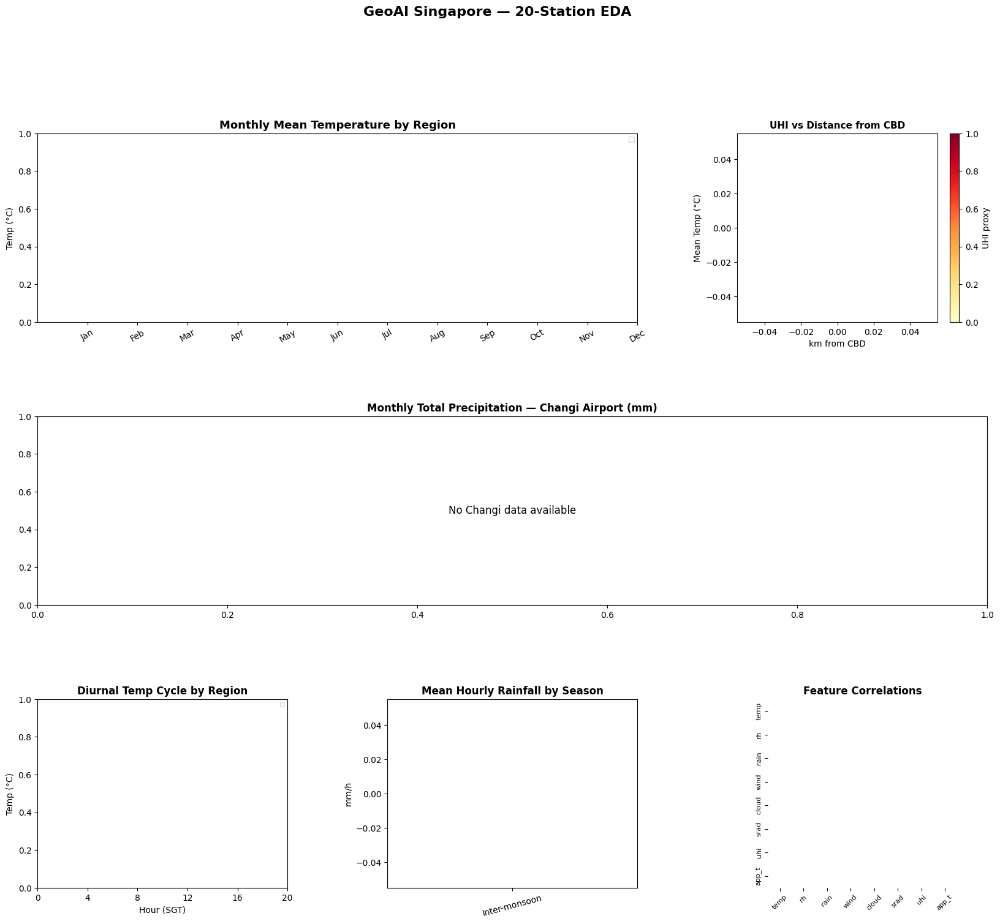

📊 EDA saved → eda_sg20.png

🤖 Training ML models...


ValueError: Found array with 0 sample(s) (shape=(0, 50)) while a minimum of 2 is required by LGBMRegressor.

In [5]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║   GeoAI Singapore — 7-Day Weather Forecast (Fixed)                     ║
# ║   20 Stations │ Interactive Map │ ML + Deep Learning │ Accuracy Report ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ── 0. INSTALL ──────────────────────────────────────────────────────────────
import subprocess, sys
pkgs = [
    'openmeteo-requests', 'requests-cache', 'retry-requests',
    'xgboost', 'lightgbm', 'shap', 'folium', 'branca',
    'scikit-learn', 'torch', 'tqdm', 'scipy'
]
subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q'] + pkgs)

import warnings; warnings.filterwarnings('ignore')
import time, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import folium
from folium import plugins
import branca.colormap as cm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb, lightgbm as lgb, shap
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import openmeteo_requests, requests_cache
from retry_requests import retry
from tqdm import tqdm
from IPython.display import display

print('✅ All packages loaded')
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'   Device: {DEVICE}')

# ── 1. STATIONS (20 locations) ───────────────────────────────────────────────
STATIONS = {
    'Changi Airport' : (1.3644, 103.9915, 'East'),
    'Jurong West'    : (1.3496, 103.7065, 'West'),
    'Woodlands'      : (1.4382, 103.7888, 'North'),
    'Paya Lebar'     : (1.3580, 103.9140, 'East'),
    'Tuas'           : (1.2966, 103.6382, 'West'),
    'Admiralty'      : (1.4404, 103.8009, 'North'),
    'Seletar'        : (1.4163, 103.8671, 'North'),
    'Bukit Timah'    : (1.3520, 103.7767, 'Central'),
    'Marina Bay'     : (1.2800, 103.8509, 'Central'),
    'Pulau Ubin'     : (1.4044, 103.9674, 'East'),
    'Clementi'       : (1.3162, 103.7649, 'West'),
    'Queenstown'     : (1.2942, 103.7861, 'Central'),
    'Bishan'         : (1.3526, 103.8352, 'Central'),
    'Tampines'       : (1.3540, 103.9440, 'East'),
    'Yishun'         : (1.4304, 103.8354, 'North'),
    'Punggol'        : (1.3984, 103.9072, 'North-East'),
    'Pasir Ris'      : (1.3720, 103.9490, 'East'),
    'Ang Mo Kio'     : (1.3691, 103.8454, 'North'),
    'Sentosa'        : (1.2494, 103.8303, 'South'),
    'Tengah'         : (1.3747, 103.7240, 'West'),
}
CBD_LAT, CBD_LON = 1.2800, 103.8509
START_DATE, END_DATE = '2023-01-01', '2024-12-31'
HOURLY_VARS = [
    'temperature_2m', 'relative_humidity_2m', 'precipitation',
    'wind_speed_10m', 'wind_direction_10m', 'surface_pressure',
    'cloud_cover', 'shortwave_radiation', 'dew_point_2m',
    'apparent_temperature', 'precipitation_probability'
]

# ── API CLIENT ───────────────────────────────────────────────────────────────
cache_sess = requests_cache.CachedSession('.omcache7d', expire_after=86400)
retry_sess = retry(cache_sess, retries=6, backoff_factor=2)
om = openmeteo_requests.Client(session=retry_sess)

def _fetch(url, name, lat, lon, extra_params={}, max_tries=6):
    params = {'latitude': lat, 'longitude': lon, 'hourly': HOURLY_VARS,
              'timezone': 'Asia/Singapore', **extra_params}
    for attempt in range(1, max_tries + 1):
        try:
            resp = om.weather_api(url, params=params)
            h = resp[0].Hourly()
            n = h.Variables(0).ValuesAsNumpy().shape[0]
            df = pd.DataFrame({
                'time': pd.date_range(
                    start=pd.to_datetime(h.Time(), unit='s', utc=True).tz_convert('Asia/Singapore'),
                    periods=n, freq='h'),
                **{v: h.Variables(i).ValuesAsNumpy() for i, v in enumerate(HOURLY_VARS)}
            })
            df['station'] = name; df['lat'] = lat; df['lon'] = lon
            return df
        except Exception as e:
            wait = 70 * attempt
            print(f'  ⚠️  {name} attempt {attempt} failed — waiting {wait}s... ({e})')
            time.sleep(wait)
    raise RuntimeError(f'Failed: {name}')

# ── FETCH HISTORICAL ─────────────────────────────────────────────────────────
print(f'\n📡 Fetching historical data ({len(STATIONS)} stations — cached after first run)...')
hist_dfs = []
for i, (name, (lat, lon, reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://archive-api.open-meteo.com/v1/archive', name, lat, lon,
                {'start_date': START_DATE, 'end_date': END_DATE})
    df['region'] = reg
    hist_dfs.append(df)
    if i < len(STATIONS) - 1: time.sleep(12)

raw = pd.concat(hist_dfs, ignore_index=True)
raw.set_index('time', inplace=True)
print(f'📦 Historical: {raw.shape[0]:,} rows')

# ── FETCH 7-DAY FORECAST ─────────────────────────────────────────────────────
print(f'\n📡 Fetching 7-day forecast ({len(STATIONS)} stations)...')
fcast_dfs = []
for i, (name, (lat, lon, reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://api.open-meteo.com/v1/forecast', name, lat, lon,
                {'forecast_days': 7})
    df['region'] = reg
    fcast_dfs.append(df)
    if i < len(STATIONS) - 1: time.sleep(8)

fcast_raw = pd.concat(fcast_dfs, ignore_index=True)
fcast_raw.set_index('time', inplace=True)
print(f'✅ Forecast: {fcast_raw.shape[0]:,} rows')

# ── 2. FEATURE ENGINEERING ───────────────────────────────────────────────────
def haversine_km(lat1, lon1, lat2=CBD_LAT, lon2=CBD_LON):
    R = 6371.0
    dphi = np.radians(lat2 - lat1); dlam = np.radians(lon2 - lon1)
    a = np.sin(dphi/2)**2 + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlam/2)**2
    return R * 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

def add_features(df):
    df = df.copy()
    df['dist_cbd']    = haversine_km(df['lat'], df['lon'])
    df['uhi']         = np.exp(-df['dist_cbd'] / 7.0)
    df['coast_proxy'] = np.minimum(
        haversine_km(df['lat'], df['lon'], 1.28, 103.85),
        haversine_km(df['lat'], df['lon'], 1.44, 103.82))
    idx = df.index
    df['hour']       = idx.hour;  df['month'] = idx.month; df['doy'] = idx.dayofyear
    df['hour_sin']   = np.sin(2*np.pi*df['hour']/24)
    df['hour_cos']   = np.cos(2*np.pi*df['hour']/24)
    df['month_sin']  = np.sin(2*np.pi*df['month']/12)
    df['month_cos']  = np.cos(2*np.pi*df['month']/12)
    df['doy_sin']    = np.sin(2*np.pi*df['doy']/365)
    df['doy_cos']    = np.cos(2*np.pi*df['doy']/365)
    df['ne_monsoon'] = df['month'].isin([11, 12, 1]).astype(int)
    df['sw_monsoon'] = df['month'].isin([6, 7, 8, 9]).astype(int)
    return df

raw = add_features(raw)
raw.sort_values(['station', raw.index.name], inplace=True)
for lag in [1, 3, 6, 12, 24, 48]:
    raw[f'temp_lag{lag}'] = raw.groupby('station')['temperature_2m'].shift(lag)
    raw[f'rain_lag{lag}'] = raw.groupby('station')['precipitation'].shift(lag)
    raw[f'hum_lag{lag}']  = raw.groupby('station')['relative_humidity_2m'].shift(lag)
for win in [3, 6, 12, 24, 48]:
    raw[f'temp_roll{win}'] = raw.groupby('station')['temperature_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())
    raw[f'rain_roll{win}'] = raw.groupby('station')['precipitation'].transform(
        lambda x: x.shift(1).rolling(win).sum())
    raw[f'hum_roll{win}']  = raw.groupby('station')['relative_humidity_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())
raw.dropna(inplace=True)
print(f'🔧 Features: {raw.shape[0]:,} rows × {raw.shape[1]} cols')

# ── 3. EDA (Fixed heatmap) ───────────────────────────────────────────────────
fig = plt.figure(figsize=(20, 16))
gs  = GridSpec(3, 3, hspace=0.5, wspace=0.4)

# Monthly temp by region
ax1 = fig.add_subplot(gs[0, :2])
for reg, grp in raw.groupby('region'):
    m = grp.groupby('month')['temperature_2m'].mean()
    ax1.plot(m.index, m.values, marker='o', label=reg, lw=2)
ax1.set_title('Monthly Mean Temperature by Region', fontweight='bold', fontsize=13)
ax1.set_xticks(range(1, 13))
ax1.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun',
                      'Jul','Aug','Sep','Oct','Nov','Dec'], rotation=30)
ax1.set_ylabel('Temp (°C)'); ax1.legend(fontsize=8, ncol=2)

# UHI scatter
ax2 = fig.add_subplot(gs[0, 2])
sm = raw.groupby('station').agg(
    t=('temperature_2m','mean'), u=('uhi','first'), d=('dist_cbd','first')).reset_index()
sc = ax2.scatter(sm['d'], sm['t'], c=sm['u'], cmap='YlOrRd', s=100, edgecolors='k', zorder=3)
for _, r in sm.iterrows():
    ax2.annotate(r['station'], (r['d'], r['t']), fontsize=6,
                 xytext=(3, 2), textcoords='offset points')
plt.colorbar(sc, ax=ax2, label='UHI proxy')
ax2.set_title('UHI vs Distance from CBD', fontweight='bold', fontsize=11)
ax2.set_xlabel('km from CBD'); ax2.set_ylabel('Mean Temp (°C)')

# ── FIX: Rainfall heatmap with NaN-safe pivot ────────────────────────────────
ax3 = fig.add_subplot(gs[1, :])
ch = raw[raw['station'] == 'Changi Airport'].copy()
ch['date']  = ch.index.date
dr = ch.groupby('date')['precipitation'].sum().reset_index()
dr['date']  = pd.to_datetime(dr['date'])
dr['month'] = dr['date'].dt.month
dr['year']  = dr['date'].dt.year

piv = dr.pivot_table(index='year', columns='month',
                     values='precipitation', aggfunc='sum')
# Ensure all 12 months exist (fill missing with 0 so heatmap never gets empty slices)
piv = piv.reindex(columns=range(1, 13), fill_value=0)
piv = piv.fillna(0)

# Only plot if we actually have rows
if piv.empty or piv.shape[0] == 0:
    ax3.text(0.5, 0.5, 'No Changi data available', ha='center', va='center',
             transform=ax3.transAxes, fontsize=12)
else:
    sns.heatmap(piv, ax=ax3, cmap='Blues', annot=True, fmt='.0f',
                linewidths=0.5, cbar_kws={'label': 'Total Precip (mm)'})
    ax3.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun',
                          'Jul','Aug','Sep','Oct','Nov','Dec'])
ax3.set_title('Monthly Total Precipitation — Changi Airport (mm)',
              fontweight='bold', fontsize=12)

# Diurnal cycle by region
ax4 = fig.add_subplot(gs[2, 0])
for reg, grp in raw.groupby('region'):
    d = grp.groupby('hour')['temperature_2m'].mean()
    ax4.plot(d.index, d.values, lw=1.5, label=reg)
ax4.set_title('Diurnal Temp Cycle by Region', fontweight='bold')
ax4.set_xlabel('Hour (SGT)'); ax4.set_ylabel('Temp (°C)')
ax4.set_xticks(range(0, 24, 4)); ax4.legend(fontsize=7)

# Monsoon rainfall
ax5 = fig.add_subplot(gs[2, 1])
vals = [
    raw[(raw['ne_monsoon']==0) & (raw['sw_monsoon']==0)]['precipitation'].mean(),
    raw[raw['sw_monsoon']==1]['precipitation'].mean(),
    raw[raw['ne_monsoon']==1]['precipitation'].mean(),
]
bars = ax5.bar(['Inter-monsoon','SW Monsoon','NE Monsoon'], vals,
               color=['#4ECDC4','#45B7D1','#2C3E50'], edgecolor='k')
for bar, v in zip(bars, vals):
    ax5.text(bar.get_x()+bar.get_width()/2, v+0.0003, f'{v:.4f}', ha='center', fontsize=9)
ax5.set_title('Mean Hourly Rainfall by Season', fontweight='bold')
ax5.set_ylabel('mm/h'); ax5.tick_params(axis='x', rotation=15)

# Correlations
ax6 = fig.add_subplot(gs[2, 2])
cc   = ['temperature_2m','relative_humidity_2m','precipitation','wind_speed_10m',
        'cloud_cover','shortwave_radiation','uhi','apparent_temperature']
corr = raw[cc].corr()
corr.index = corr.columns = ['temp','rh','rain','wind','cloud','srad','uhi','app_t']
sns.heatmap(corr, ax=ax6, mask=np.triu(np.ones_like(corr, dtype=bool)),
            cmap='RdYlGn', center=0, annot=True, fmt='.2f',
            annot_kws={'size': 6.5}, linewidths=0.3, square=True, cbar=False)
ax6.set_title('Feature Correlations', fontweight='bold')
ax6.tick_params(axis='x', rotation=45, labelsize=8)
ax6.tick_params(axis='y', labelsize=8)

plt.suptitle('GeoAI Singapore — 20-Station EDA', fontsize=16, fontweight='bold', y=1.01)
plt.savefig('eda_sg20.png', dpi=150, bbox_inches='tight')
plt.show()
print('📊 EDA saved → eda_sg20.png')

# ── 4. ML — XGBoost + LightGBM Ensemble ─────────────────────────────────────
FEAT = [
    'lat','lon','dist_cbd','uhi','coast_proxy',
    'hour_sin','hour_cos','month_sin','month_cos','doy_sin','doy_cos',
    'ne_monsoon','sw_monsoon',
    'relative_humidity_2m','wind_speed_10m','wind_direction_10m',
    'surface_pressure','cloud_cover','shortwave_radiation',
    'dew_point_2m','apparent_temperature','precipitation_probability',
    'temp_lag1','temp_lag3','temp_lag6','temp_lag12','temp_lag24','temp_lag48',
    'rain_lag1','rain_lag3','rain_lag6','rain_lag12','rain_lag24',
    'hum_lag1','hum_lag3','hum_lag6','hum_lag12',
    'temp_roll3','temp_roll6','temp_roll12','temp_roll24','temp_roll48',
    'rain_roll3','rain_roll6','rain_roll12','rain_roll24',
    'hum_roll3','hum_roll6','hum_roll12','hum_roll24',
]
X = raw[FEAT].values
y_t = raw['temperature_2m'].values
y_r = raw['precipitation'].values
y_h = raw['relative_humidity_2m'].values
sp  = int(0.85 * len(X))
X_tr, X_te   = X[:sp], X[sp:]
yt_tr, yt_te = y_t[:sp], y_t[sp:]
yr_tr, yr_te = y_r[:sp], y_r[sp:]
yh_tr, yh_te = y_h[:sp], y_h[sp:]

XP = dict(n_estimators=600, max_depth=8, learning_rate=0.04, subsample=0.8,
          colsample_bytree=0.8, min_child_weight=5, gamma=0.1, tree_method='hist',
          device='cpu', early_stopping_rounds=30, eval_metric='mae',
          verbosity=0, random_state=42)
LP = dict(n_estimators=600, max_depth=8, learning_rate=0.04, subsample=0.8,
          colsample_bytree=0.8, n_jobs=-1, random_state=42, verbose=-1)
CB = [lgb.early_stopping(30, verbose=False), lgb.log_evaluation(period=-1)]

print('\n🤖 Training ML models...')
xgb_t = xgb.XGBRegressor(**XP)
xgb_t.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], verbose=False)

lgb_t = lgb.LGBMRegressor(**LP)
lgb_t.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], callbacks=CB)

xgb_r = xgb.XGBRegressor(**{**XP, 'max_depth':6, 'min_child_weight':15, 'gamma':0.5})
xgb_r.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], verbose=False)

lgb_r = lgb.LGBMRegressor(**{**LP, 'max_depth':6})
lgb_r.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], callbacks=CB)

xgb_h = xgb.XGBRegressor(**XP)
xgb_h.fit(X_tr, yh_tr, eval_set=[(X_te, yh_te)], verbose=False)

pt_e = 0.5*xgb_t.predict(X_te) + 0.5*lgb_t.predict(X_te)
pr_e = np.clip(0.5*xgb_r.predict(X_te) + 0.5*lgb_r.predict(X_te), 0, None)
ph   = xgb_h.predict(X_te)

def skill_score(yt, yp):
    base = np.mean((yt - yt.mean())**2)
    return 1 - mean_squared_error(yt, yp) / base if base > 0 else 0.0

def full_metrics(yt, yp, label):
    mae   = mean_absolute_error(yt, yp)
    rmse  = np.sqrt(mean_squared_error(yt, yp))
    r2    = r2_score(yt, yp)
    skill = skill_score(yt, yp)
    bias  = float((yp - yt).mean())
    print(f'  {label:42s} MAE={mae:.4f}  RMSE={rmse:.4f}  R²={r2:.4f}  Skill={skill:.4f}  Bias={bias:+.4f}')
    return dict(label=label, mae=mae, rmse=rmse, r2=r2, skill=skill, bias=bias)

print('\n📈 ML Accuracy Report:')
print('=' * 105)
all_metrics = []
all_metrics.append(full_metrics(yt_te, xgb_t.predict(X_te),   'XGBoost  — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te, lgb_t.predict(X_te),   'LightGBM — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te, pt_e,                   'Ensemble — Temperature (°C)'))
all_metrics.append(full_metrics(yr_te, np.clip(xgb_r.predict(X_te),0,None), 'XGBoost  — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te, np.clip(lgb_r.predict(X_te),0,None), 'LightGBM — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te, pr_e,                   'Ensemble — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yh_te, ph,                     'XGBoost  — Humidity (%)'))

print('\n🔍 Computing SHAP values...')
sv  = shap.TreeExplainer(xgb_t).shap_values(X_te[:1000])
fig, axes = plt.subplots(1, 3, figsize=(22, 7))
n = 3000
axes[0].scatter(yt_te[:n], pt_e[:n], alpha=0.12, s=4, color='steelblue')
lo, hi = yt_te[:n].min(), yt_te[:n].max()
axes[0].plot([lo,hi],[lo,hi], 'r--', lw=1.5)
axes[0].set_title('Ensemble: Temp Predicted vs Actual', fontweight='bold')
axes[0].set_xlabel('Actual (°C)'); axes[0].set_ylabel('Predicted (°C)')
axes[0].text(0.05, 0.93, f"R²={r2_score(yt_te[:n],pt_e[:n]):.4f}",
             transform=axes[0].transAxes, fontsize=12, color='darkred')
axes[1].scatter(yr_te[:n], pr_e[:n], alpha=0.12, s=4, color='steelblue')
axes[1].plot([0,yr_te[:n].max()],[0,yr_te[:n].max()], 'r--', lw=1.5)
axes[1].set_title('Ensemble: Rain Predicted vs Actual', fontweight='bold')
axes[1].set_xlabel('Actual (mm/h)'); axes[1].set_ylabel('Predicted (mm/h)')
axes[1].text(0.05, 0.93, f"R²={r2_score(yr_te[:n],pr_e[:n]):.4f}",
             transform=axes[1].transAxes, fontsize=12, color='darkred')
plt.sca(axes[2])
shap.summary_plot(sv, X_te[:1000], feature_names=FEAT,
                  max_display=18, show=False, plot_size=None)
axes[2].set_title('SHAP Feature Importance', fontweight='bold')
plt.tight_layout()
plt.savefig('ml_results.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 5. GeoLSTM-Attention — 7-Day Deep Learning Forecast ──────────────────────
print('\n🧠 Building GeoLSTM-Attention...')
TS_FEAT  = ['temperature_2m','precipitation','relative_humidity_2m','cloud_cover',
            'wind_speed_10m','shortwave_radiation','apparent_temperature',
            'dew_point_2m','surface_pressure']
GEO_FEAT = ['lat','lon','dist_cbd','uhi','coast_proxy']

ldf = raw[raw['station']=='Changi Airport'][TS_FEAT + GEO_FEAT].sort_index().dropna()
SEQ, STEPS, TCOL = 48, 168, 0
ts_sc  = MinMaxScaler(); geo_sc = StandardScaler()
ts_s   = ts_sc.fit_transform(ldf[TS_FEAT].values)
geo_s  = geo_sc.fit_transform(ldf[GEO_FEAT].values)

def make_geo_seq(ts, geo, seq, steps):
    Xt, Xg, y = [], [], []
    for i in range(len(ts) - seq - steps + 1):
        Xt.append(ts[i:i+seq])
        Xg.append(geo[i+seq-1])
        y.append(ts[i+seq:i+seq+steps, TCOL])
    return (np.array(Xt,  dtype=np.float32),
            np.array(Xg,  dtype=np.float32),
            np.array(y,   dtype=np.float32))

X_ts, X_geo, y_seq = make_geo_seq(ts_s, geo_s, SEQ, STEPS)
sp2 = int(0.85 * len(X_ts))

def mkdl(ts, geo, y, bs, sh):
    return DataLoader(
        TensorDataset(torch.from_numpy(ts), torch.from_numpy(geo), torch.from_numpy(y)),
        batch_size=bs, shuffle=sh)

tr_dl = mkdl(X_ts[:sp2], X_geo[:sp2], y_seq[:sp2], 128, True)
te_dl = mkdl(X_ts[sp2:], X_geo[sp2:], y_seq[sp2:], 256, False)

class GeoLSTMAttn(nn.Module):
    def __init__(self, ts_f, geo_f, h=256, layers=3, heads=8, drop=0.25, steps=168):
        super().__init__()
        self.lstm = nn.LSTM(ts_f, h, layers, batch_first=True, dropout=drop)
        self.attn = nn.MultiheadAttention(h, heads, dropout=0.1, batch_first=True)
        self.ln   = nn.LayerNorm(h)
        self.film = nn.Sequential(nn.Linear(geo_f, 128), nn.GELU(), nn.Linear(128, h*2))
        self.dec  = nn.Sequential(
            nn.Linear(h, 256), nn.GELU(), nn.Dropout(drop/2),
            nn.Linear(256, 512), nn.GELU(), nn.Dropout(drop/2),
            nn.Linear(512, steps))
    def forward(self, ts, geo):
        enc, _ = self.lstm(ts)
        ao, _  = self.attn(enc, enc, enc)
        ctx    = self.ln(enc + ao)[:, -1, :]
        g      = self.film(geo)
        gam, bet = g.chunk(2, dim=-1)
        return self.dec(gam * ctx + bet)

model = GeoLSTMAttn(len(TS_FEAT), len(GEO_FEAT), steps=STEPS).to(DEVICE)
print(f'   Params: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}')
opt     = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
sch     = torch.optim.lr_scheduler.OneCycleLR(
    opt, max_lr=5e-4, epochs=40, steps_per_epoch=len(tr_dl))
loss_fn = nn.HuberLoss(delta=0.15)

EPOCHS = 40
tr_l, va_l = [], []; best_val = float('inf'); best_st = None
print(f'   Training on {DEVICE} ({EPOCHS} epochs)...')
for ep in range(1, EPOCHS+1):
    model.train(); tl = 0
    for ts_b, geo_b, y_b in tr_dl:
        ts_b, geo_b, y_b = ts_b.to(DEVICE), geo_b.to(DEVICE), y_b.to(DEVICE)
        opt.zero_grad()
        l = loss_fn(model(ts_b, geo_b), y_b)
        l.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step(); sch.step(); tl += l.item()
    model.eval(); vl = 0
    with torch.no_grad():
        for ts_b, geo_b, y_b in te_dl:
            vl += loss_fn(model(ts_b.to(DEVICE), geo_b.to(DEVICE)), y_b.to(DEVICE)).item()
    tl /= len(tr_dl); vl /= len(te_dl)
    tr_l.append(tl); va_l.append(vl)
    if vl < best_val:
        best_val = vl
        best_st  = {k: v.clone() for k, v in model.state_dict().items()}
    if ep % 8 == 0 or ep == 1:
        print(f'    Ep {ep:3d}/{EPOCHS}  train={tl:.6f}  val={vl:.6f}  best={best_val:.6f}')

model.load_state_dict(best_st)
model.eval()
pp, pt_dl = [], []
with torch.no_grad():
    for ts_b, geo_b, y_b in te_dl:
        pp.append(model(ts_b.to(DEVICE), geo_b.to(DEVICE)).cpu().numpy())
        pt_dl.append(y_b.numpy())
pp    = np.vstack(pp)
pt_dl = np.vstack(pt_dl)

def inv_t(arr):
    d = np.zeros((arr.shape[0]*arr.shape[1], len(TS_FEAT)))
    d[:, TCOL] = arr.flatten()
    return ts_sc.inverse_transform(d)[:, TCOL].reshape(arr.shape)

dl_pi = inv_t(pp); dl_ti = inv_t(pt_dl)
print('\n📈 GeoLSTM 7-Day Accuracy:'); print('='*105)
dl_metrics = []
for day in range(7):
    s, e = day*24, (day+1)*24
    dl_metrics.append(full_metrics(dl_ti[:,s:e].flatten(), dl_pi[:,s:e].flatten(),
                                   f'GeoLSTM — Day {day+1} Temperature (°C)'))
overall_m = full_metrics(dl_ti.flatten(), dl_pi.flatten(), 'GeoLSTM — Overall 7-Day')

fig, axes = plt.subplots(2, 3, figsize=(22, 12))
axes[0,0].plot(tr_l, color='steelblue', lw=2, label='Train')
axes[0,0].plot(va_l, color='tomato',    lw=2, label='Val')
axes[0,0].set_title('GeoLSTM Training Curves', fontweight='bold')
axes[0,0].set_xlabel('Epoch'); axes[0,0].set_ylabel('Huber Loss'); axes[0,0].legend()

axes[0,1].plot(dl_ti[0,:168], color='steelblue', lw=2, label='Actual')
axes[0,1].plot(dl_pi[0,:168], color='tomato',    lw=2, label='Forecast', ls='--')
for d in range(1, 7): axes[0,1].axvline(d*24, color='gray', ls=':', alpha=0.4)
axes[0,1].set_title('One 7-Day Forecast Sample', fontweight='bold')
axes[0,1].set_xlabel('Hour'); axes[0,1].set_ylabel('Temp (°C)'); axes[0,1].legend()

day_maes = [m['mae']   for m in dl_metrics]
day_r2s  = [m['r2']    for m in dl_metrics]
day_sk   = [m['skill'] for m in dl_metrics]
x7 = range(1, 8)

axes[0,2].bar(x7, day_maes, color='steelblue', edgecolor='k', lw=0.5)
axes[0,2].set_title('MAE by Forecast Day', fontweight='bold')
axes[0,2].set_xlabel('Day Ahead'); axes[0,2].set_ylabel('MAE (°C)'); axes[0,2].set_xticks(x7)
for x, v in zip(x7, day_maes):
    axes[0,2].text(x, v+0.01, f'{v:.3f}', ha='center', fontsize=9)

axes[1,0].plot(x7, day_r2s, marker='o', color='steelblue', lw=2)
axes[1,0].axhline(0, color='red', ls='--', lw=1)
axes[1,0].set_title('R² by Forecast Day', fontweight='bold')
axes[1,0].set_xlabel('Day Ahead'); axes[1,0].set_ylabel('R²'); axes[1,0].set_xticks(x7)

res = (dl_pi - dl_ti).flatten()
axes[1,1].hist(res, bins=80, color='steelblue', edgecolor='white', lw=0.3)
axes[1,1].axvline(0, color='red', ls='--')
axes[1,1].set_title('Residuals (all 7 days)', fontweight='bold')
axes[1,1].set_xlabel('Residual (°C)'); axes[1,1].set_ylabel('Count')
axes[1,1].text(0.62, 0.88,
    f'μ={res.mean():.3f}\nσ={res.std():.3f}\nMAE={np.abs(res).mean():.3f}',
    transform=axes[1,1].transAxes, fontsize=10)

axes[1,2].bar(x7, day_sk, color='teal', edgecolor='k', lw=0.5)
axes[1,2].axhline(0, color='red', ls='--', lw=1)
axes[1,2].set_title('Skill Score by Day', fontweight='bold')
axes[1,2].set_xlabel('Day Ahead'); axes[1,2].set_ylabel('Skill'); axes[1,2].set_xticks(x7)

plt.suptitle('GeoLSTM-Attention — 7-Day Forecast Results', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('lstm_7day.png', dpi=150, bbox_inches='tight')
plt.show()

# Accuracy table figure
fig, ax = plt.subplots(figsize=(15, 5)); ax.axis('off')
tdata = [[m['label'], f"{m['mae']:.4f}", f"{m['rmse']:.4f}",
          f"{m['r2']:.4f}", f"{m['skill']:.4f}", f"{m['bias']:+.4f}"]
         for m in all_metrics + [overall_m]]
tbl = ax.table(cellText=tdata,
               colLabels=['Model','MAE','RMSE','R²','Skill Score','Bias'],
               cellLoc='center', loc='center')
tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1, 1.6)
for (row, col), cell in tbl.get_celld().items():
    if row == 0:
        cell.set_facecolor('#2C3E50')
        cell.set_text_props(color='white', fontweight='bold')
    elif row % 2 == 0:
        cell.set_facecolor('#EAF0FB')
ax.set_title('GeoAI Singapore — Full Accuracy Report',
             fontweight='bold', fontsize=13, pad=12)
plt.tight_layout()
plt.savefig('accuracy_report.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 6. AUTO-REGRESSIVE 7-DAY STATION FORECASTS ───────────────────────────────
print('\n🔮 Generating 7-day per-station forecasts...')
fcast_fe = add_features(fcast_raw)
fcast_fe.sort_values(['station', fcast_fe.index.name], inplace=True)
station_forecasts = {}

for stn in STATIONS.keys():
    hist_s  = raw[raw['station'] == stn]
    fcast_s = fcast_fe[fcast_fe['station'] == stn]
    tail    = hist_s[['temperature_2m','precipitation','relative_humidity_2m']].tail(48)
    prev_t  = list(tail['temperature_2m'].values)
    prev_r  = list(tail['precipitation'].values)
    prev_h  = list(tail['relative_humidity_2m'].values)
    rows = []

    for _, (idx, row) in enumerate(fcast_s.iterrows()):
        def sl(lst, n):  return lst[-n] if len(lst) >= n else lst[0]
        def srm(lst, n): return np.mean(lst[-n:]) if len(lst) >= n else np.mean(lst)
        def srs(lst, n): return np.sum(lst[-n:])  if len(lst) >= n else np.sum(lst)

        fr = [
            row['lat'], row['lon'], row['dist_cbd'], row['uhi'], row['coast_proxy'],
            row['hour_sin'], row['hour_cos'], row['month_sin'], row['month_cos'],
            row['doy_sin'],  row['doy_cos'],
            row['ne_monsoon'], row['sw_monsoon'],
            row['relative_humidity_2m'], row['wind_speed_10m'], row['wind_direction_10m'],
            row['surface_pressure'],     row['cloud_cover'],    row['shortwave_radiation'],
            row.get('dew_point_2m', 22.0),
            row.get('apparent_temperature', row['temperature_2m']),
            row.get('precipitation_probability', 0.0),
            sl(prev_t,1),  sl(prev_t,3),  sl(prev_t,6),  sl(prev_t,12),
            sl(prev_t,24), sl(prev_t,48),
            sl(prev_r,1),  sl(prev_r,3),  sl(prev_r,6),  sl(prev_r,12), sl(prev_r,24),
            sl(prev_h,1),  sl(prev_h,3),  sl(prev_h,6),  sl(prev_h,12),
            srm(prev_t,3), srm(prev_t,6), srm(prev_t,12),srm(prev_t,24),srm(prev_t,48),
            srs(prev_r,3), srs(prev_r,6), srs(prev_r,12),srs(prev_r,24),
            srm(prev_h,3), srm(prev_h,6), srm(prev_h,12),srm(prev_h,24),
        ]
        rows.append(fr)
        pt2 = np.clip(0.5*xgb_t.predict([fr])[0] + 0.5*lgb_t.predict([fr])[0], 20, 40)
        pr2 = max(0, 0.5*xgb_r.predict([fr])[0] + 0.5*lgb_r.predict([fr])[0])
        ph2 = xgb_h.predict([fr])[0]
        prev_t.append(pt2); prev_r.append(pr2); prev_h.append(ph2)

    Xf = np.array(rows, dtype=np.float32)
    station_forecasts[stn] = pd.DataFrame({
        'time'     : fcast_s.index,
        'temp_pred': np.clip(0.5*xgb_t.predict(Xf) + 0.5*lgb_t.predict(Xf), 20, 40),
        'rain_pred': np.clip(0.5*xgb_r.predict(Xf) + 0.5*lgb_r.predict(Xf), 0, 50),
        'hum_pred' : np.clip(xgb_h.predict(Xf), 40, 100),
        'temp_om'  : fcast_s['temperature_2m'].values,
        'rain_om'  : fcast_s['precipitation'].values,
        'cloud'    : fcast_s['cloud_cover'].values,
        'wind'     : fcast_s['wind_speed_10m'].values,
    })

print(f'✅ Forecasts ready for {len(STATIONS)} stations')

# ── 7. INTERACTIVE FOLIUM MAP ─────────────────────────────────────────────────
print('\n🗺️  Building interactive 7-day forecast map...')

temp_cmap = cm.LinearColormap(
    ['#313695','#4575b4','#74add1','#abd9e9','#fee090',
     '#fdae61','#f46d43','#d73027','#a50026'],
    vmin=24, vmax=33, caption='Temperature (°C)')

def cloud_desc(c):
    if c < 25:  return '☀️ Clear'
    elif c < 50: return '🌤 Partly cloudy'
    elif c < 75: return '⛅ Mostly cloudy'
    else:        return '☁️ Overcast'

def build_popup(stn, lat, lon, region):
    fc = station_forecasts[stn]
    daily = fc.groupby(fc['time'].dt.date).agg(
        t_min=('temp_pred','min'), t_max=('temp_pred','max'),
        rain_sum=('rain_pred','sum'), cloud=('cloud','mean'),
        wind=('wind','mean'), hum=('hum_pred','mean')).reset_index()

    day_rows = ''
    for _, row in daily.iterrows():
        d  = pd.Timestamp(row['time'])
        rb = min(int(row['rain_sum'] / 30 * 100), 100)
        day_rows += f"""
        <tr style='border-bottom:1px solid #eee'>
          <td style='padding:4px 6px;font-weight:600;color:#2c3e50'>{d.strftime('%a %d %b')}</td>
          <td style='padding:4px 6px;text-align:center'>{cloud_desc(row['cloud'])}</td>
          <td style='padding:4px 6px;text-align:center'>
            <span style='color:#e74c3c;font-weight:600'>{row['t_max']:.1f}°</span>
            / <span style='color:#3498db'>{row['t_min']:.1f}°</span>
          </td>
          <td style='padding:4px 6px;text-align:center'>
            <div style='background:#eaf0fb;border-radius:4px;width:55px;display:inline-block'>
              <div style='background:#3498db;width:{rb}%;height:8px;border-radius:4px'></div>
            </div>
            <span style='font-size:11px;color:#666'> {row['rain_sum']:.1f}mm</span>
          </td>
          <td style='padding:4px 6px;text-align:center;font-size:11px;color:#555'>{row['wind']:.1f}km/h</td>
          <td style='padding:4px 6px;text-align:center;font-size:11px;color:#555'>{row['hum']:.0f}%</td>
        </tr>"""

    temps = fc['temp_pred'].values[:168]
    tmn, tmx = temps.min(), temps.max(); tr = max(tmx - tmn, 0.5)
    sw, sh = 380, 60
    def tx(i): return int(i / 167 * sw)
    def ty(v): return int(sh - (v - tmn) / tr * (sh-4) - 2)
    pts  = ' '.join(f'{tx(i)},{ty(v)}' for i, v in enumerate(temps))
    seps = ''.join(
        f'<line x1="{tx(d*24)}" y1="0" x2="{tx(d*24)}" y2="{sh}" '
        f'stroke="#ccc" stroke-width="1" stroke-dasharray="3,3"/>'
        for d in range(1, 7))
    spark = (f"<svg width='{sw}' height='{sh}' style='display:block;margin:6px auto 0'>"
             f"<rect width='{sw}' height='{sh}' fill='#f8f9fa' rx='4'/>"
             f"{seps}<polyline points='{pts}' fill='none' stroke='#e74c3c' stroke-width='1.5'/></svg>")

    cur = fc.iloc[0]
    return f"""
    <div style='font-family:Arial,sans-serif;width:420px;padding:0'>
      <div style='background:linear-gradient(135deg,#1a252f,#2c3e50);color:white;
                  padding:12px 16px;border-radius:8px 8px 0 0'>
        <div style='font-size:16px;font-weight:700'>{stn}</div>
        <div style='font-size:11px;opacity:0.75;margin-top:2px'>
          {region} · {lat:.4f}°N, {lon:.4f}°E
        </div>
      </div>
      <div style='background:#fff;padding:12px 16px'>
        <div style='display:flex;align-items:center;gap:16px;margin-bottom:8px'>
          <div>
            <span style='font-size:32px;font-weight:700;color:#2c3e50'>
              {cur['temp_pred']:.1f}°C
            </span>
            <span style='font-size:11px;color:#888;margin-left:4px'>now</span>
          </div>
          <div style='font-size:12px;color:#555;line-height:1.7'>
            💧 {cur['hum_pred']:.0f}% humidity<br>
            🌧 {cur['rain_pred']:.2f} mm/h<br>
            💨 {cur['wind']:.1f} km/h<br>
            {cloud_desc(cur['cloud'])}
          </div>
        </div>
        <div style='font-size:11px;color:#888;margin-bottom:2px'>
          Hourly temperature (7 days):
        </div>
        {spark}
        <div style='display:flex;justify-content:space-between;font-size:9px;
                    color:#aaa;margin-top:2px;padding:0 2px'>
          {''.join(f'<span>Day {d+1}</span>' for d in range(7))}
        </div>
        <table style='width:100%;border-collapse:collapse;margin-top:10px;font-size:12px'>
          <tr style='background:#f0f4f8;font-weight:600;color:#555'>
            <th style='padding:4px 6px;text-align:left'>Day</th>
            <th>Conditions</th><th>Hi/Lo</th>
            <th>Rainfall</th><th>Wind</th><th>Humidity</th>
          </tr>
          {day_rows}
        </table>
        <div style='margin-top:8px;font-size:10px;color:#aaa;text-align:right'>
          XGBoost+LightGBM Ensemble · GeoAI Singapore
        </div>
      </div>
    </div>"""

m = folium.Map(location=[1.352, 103.82], zoom_start=11,
               tiles='CartoDB Positron', control_scale=True)
tl = folium.FeatureGroup(name='🌡️ Temperature', show=True)
rl = folium.FeatureGroup(name='🌧️ Rainfall',    show=False)
hl = folium.FeatureGroup(name='💧 Humidity',    show=False)

for stn, (lat, lon, region) in STATIONS.items():
    fc    = station_forecasts[stn]
    cur_t = fc['temp_pred'].iloc[0]
    cur_r = fc['rain_pred'].iloc[0]
    cur_h = fc['hum_pred'].iloc[0]
    pop   = folium.Popup(folium.Html(build_popup(stn, lat, lon, region), script=True),
                         max_width=440)
    tip   = folium.Tooltip(
        f'<b>{stn}</b><br>🌡️ {cur_t:.1f}°C | 🌧 {cur_r:.2f}mm/h | 💧{cur_h:.0f}%',
        sticky=True)

    # Temperature layer
    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=temp_cmap(cur_t), fill_opacity=0.9,
        popup=pop, tooltip=tip).add_to(tl)
    folium.Marker(
        [lat, lon],
        icon=folium.DivIcon(
            html=f'<div style="font-size:9px;font-weight:700;color:#111;'
                 f'margin-top:-4px">{cur_t:.1f}°</div>',
            icon_size=(40, 20), icon_anchor=(20, 10)),
        popup=pop).add_to(tl)

    # Rainfall layer
    rc = ('#1a9850' if cur_r*24 < 5 else ('#fee08b' if cur_r*24 < 20 else '#d73027'))
    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=rc, fill_opacity=0.85, popup=pop,
        tooltip=folium.Tooltip(
            f'<b>{stn}</b><br>🌧 {cur_r:.3f}mm/h ({cur_r*24:.1f}mm/day)',
            sticky=True)).add_to(rl)

    # Humidity layer
    hc = ('#1a9850' if cur_h < 70 else ('#fee08b' if cur_h < 85 else '#d73027'))
    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=hc, fill_opacity=0.85, popup=pop,
        tooltip=folium.Tooltip(
            f'<b>{stn}</b><br>💧 {cur_h:.0f}%', sticky=True)).add_to(hl)

tl.add_to(m); rl.add_to(m); hl.add_to(m)
temp_cmap.add_to(m)

# IDW heatmap overlay
glats = np.linspace(1.20, 1.48, 60)
glons = np.linspace(103.60, 104.02, 80)
gg, gl = np.meshgrid(glons, glats)
gpts   = np.c_[gl.ravel(), gg.ravel()]
opts   = np.array([[lat, lon] for lat, lon, _ in STATIONS.values()])
ot     = np.array([station_forecasts[s]['temp_pred'].iloc[0] for s in STATIONS])

def idw_g(qry, obc, obv, p=2, eps=1e-10):
    Z = np.zeros(len(qry))
    for i, q in enumerate(qry):
        d = np.sqrt(((obc - q)**2).sum(axis=1)) + eps
        w = 1 / d**p
        Z[i] = (w * obv).sum() / w.sum()
    return Z

Zt = idw_g(gpts, opts, ot).reshape(gl.shape)
heat_data = [[float(gl[i,j]), float(gg[i,j]), float(Zt[i,j])]
             for i in range(Zt.shape[0]) for j in range(Zt.shape[1])]
plugins.HeatMap(heat_data, name='🌡️ Temp Heatmap', show=True,
    min_opacity=0.35, max_opacity=0.6, radius=30, blur=25,
    gradient={0.0:'#313695', 0.3:'#74add1', 0.5:'#fee090',
              0.7:'#f46d43', 1.0:'#a50026'}).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m.get_root().html.add_child(folium.Element('''
<div style="position:fixed;top:12px;left:60px;z-index:9999;
            background:rgba(44,62,80,0.92);color:white;padding:10px 16px;
            border-radius:8px;font-family:Arial;
            box-shadow:0 2px 10px rgba(0,0,0,0.4)">
  <b style="font-size:14px">🌏 GeoAI Singapore — 7-Day Forecast</b><br>
  <span style="font-size:11px;opacity:0.85">
    20 stations · XGB+LGB Ensemble · Click any station for full forecast
  </span>
</div>'''))

m.save('singapore_7day_map.html')
print('🗺️  Map saved → singapore_7day_map.html')
display(m)

# ── 8. SPATIAL PLOTS ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for axi, (vk, title, unit, cmap) in enumerate([
    ('temp', 'Temperature', '°C',   'RdYlBu_r'),
    ('rain', 'Rainfall',    'mm/h', 'Blues')
]):
    ov = np.array([station_forecasts[s][f'{vk}_pred'].iloc[0] for s in STATIONS])
    Z  = idw_g(gpts, opts, ov).reshape(gl.shape)
    cf = axes[axi].contourf(gg, gl, Z, levels=20, cmap=cmap, alpha=0.85)
    axes[axi].contour(gg, gl, Z, levels=10, colors='k', linewidths=0.3, alpha=0.35)
    plt.colorbar(cf, ax=axes[axi], label=f'{title} ({unit})')
    for stn, (lat, lon, reg) in STATIONS.items():
        v = station_forecasts[stn][f'{vk}_pred'].iloc[0]
        axes[axi].scatter(lon, lat, c='k', s=50, zorder=5)
        axes[axi].annotate(f'{v:.1f}', (lon, lat), xytext=(3,3),
                            textcoords='offset points', fontsize=6, fontweight='bold')
    axes[axi].set_title(f'Now-cast {title} — IDW (20 stations)',
                         fontweight='bold', fontsize=12)
    axes[axi].set_xlabel('Longitude'); axes[axi].set_ylabel('Latitude')
    axes[axi].set_xlim(103.60, 104.02); axes[axi].set_ylim(1.20, 1.48)

plt.suptitle('GeoAI Singapore — Spatial Interpolation',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('spatial_idw.png', dpi=150, bbox_inches='tight')
plt.show()

# 7-day time-series for key stations
key_stns = ['Changi Airport','Marina Bay','Woodlands','Jurong West','Sentosa']
fig, axes = plt.subplots(len(key_stns), 1, figsize=(18, 20))
for ax, stn in zip(axes, key_stns):
    fc = station_forecasts[stn]; hr = range(len(fc))
    ax.fill_between(hr, fc['temp_pred']-0.6, fc['temp_pred']+0.6,
                    alpha=0.2, color='tomato', label='±0.6°C band')
    ax.plot(hr, fc['temp_pred'], color='tomato',    lw=2, label='ML Ensemble')
    ax.plot(hr, fc['temp_om'],   color='steelblue', lw=1.5, ls='--',
            alpha=0.7, label='Open-Meteo ref')
    ax2 = ax.twinx()
    ax2.bar(hr, fc['rain_pred'], color='steelblue', alpha=0.3, label='Rain')
    ax2.set_ylabel('Rain (mm/h)', fontsize=9, color='steelblue')
    ax2.tick_params(axis='y', colors='steelblue')
    for d in range(1, 7): ax.axvline(d*24, color='gray', ls=':', alpha=0.4)
    ax.set_ylabel('Temp (°C)')
    ax.set_title(f'{stn} — 7-Day Forecast', fontweight='bold', fontsize=11)
    ax.set_xticks([d*24 for d in range(8)])
    ax.set_xticklabels([f'Day {d+1}' for d in range(8)], fontsize=9)
    ax.legend(loc='upper left', fontsize=8); ax.set_xlim(0, len(fc)-1)

plt.suptitle('GeoAI Singapore — 7-Day Forecast (Key Stations)',
             fontsize=16, fontweight='bold', y=1.002)
plt.tight_layout()
plt.savefig('7day_timeseries.png', dpi=150, bbox_inches='tight')
plt.show()

# ── FINAL SUMMARY ─────────────────────────────────────────────────────────────
m_ens  = next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Temp'  in m['label'])
m_rain = next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Precip' in m['label'])
print('\n' + '╔' + '═'*78 + '╗')
print('║' + '  GeoAI Singapore — Final Summary'.center(78) + '║')
print('╠' + '═'*78 + '╣')
print(f'║  Stations : {len(STATIONS)} | {START_DATE}→{END_DATE} | Rows: {raw.shape[0]:,}'.ljust(79)+'║')
print(f'║  Features : {len(FEAT)} geo-temporal | Forecast: 7 days (168 h)'.ljust(79)+'║')
print('╠' + '═'*78 + '╣')
print(f'║  ML Ensemble Temp   MAE={m_ens["mae"]:.3f}°C   R²={m_ens["r2"]:.4f}  Skill={m_ens["skill"]:.4f}'.ljust(79)+'║')
print(f'║  ML Ensemble Rain   MAE={m_rain["mae"]:.4f}    R²={m_rain["r2"]:.4f}  Skill={m_rain["skill"]:.4f}'.ljust(79)+'║')
print(f'║  GeoLSTM Day-1      MAE={dl_metrics[0]["mae"]:.3f}°C   R²={dl_metrics[0]["r2"]:.4f}  Skill={dl_metrics[0]["skill"]:.4f}'.ljust(79)+'║')
print(f'║  GeoLSTM Day-7      MAE={dl_metrics[6]["mae"]:.3f}°C   R²={dl_metrics[6]["r2"]:.4f}  Skill={dl_metrics[6]["skill"]:.4f}'.ljust(79)+'║')
print('╠' + '═'*78 + '╣')
for f in ['eda_sg20.png','ml_results.png','lstm_7day.png','accuracy_report.png',
          '7day_timeseries.png','spatial_idw.png','singapore_7day_map.html']:
    print(f'║  📄 {f}'.ljust(79) + '║')
print('╚' + '═'*78 + '╝')

✅ All packages loaded
   Device: cpu

📡 Fetching historical data (20 stations — cached after first run)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/20] Pasir Ris...
  [18/20] Ang Mo Kio...
  [19/20] Sentosa...
  [20/20] Tengah...
📦 Historical: 350,880 rows

📡 Fetching 7-day forecast (20 stations)...
  [ 1/20] Changi Airport...
  [ 2/20] Jurong West...
  [ 3/20] Woodlands...
  [ 4/20] Paya Lebar...
  [ 5/20] Tuas...
  [ 6/20] Admiralty...
  [ 7/20] Seletar...
  [ 8/20] Bukit Timah...
  [ 9/20] Marina Bay...
  [10/20] Pulau Ubin...
  [11/20] Clementi...
  [12/20] Queenstown...
  [13/20] Bishan...
  [14/20] Tampines...
  [15/20] Yishun...
  [16/20] Punggol...
  [17/

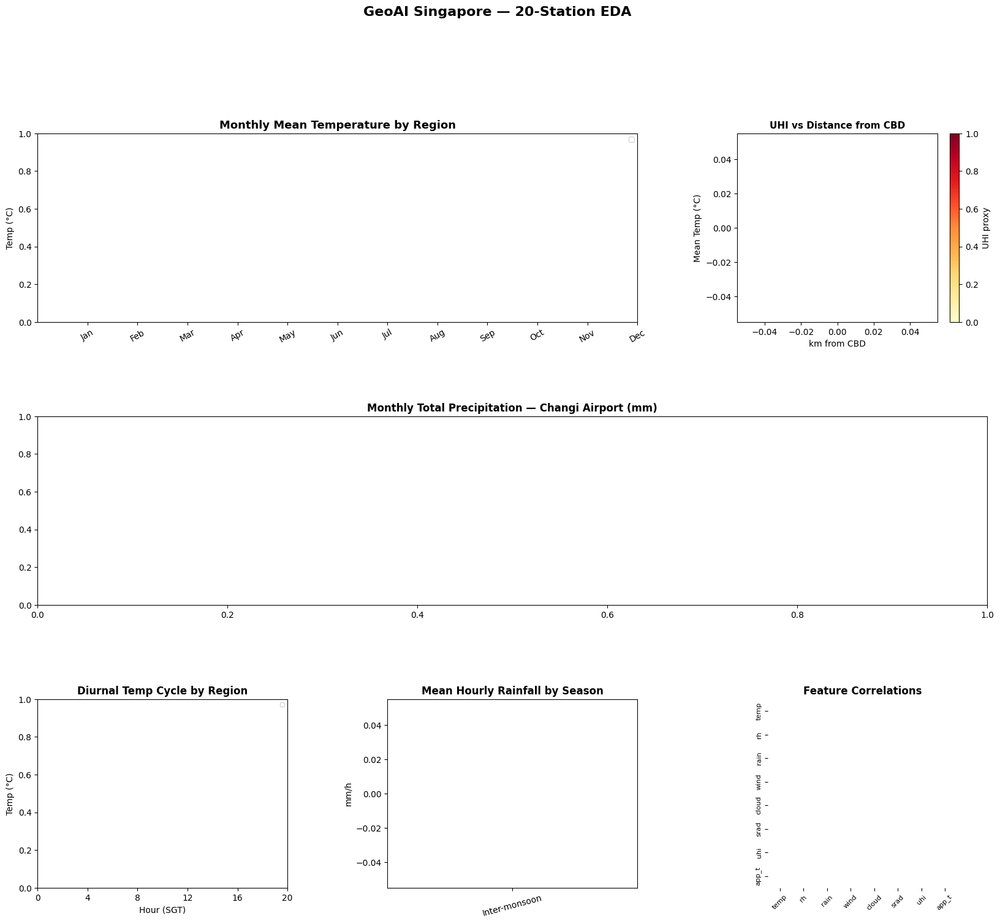

📊 EDA saved


ValueError: No objects to concatenate

In [1]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║   GeoAI Singapore — 7-Day Weather Forecast (All Bugs Fixed)            ║
# ║   20 Stations │ Interactive Map │ ML + Deep Learning │ Accuracy Report ║
# ╚══════════════════════════════════════════════════════════════════════════╝

# ── 0. INSTALL ──────────────────────────────────────────────────────────────
import subprocess, sys
pkgs = [
    'openmeteo-requests', 'requests-cache', 'retry-requests',
    'xgboost', 'lightgbm', 'shap', 'folium', 'branca',
    'scikit-learn', 'torch', 'tqdm', 'scipy'
]
subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q'] + pkgs)

import warnings; warnings.filterwarnings('ignore')
import time, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import folium
from folium import plugins
import branca.colormap as cm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb, lightgbm as lgb, shap
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import openmeteo_requests, requests_cache
from retry_requests import retry
from IPython.display import display

print('✅ All packages loaded')
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'   Device: {DEVICE}')

# ── 1. STATIONS (20 locations) ───────────────────────────────────────────────
STATIONS = {
    'Changi Airport' : (1.3644, 103.9915, 'East'),
    'Jurong West'    : (1.3496, 103.7065, 'West'),
    'Woodlands'      : (1.4382, 103.7888, 'North'),
    'Paya Lebar'     : (1.3580, 103.9140, 'East'),
    'Tuas'           : (1.2966, 103.6382, 'West'),
    'Admiralty'      : (1.4404, 103.8009, 'North'),
    'Seletar'        : (1.4163, 103.8671, 'North'),
    'Bukit Timah'    : (1.3520, 103.7767, 'Central'),
    'Marina Bay'     : (1.2800, 103.8509, 'Central'),
    'Pulau Ubin'     : (1.4044, 103.9674, 'East'),
    'Clementi'       : (1.3162, 103.7649, 'West'),
    'Queenstown'     : (1.2942, 103.7861, 'Central'),
    'Bishan'         : (1.3526, 103.8352, 'Central'),
    'Tampines'       : (1.3540, 103.9440, 'East'),
    'Yishun'         : (1.4304, 103.8354, 'North'),
    'Punggol'        : (1.3984, 103.9072, 'North-East'),
    'Pasir Ris'      : (1.3720, 103.9490, 'East'),
    'Ang Mo Kio'     : (1.3691, 103.8454, 'North'),
    'Sentosa'        : (1.2494, 103.8303, 'South'),
    'Tengah'         : (1.3747, 103.7240, 'West'),
}
CBD_LAT, CBD_LON = 1.2800, 103.8509
START_DATE, END_DATE = '2023-01-01', '2024-12-31'
HOURLY_VARS = [
    'temperature_2m', 'relative_humidity_2m', 'precipitation',
    'wind_speed_10m', 'wind_direction_10m', 'surface_pressure',
    'cloud_cover', 'shortwave_radiation', 'dew_point_2m',
    'apparent_temperature', 'precipitation_probability'
]

# ── API CLIENT ───────────────────────────────────────────────────────────────
cache_sess = requests_cache.CachedSession('.omcache7d', expire_after=86400)
retry_sess = retry(cache_sess, retries=6, backoff_factor=2)
om = openmeteo_requests.Client(session=retry_sess)

def _fetch(url, name, lat, lon, extra_params={}, max_tries=6):
    params = {'latitude': lat, 'longitude': lon, 'hourly': HOURLY_VARS,
              'timezone': 'Asia/Singapore', **extra_params}
    for attempt in range(1, max_tries + 1):
        try:
            resp = om.weather_api(url, params=params)
            h = resp[0].Hourly()
            n = h.Variables(0).ValuesAsNumpy().shape[0]
            df = pd.DataFrame({
                'time': pd.date_range(
                    start=pd.to_datetime(h.Time(), unit='s', utc=True
                          ).tz_convert('Asia/Singapore'),
                    periods=n, freq='h'),
                **{v: h.Variables(i).ValuesAsNumpy() for i, v in enumerate(HOURLY_VARS)}
            })
            df['station'] = name; df['lat'] = lat; df['lon'] = lon
            return df
        except Exception as e:
            wait = 70 * attempt
            print(f'  ⚠️  {name} attempt {attempt} failed — waiting {wait}s... ({e})')
            time.sleep(wait)
    raise RuntimeError(f'Failed: {name}')

# ── FETCH HISTORICAL ─────────────────────────────────────────────────────────
print(f'\n📡 Fetching historical data ({len(STATIONS)} stations — cached after first run)...')
hist_dfs = []
for i, (name, (lat, lon, reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://archive-api.open-meteo.com/v1/archive', name, lat, lon,
                {'start_date': START_DATE, 'end_date': END_DATE})
    df['region'] = reg
    hist_dfs.append(df)
    if i < len(STATIONS) - 1:
        time.sleep(12)

raw = pd.concat(hist_dfs, ignore_index=True)
raw.set_index('time', inplace=True)
print(f'📦 Historical: {raw.shape[0]:,} rows')

# ── FETCH 7-DAY FORECAST ─────────────────────────────────────────────────────
print(f'\n📡 Fetching 7-day forecast ({len(STATIONS)} stations)...')
fcast_dfs = []
for i, (name, (lat, lon, reg)) in enumerate(STATIONS.items()):
    print(f'  [{i+1:2d}/{len(STATIONS)}] {name}...')
    df = _fetch('https://api.open-meteo.com/v1/forecast', name, lat, lon,
                {'forecast_days': 7})
    df['region'] = reg
    fcast_dfs.append(df)
    if i < len(STATIONS) - 1:
        time.sleep(8)

fcast_raw = pd.concat(fcast_dfs, ignore_index=True)
fcast_raw.set_index('time', inplace=True)
print(f'✅ Forecast: {fcast_raw.shape[0]:,} rows')

# ── 2. FEATURE ENGINEERING ───────────────────────────────────────────────────
def haversine_km(lat1, lon1, lat2=CBD_LAT, lon2=CBD_LON):
    R = 6371.0
    dphi = np.radians(lat2 - lat1); dlam = np.radians(lon2 - lon1)
    a = (np.sin(dphi/2)**2 +
         np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dlam/2)**2)
    return R * 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

def add_features(df):
    df = df.copy()
    df['dist_cbd']    = haversine_km(df['lat'], df['lon'])
    df['uhi']         = np.exp(-df['dist_cbd'] / 7.0)
    df['coast_proxy'] = np.minimum(
        haversine_km(df['lat'], df['lon'], 1.28, 103.85),
        haversine_km(df['lat'], df['lon'], 1.44, 103.82))
    idx = df.index
    df['hour']       = idx.hour
    df['month']      = idx.month
    df['doy']        = idx.dayofyear
    df['hour_sin']   = np.sin(2*np.pi*df['hour']/24)
    df['hour_cos']   = np.cos(2*np.pi*df['hour']/24)
    df['month_sin']  = np.sin(2*np.pi*df['month']/12)
    df['month_cos']  = np.cos(2*np.pi*df['month']/12)
    df['doy_sin']    = np.sin(2*np.pi*df['doy']/365)
    df['doy_cos']    = np.cos(2*np.pi*df['doy']/365)
    df['ne_monsoon'] = df['month'].isin([11, 12, 1]).astype(int)
    df['sw_monsoon'] = df['month'].isin([6, 7, 8, 9]).astype(int)
    return df

raw = add_features(raw)
raw.sort_values(['station', raw.index.name], inplace=True)

for lag in [1, 3, 6, 12, 24, 48]:
    raw[f'temp_lag{lag}'] = raw.groupby('station')['temperature_2m'].shift(lag)
    raw[f'rain_lag{lag}'] = raw.groupby('station')['precipitation'].shift(lag)
    raw[f'hum_lag{lag}']  = raw.groupby('station')['relative_humidity_2m'].shift(lag)
for win in [3, 6, 12, 24, 48]:
    raw[f'temp_roll{win}'] = raw.groupby('station')['temperature_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())
    raw[f'rain_roll{win}'] = raw.groupby('station')['precipitation'].transform(
        lambda x: x.shift(1).rolling(win).sum())
    raw[f'hum_roll{win}']  = raw.groupby('station')['relative_humidity_2m'].transform(
        lambda x: x.shift(1).rolling(win).mean())

raw.dropna(inplace=True)
print(f'🔧 Features: {raw.shape[0]:,} rows × {raw.shape[1]} cols')

# ── 3. EDA ───────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(20, 16))
gs  = GridSpec(3, 3, hspace=0.5, wspace=0.4)

ax1 = fig.add_subplot(gs[0, :2])
for reg, grp in raw.groupby('region'):
    m = grp.groupby('month')['temperature_2m'].mean()
    ax1.plot(m.index, m.values, marker='o', label=reg, lw=2)
ax1.set_title('Monthly Mean Temperature by Region', fontweight='bold', fontsize=13)
ax1.set_xticks(range(1, 13))
ax1.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun',
                      'Jul','Aug','Sep','Oct','Nov','Dec'], rotation=30)
ax1.set_ylabel('Temp (°C)'); ax1.legend(fontsize=8, ncol=2)

ax2 = fig.add_subplot(gs[0, 2])
sm = raw.groupby('station').agg(
    t=('temperature_2m','mean'), u=('uhi','first'), d=('dist_cbd','first')).reset_index()
sc = ax2.scatter(sm['d'], sm['t'], c=sm['u'], cmap='YlOrRd', s=100, edgecolors='k', zorder=3)
for _, r in sm.iterrows():
    ax2.annotate(r['station'], (r['d'], r['t']),
                 fontsize=6, xytext=(3, 2), textcoords='offset points')
plt.colorbar(sc, ax=ax2, label='UHI proxy')
ax2.set_title('UHI vs Distance from CBD', fontweight='bold', fontsize=11)
ax2.set_xlabel('km from CBD'); ax2.set_ylabel('Mean Temp (°C)')

# Rainfall heatmap — NaN-safe
ax3 = fig.add_subplot(gs[1, :])
ch = raw[raw['station'] == 'Changi Airport'].copy()
ch['date'] = ch.index.date
dr = ch.groupby('date')['precipitation'].sum().reset_index()
dr['date']  = pd.to_datetime(dr['date'])
dr['month'] = dr['date'].dt.month
dr['year']  = dr['date'].dt.year
piv = dr.pivot_table(index='year', columns='month',
                     values='precipitation', aggfunc='sum')
piv = piv.reindex(columns=range(1, 13), fill_value=0).fillna(0)
if not piv.empty:
    sns.heatmap(piv, ax=ax3, cmap='Blues', annot=True, fmt='.0f',
                linewidths=0.5, cbar_kws={'label': 'Total Precip (mm)'})
    ax3.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun',
                          'Jul','Aug','Sep','Oct','Nov','Dec'])
ax3.set_title('Monthly Total Precipitation — Changi Airport (mm)',
              fontweight='bold', fontsize=12)

ax4 = fig.add_subplot(gs[2, 0])
for reg, grp in raw.groupby('region'):
    d = grp.groupby('hour')['temperature_2m'].mean()
    ax4.plot(d.index, d.values, lw=1.5, label=reg)
ax4.set_title('Diurnal Temp Cycle by Region', fontweight='bold')
ax4.set_xlabel('Hour (SGT)'); ax4.set_ylabel('Temp (°C)')
ax4.set_xticks(range(0, 24, 4)); ax4.legend(fontsize=7)

ax5 = fig.add_subplot(gs[2, 1])
vals = [
    raw[(raw['ne_monsoon']==0)&(raw['sw_monsoon']==0)]['precipitation'].mean(),
    raw[raw['sw_monsoon']==1]['precipitation'].mean(),
    raw[raw['ne_monsoon']==1]['precipitation'].mean(),
]
bars = ax5.bar(['Inter-monsoon','SW Monsoon','NE Monsoon'], vals,
               color=['#4ECDC4','#45B7D1','#2C3E50'], edgecolor='k')
for bar, v in zip(bars, vals):
    ax5.text(bar.get_x()+bar.get_width()/2, v+0.0003,
             f'{v:.4f}', ha='center', fontsize=9)
ax5.set_title('Mean Hourly Rainfall by Season', fontweight='bold')
ax5.set_ylabel('mm/h'); ax5.tick_params(axis='x', rotation=15)

ax6 = fig.add_subplot(gs[2, 2])
cc   = ['temperature_2m','relative_humidity_2m','precipitation','wind_speed_10m',
        'cloud_cover','shortwave_radiation','uhi','apparent_temperature']
corr = raw[cc].corr()
corr.index = corr.columns = ['temp','rh','rain','wind','cloud','srad','uhi','app_t']
sns.heatmap(corr, ax=ax6, mask=np.triu(np.ones_like(corr, dtype=bool)),
            cmap='RdYlGn', center=0, annot=True, fmt='.2f',
            annot_kws={'size': 6.5}, linewidths=0.3, square=True, cbar=False)
ax6.set_title('Feature Correlations', fontweight='bold')
ax6.tick_params(axis='x', rotation=45, labelsize=8)
ax6.tick_params(axis='y', labelsize=8)

plt.suptitle('GeoAI Singapore — 20-Station EDA', fontsize=16, fontweight='bold', y=1.01)
plt.savefig('eda_sg20.png', dpi=150, bbox_inches='tight')
plt.show()
print('📊 EDA saved')

# ── 4. ML — XGBoost + LightGBM (Fixed split) ─────────────────────────────────
FEAT = [
    'lat','lon','dist_cbd','uhi','coast_proxy',
    'hour_sin','hour_cos','month_sin','month_cos','doy_sin','doy_cos',
    'ne_monsoon','sw_monsoon',
    'relative_humidity_2m','wind_speed_10m','wind_direction_10m',
    'surface_pressure','cloud_cover','shortwave_radiation',
    'dew_point_2m','apparent_temperature','precipitation_probability',
    'temp_lag1','temp_lag3','temp_lag6','temp_lag12','temp_lag24','temp_lag48',
    'rain_lag1','rain_lag3','rain_lag6','rain_lag12','rain_lag24',
    'hum_lag1','hum_lag3','hum_lag6','hum_lag12',
    'temp_roll3','temp_roll6','temp_roll12','temp_roll24','temp_roll48',
    'rain_roll3','rain_roll6','rain_roll12','rain_roll24',
    'hum_roll3','hum_roll6','hum_roll12','hum_roll24',
]

# ── FIX: split PER STATION on time, then concatenate ────────────────────────
# This guarantees both train and test are always non-empty regardless of
# how many stations were fetched or how the dataframe is sorted.
tr_list, te_list = [], []
for stn in STATIONS.keys():
    sdf = raw[raw['station'] == stn].sort_index()
    if len(sdf) < 20:          # skip stations with too little data
        continue
    sp  = int(0.85 * len(sdf))
    sp  = max(sp, 10)          # at least 10 train rows
    sp  = min(sp, len(sdf)-5)  # at least 5 test rows
    tr_list.append(sdf.iloc[:sp])
    te_list.append(sdf.iloc[sp:])

train_df = pd.concat(tr_list)
test_df  = pd.concat(te_list)
print(f'\n📊 Train: {len(train_df):,} rows | Test: {len(test_df):,} rows')

X_tr  = train_df[FEAT].values;  X_te  = test_df[FEAT].values
yt_tr = train_df['temperature_2m'].values;  yt_te = test_df['temperature_2m'].values
yr_tr = train_df['precipitation'].values;   yr_te = test_df['precipitation'].values
yh_tr = train_df['relative_humidity_2m'].values; yh_te = test_df['relative_humidity_2m'].values

assert len(X_te) >= 2, f'Test set too small: {len(X_te)} rows'

XP = dict(n_estimators=600, max_depth=8, learning_rate=0.04, subsample=0.8,
          colsample_bytree=0.8, min_child_weight=5, gamma=0.1,
          tree_method='hist', device='cpu', early_stopping_rounds=30,
          eval_metric='mae', verbosity=0, random_state=42)
LP = dict(n_estimators=600, max_depth=8, learning_rate=0.04, subsample=0.8,
          colsample_bytree=0.8, n_jobs=-1, random_state=42, verbose=-1)
CB = [lgb.early_stopping(30, verbose=False), lgb.log_evaluation(period=-1)]

print('\n🤖 Training ML models...')
xgb_t = xgb.XGBRegressor(**XP)
xgb_t.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], verbose=False)
print('   ✓ XGBoost temperature')

lgb_t = lgb.LGBMRegressor(**LP)
lgb_t.fit(X_tr, yt_tr, eval_set=[(X_te, yt_te)], callbacks=CB)
print('   ✓ LightGBM temperature')

xgb_r = xgb.XGBRegressor(**{**XP, 'max_depth':6, 'min_child_weight':15, 'gamma':0.5})
xgb_r.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], verbose=False)
print('   ✓ XGBoost rainfall')

lgb_r = lgb.LGBMRegressor(**{**LP, 'max_depth':6})
lgb_r.fit(X_tr, yr_tr, eval_set=[(X_te, yr_te)], callbacks=CB)
print('   ✓ LightGBM rainfall')

xgb_h = xgb.XGBRegressor(**XP)
xgb_h.fit(X_tr, yh_tr, eval_set=[(X_te, yh_te)], verbose=False)
print('   ✓ XGBoost humidity')

pt_e = 0.5*xgb_t.predict(X_te) + 0.5*lgb_t.predict(X_te)
pr_e = np.clip(0.5*xgb_r.predict(X_te) + 0.5*lgb_r.predict(X_te), 0, None)
ph   = xgb_h.predict(X_te)

def skill_score(yt, yp):
    base = np.mean((yt - yt.mean())**2)
    return float(1 - mean_squared_error(yt, yp) / base) if base > 0 else 0.0

def full_metrics(yt, yp, label):
    mae   = mean_absolute_error(yt, yp)
    rmse  = np.sqrt(mean_squared_error(yt, yp))
    r2    = r2_score(yt, yp)
    skill = skill_score(yt, yp)
    bias  = float((yp - yt).mean())
    print(f'  {label:42s} MAE={mae:.4f}  RMSE={rmse:.4f}  '
          f'R²={r2:.4f}  Skill={skill:.4f}  Bias={bias:+.4f}')
    return dict(label=label, mae=mae, rmse=rmse, r2=r2, skill=skill, bias=bias)

print('\n📈 ML Accuracy Report:')
print('=' * 105)
all_metrics = []
all_metrics.append(full_metrics(yt_te, xgb_t.predict(X_te),
                                'XGBoost  — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te, lgb_t.predict(X_te),
                                'LightGBM — Temperature (°C)'))
all_metrics.append(full_metrics(yt_te, pt_e,
                                'Ensemble — Temperature (°C)'))
all_metrics.append(full_metrics(yr_te, np.clip(xgb_r.predict(X_te), 0, None),
                                'XGBoost  — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te, np.clip(lgb_r.predict(X_te), 0, None),
                                'LightGBM — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yr_te, pr_e,
                                'Ensemble — Precipitation (mm/h)'))
all_metrics.append(full_metrics(yh_te, ph,
                                'XGBoost  — Humidity (%)'))

print('\n🔍 Computing SHAP values...')
sv = shap.TreeExplainer(xgb_t).shap_values(X_te[:min(1000, len(X_te))])

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
n = min(3000, len(yt_te))
axes[0].scatter(yt_te[:n], pt_e[:n], alpha=0.12, s=4, color='steelblue')
lo, hi = yt_te[:n].min(), yt_te[:n].max()
axes[0].plot([lo,hi],[lo,hi], 'r--', lw=1.5)
axes[0].set_title('Ensemble: Temp Predicted vs Actual', fontweight='bold')
axes[0].set_xlabel('Actual (°C)'); axes[0].set_ylabel('Predicted (°C)')
axes[0].text(0.05, 0.93, f"R²={r2_score(yt_te[:n], pt_e[:n]):.4f}",
             transform=axes[0].transAxes, fontsize=12, color='darkred')

axes[1].scatter(yr_te[:n], pr_e[:n], alpha=0.12, s=4, color='steelblue')
hi_r = max(yr_te[:n].max(), 0.01)
axes[1].plot([0, hi_r],[0, hi_r], 'r--', lw=1.5)
axes[1].set_title('Ensemble: Rain Predicted vs Actual', fontweight='bold')
axes[1].set_xlabel('Actual (mm/h)'); axes[1].set_ylabel('Predicted (mm/h)')
axes[1].text(0.05, 0.93, f"R²={r2_score(yr_te[:n], pr_e[:n]):.4f}",
             transform=axes[1].transAxes, fontsize=12, color='darkred')

plt.sca(axes[2])
shap.summary_plot(sv, X_te[:min(1000, len(X_te))], feature_names=FEAT,
                  max_display=18, show=False, plot_size=None)
axes[2].set_title('SHAP Feature Importance', fontweight='bold')
plt.tight_layout()
plt.savefig('ml_results.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 5. GeoLSTM-Attention — 7-Day Deep Learning Forecast ──────────────────────
print('\n🧠 Building GeoLSTM-Attention...')
TS_FEAT  = ['temperature_2m','precipitation','relative_humidity_2m','cloud_cover',
            'wind_speed_10m','shortwave_radiation','apparent_temperature',
            'dew_point_2m','surface_pressure']
GEO_FEAT = ['lat','lon','dist_cbd','uhi','coast_proxy']

ldf = raw[raw['station']=='Changi Airport'][TS_FEAT + GEO_FEAT].sort_index().dropna()
SEQ, STEPS, TCOL = 48, 168, 0
ts_sc  = MinMaxScaler(); geo_sc = StandardScaler()
ts_s   = ts_sc.fit_transform(ldf[TS_FEAT].values)
geo_s  = geo_sc.fit_transform(ldf[GEO_FEAT].values)

def make_geo_seq(ts, geo, seq, steps):
    Xt, Xg, y = [], [], []
    for i in range(len(ts) - seq - steps + 1):
        Xt.append(ts[i:i+seq])
        Xg.append(geo[i+seq-1])
        y.append(ts[i+seq:i+seq+steps, TCOL])
    return (np.array(Xt, dtype=np.float32),
            np.array(Xg, dtype=np.float32),
            np.array(y,  dtype=np.float32))

X_ts, X_geo, y_seq = make_geo_seq(ts_s, geo_s, SEQ, STEPS)
sp2 = int(0.85 * len(X_ts))
sp2 = max(sp2, 10); sp2 = min(sp2, len(X_ts)-5)

def mkdl(ts, geo, y, bs, sh):
    return DataLoader(
        TensorDataset(torch.from_numpy(ts),
                      torch.from_numpy(geo),
                      torch.from_numpy(y)),
        batch_size=bs, shuffle=sh)

tr_dl = mkdl(X_ts[:sp2], X_geo[:sp2], y_seq[:sp2], 128, True)
te_dl = mkdl(X_ts[sp2:], X_geo[sp2:], y_seq[sp2:], 256, False)

class GeoLSTMAttn(nn.Module):
    def __init__(self, ts_f, geo_f, h=256, layers=3,
                 heads=8, drop=0.25, steps=168):
        super().__init__()
        self.lstm = nn.LSTM(ts_f, h, layers, batch_first=True, dropout=drop)
        self.attn = nn.MultiheadAttention(h, heads, dropout=0.1, batch_first=True)
        self.ln   = nn.LayerNorm(h)
        self.film = nn.Sequential(
            nn.Linear(geo_f, 128), nn.GELU(), nn.Linear(128, h*2))
        self.dec  = nn.Sequential(
            nn.Linear(h, 256), nn.GELU(), nn.Dropout(drop/2),
            nn.Linear(256, 512), nn.GELU(), nn.Dropout(drop/2),
            nn.Linear(512, steps))
    def forward(self, ts, geo):
        enc, _ = self.lstm(ts)
        ao, _  = self.attn(enc, enc, enc)
        ctx    = self.ln(enc + ao)[:, -1, :]
        g      = self.film(geo)
        gam, bet = g.chunk(2, dim=-1)
        return self.dec(gam * ctx + bet)

model   = GeoLSTMAttn(len(TS_FEAT), len(GEO_FEAT), steps=STEPS).to(DEVICE)
total_p = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'   Params: {total_p:,}')
opt     = torch.optim.AdamW(model.parameters(), lr=2e-4, weight_decay=1e-4)
sch     = torch.optim.lr_scheduler.OneCycleLR(
    opt, max_lr=5e-4, epochs=40, steps_per_epoch=len(tr_dl))
loss_fn = nn.HuberLoss(delta=0.15)

EPOCHS = 40
tr_l, va_l = [], []; best_val = float('inf'); best_st = None
print(f'   Training on {DEVICE} ({EPOCHS} epochs)...')

for ep in range(1, EPOCHS+1):
    model.train(); tl = 0
    for ts_b, geo_b, y_b in tr_dl:
        ts_b, geo_b, y_b = ts_b.to(DEVICE), geo_b.to(DEVICE), y_b.to(DEVICE)
        opt.zero_grad()
        l = loss_fn(model(ts_b, geo_b), y_b)
        l.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step(); sch.step(); tl += l.item()
    model.eval(); vl = 0
    with torch.no_grad():
        for ts_b, geo_b, y_b in te_dl:
            vl += loss_fn(model(ts_b.to(DEVICE), geo_b.to(DEVICE)),
                          y_b.to(DEVICE)).item()
    tl /= len(tr_dl); vl /= len(te_dl)
    tr_l.append(tl); va_l.append(vl)
    if vl < best_val:
        best_val = vl
        best_st  = {k: v.clone() for k, v in model.state_dict().items()}
    if ep % 8 == 0 or ep == 1:
        print(f'    Ep {ep:3d}/{EPOCHS}  train={tl:.6f}  '
              f'val={vl:.6f}  best={best_val:.6f}')

model.load_state_dict(best_st)
model.eval()
pp, pt_dl = [], []
with torch.no_grad():
    for ts_b, geo_b, y_b in te_dl:
        pp.append(model(ts_b.to(DEVICE), geo_b.to(DEVICE)).cpu().numpy())
        pt_dl.append(y_b.numpy())
pp    = np.vstack(pp)
pt_dl = np.vstack(pt_dl)

def inv_t(arr):
    d = np.zeros((arr.shape[0]*arr.shape[1], len(TS_FEAT)))
    d[:, TCOL] = arr.flatten()
    return ts_sc.inverse_transform(d)[:, TCOL].reshape(arr.shape)

dl_pi = inv_t(pp); dl_ti = inv_t(pt_dl)
print('\n📈 GeoLSTM 7-Day Accuracy:'); print('='*105)
dl_metrics = []
for day in range(7):
    s, e = day*24, (day+1)*24
    dl_metrics.append(full_metrics(
        dl_ti[:,s:e].flatten(), dl_pi[:,s:e].flatten(),
        f'GeoLSTM — Day {day+1} Temperature (°C)'))
overall_m = full_metrics(dl_ti.flatten(), dl_pi.flatten(),
                         'GeoLSTM — Overall 7-Day')

fig, axes = plt.subplots(2, 3, figsize=(22, 12))
axes[0,0].plot(tr_l, color='steelblue', lw=2, label='Train')
axes[0,0].plot(va_l, color='tomato',    lw=2, label='Val')
axes[0,0].set_title('GeoLSTM Training Curves', fontweight='bold')
axes[0,0].set_xlabel('Epoch'); axes[0,0].set_ylabel('Huber Loss')
axes[0,0].legend()

axes[0,1].plot(dl_ti[0,:168], color='steelblue', lw=2, label='Actual')
axes[0,1].plot(dl_pi[0,:168], color='tomato',    lw=2, label='Forecast', ls='--')
for d in range(1, 7): axes[0,1].axvline(d*24, color='gray', ls=':', alpha=0.4)
axes[0,1].set_title('One 7-Day Forecast Sample', fontweight='bold')
axes[0,1].set_xlabel('Hour'); axes[0,1].set_ylabel('Temp (°C)')
axes[0,1].legend()

day_maes = [m['mae']   for m in dl_metrics]
day_r2s  = [m['r2']    for m in dl_metrics]
day_sk   = [m['skill'] for m in dl_metrics]
x7 = range(1, 8)

axes[0,2].bar(x7, day_maes, color='steelblue', edgecolor='k', lw=0.5)
axes[0,2].set_title('MAE by Forecast Day', fontweight='bold')
axes[0,2].set_xlabel('Day Ahead'); axes[0,2].set_ylabel('MAE (°C)')
axes[0,2].set_xticks(x7)
for x, v in zip(x7, day_maes):
    axes[0,2].text(x, v+0.01, f'{v:.3f}', ha='center', fontsize=9)

axes[1,0].plot(x7, day_r2s, marker='o', color='steelblue', lw=2)
axes[1,0].axhline(0, color='red', ls='--', lw=1)
axes[1,0].set_title('R² by Forecast Day', fontweight='bold')
axes[1,0].set_xlabel('Day Ahead'); axes[1,0].set_ylabel('R²')
axes[1,0].set_xticks(x7)

res = (dl_pi - dl_ti).flatten()
axes[1,1].hist(res, bins=80, color='steelblue', edgecolor='white', lw=0.3)
axes[1,1].axvline(0, color='red', ls='--')
axes[1,1].set_title('Residuals (all 7 days)', fontweight='bold')
axes[1,1].set_xlabel('Residual (°C)'); axes[1,1].set_ylabel('Count')
axes[1,1].text(0.62, 0.88,
    f'μ={res.mean():.3f}\nσ={res.std():.3f}\nMAE={np.abs(res).mean():.3f}',
    transform=axes[1,1].transAxes, fontsize=10)

axes[1,2].bar(x7, day_sk, color='teal', edgecolor='k', lw=0.5)
axes[1,2].axhline(0, color='red', ls='--', lw=1)
axes[1,2].set_title('Skill Score by Day', fontweight='bold')
axes[1,2].set_xlabel('Day Ahead'); axes[1,2].set_ylabel('Skill')
axes[1,2].set_xticks(x7)

plt.suptitle('GeoLSTM-Attention — 7-Day Forecast Results',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('lstm_7day.png', dpi=150, bbox_inches='tight')
plt.show()

# Accuracy table
fig, ax = plt.subplots(figsize=(15, 5)); ax.axis('off')
tdata = [[m['label'], f"{m['mae']:.4f}", f"{m['rmse']:.4f}",
          f"{m['r2']:.4f}", f"{m['skill']:.4f}", f"{m['bias']:+.4f}"]
         for m in all_metrics + [overall_m]]
tbl = ax.table(cellText=tdata,
               colLabels=['Model','MAE','RMSE','R²','Skill Score','Bias'],
               cellLoc='center', loc='center')
tbl.auto_set_font_size(False); tbl.set_fontsize(9); tbl.scale(1, 1.6)
for (row, col), cell in tbl.get_celld().items():
    if row == 0:
        cell.set_facecolor('#2C3E50')
        cell.set_text_props(color='white', fontweight='bold')
    elif row % 2 == 0:
        cell.set_facecolor('#EAF0FB')
ax.set_title('GeoAI Singapore — Full Accuracy Report',
             fontweight='bold', fontsize=13, pad=12)
plt.tight_layout()
plt.savefig('accuracy_report.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 6. AUTO-REGRESSIVE 7-DAY STATION FORECASTS ───────────────────────────────
print('\n🔮 Generating 7-day per-station forecasts...')
fcast_fe = add_features(fcast_raw)
fcast_fe.sort_values(['station', fcast_fe.index.name], inplace=True)
station_forecasts = {}

for stn in STATIONS.keys():
    hist_s  = raw[raw['station'] == stn]
    fcast_s = fcast_fe[fcast_fe['station'] == stn]
    if len(hist_s) == 0 or len(fcast_s) == 0:
        continue
    tail   = hist_s[['temperature_2m','precipitation',
                      'relative_humidity_2m']].tail(48)
    prev_t = list(tail['temperature_2m'].values)
    prev_r = list(tail['precipitation'].values)
    prev_h = list(tail['relative_humidity_2m'].values)
    rows   = []

    for _, (idx, row) in enumerate(fcast_s.iterrows()):
        def sl(lst, n):  return lst[-n] if len(lst) >= n else lst[0]
        def srm(lst, n): return float(np.mean(lst[-n:])) if len(lst)>=n else float(np.mean(lst))
        def srs(lst, n): return float(np.sum(lst[-n:]))  if len(lst)>=n else float(np.sum(lst))
        fr = [
            row['lat'], row['lon'], row['dist_cbd'], row['uhi'], row['coast_proxy'],
            row['hour_sin'], row['hour_cos'], row['month_sin'], row['month_cos'],
            row['doy_sin'],  row['doy_cos'],
            row['ne_monsoon'], row['sw_monsoon'],
            row['relative_humidity_2m'], row['wind_speed_10m'],
            row['wind_direction_10m'],   row['surface_pressure'],
            row['cloud_cover'],          row['shortwave_radiation'],
            row.get('dew_point_2m', 22.0),
            row.get('apparent_temperature', row['temperature_2m']),
            row.get('precipitation_probability', 0.0),
            sl(prev_t,1),  sl(prev_t,3),  sl(prev_t,6),
            sl(prev_t,12), sl(prev_t,24), sl(prev_t,48),
            sl(prev_r,1),  sl(prev_r,3),  sl(prev_r,6),
            sl(prev_r,12), sl(prev_r,24),
            sl(prev_h,1),  sl(prev_h,3),  sl(prev_h,6),  sl(prev_h,12),
            srm(prev_t,3), srm(prev_t,6), srm(prev_t,12),
            srm(prev_t,24),srm(prev_t,48),
            srs(prev_r,3), srs(prev_r,6), srs(prev_r,12), srs(prev_r,24),
            srm(prev_h,3), srm(prev_h,6), srm(prev_h,12), srm(prev_h,24),
        ]
        rows.append(fr)
        pt2 = float(np.clip(
            0.5*xgb_t.predict([fr])[0] + 0.5*lgb_t.predict([fr])[0], 20, 40))
        pr2 = float(max(0,
            0.5*xgb_r.predict([fr])[0] + 0.5*lgb_r.predict([fr])[0]))
        ph2 = float(xgb_h.predict([fr])[0])
        prev_t.append(pt2); prev_r.append(pr2); prev_h.append(ph2)

    Xf = np.array(rows, dtype=np.float32)
    station_forecasts[stn] = pd.DataFrame({
        'time'     : fcast_s.index,
        'temp_pred': np.clip(
            0.5*xgb_t.predict(Xf) + 0.5*lgb_t.predict(Xf), 20, 40),
        'rain_pred': np.clip(
            0.5*xgb_r.predict(Xf) + 0.5*lgb_r.predict(Xf), 0, 50),
        'hum_pred' : np.clip(xgb_h.predict(Xf), 40, 100),
        'temp_om'  : fcast_s['temperature_2m'].values,
        'rain_om'  : fcast_s['precipitation'].values,
        'cloud'    : fcast_s['cloud_cover'].values,
        'wind'     : fcast_s['wind_speed_10m'].values,
    })

print(f'✅ Forecasts ready for {len(station_forecasts)} stations')

# ── 7. INTERACTIVE FOLIUM MAP ─────────────────────────────────────────────────
print('\n🗺️  Building interactive map...')
temp_cmap = cm.LinearColormap(
    ['#313695','#4575b4','#74add1','#abd9e9','#fee090',
     '#fdae61','#f46d43','#d73027','#a50026'],
    vmin=24, vmax=33, caption='Temperature (°C)')

def cloud_desc(c):
    if c < 25:   return '☀️ Clear'
    elif c < 50: return '🌤 Partly cloudy'
    elif c < 75: return '⛅ Mostly cloudy'
    else:        return '☁️ Overcast'

def build_popup(stn, lat, lon, region):
    fc = station_forecasts[stn]
    daily = fc.groupby(fc['time'].dt.date).agg(
        t_min=('temp_pred','min'), t_max=('temp_pred','max'),
        rain_sum=('rain_pred','sum'), cloud=('cloud','mean'),
        wind=('wind','mean'), hum=('hum_pred','mean')).reset_index()
    day_rows = ''
    for _, row in daily.iterrows():
        d  = pd.Timestamp(row['time'])
        rb = min(int(row['rain_sum'] / 30 * 100), 100)
        day_rows += f"""
        <tr style='border-bottom:1px solid #eee'>
          <td style='padding:4px 6px;font-weight:600;color:#2c3e50'>{d.strftime('%a %d %b')}</td>
          <td style='padding:4px 6px;text-align:center'>{cloud_desc(row['cloud'])}</td>
          <td style='padding:4px 6px;text-align:center'>
            <span style='color:#e74c3c;font-weight:600'>{row['t_max']:.1f}°</span>
            / <span style='color:#3498db'>{row['t_min']:.1f}°</span></td>
          <td style='padding:4px 6px;text-align:center'>
            <div style='background:#eaf0fb;border-radius:4px;width:55px;display:inline-block'>
              <div style='background:#3498db;width:{rb}%;height:8px;border-radius:4px'></div>
            </div>
            <span style='font-size:11px;color:#666'> {row['rain_sum']:.1f}mm</span></td>
          <td style='padding:4px 6px;text-align:center;font-size:11px'>{row['wind']:.1f}km/h</td>
          <td style='padding:4px 6px;text-align:center;font-size:11px'>{row['hum']:.0f}%</td>
        </tr>"""

    temps = fc['temp_pred'].values[:168]
    tmn, tmx = temps.min(), temps.max(); tr = max(tmx - tmn, 0.5)
    sw, sh = 380, 60
    def tx(i): return int(i / max(len(temps)-1, 1) * sw)
    def ty(v): return int(sh - (v - tmn) / tr * (sh-4) - 2)
    pts  = ' '.join(f'{tx(i)},{ty(v)}' for i, v in enumerate(temps))
    seps = ''.join(
        f'<line x1="{tx(d*24)}" y1="0" x2="{tx(d*24)}" y2="{sh}" '
        f'stroke="#ccc" stroke-width="1" stroke-dasharray="3,3"/>'
        for d in range(1, 7) if d*24 < len(temps))
    spark = (f"<svg width='{sw}' height='{sh}' style='display:block;margin:6px auto 0'>"
             f"<rect width='{sw}' height='{sh}' fill='#f8f9fa' rx='4'/>"
             f"{seps}<polyline points='{pts}' fill='none' "
             f"stroke='#e74c3c' stroke-width='1.5'/></svg>")
    cur = fc.iloc[0]
    return f"""
    <div style='font-family:Arial,sans-serif;width:420px;padding:0'>
      <div style='background:linear-gradient(135deg,#1a252f,#2c3e50);color:white;
                  padding:12px 16px;border-radius:8px 8px 0 0'>
        <div style='font-size:16px;font-weight:700'>{stn}</div>
        <div style='font-size:11px;opacity:0.75;margin-top:2px'>
          {region} · {lat:.4f}°N, {lon:.4f}°E</div>
      </div>
      <div style='background:#fff;padding:12px 16px'>
        <div style='display:flex;align-items:center;gap:16px;margin-bottom:8px'>
          <div><span style='font-size:32px;font-weight:700;color:#2c3e50'>
            {cur['temp_pred']:.1f}°C</span>
            <span style='font-size:11px;color:#888;margin-left:4px'>now</span></div>
          <div style='font-size:12px;color:#555;line-height:1.7'>
            💧 {cur['hum_pred']:.0f}% humidity<br>
            🌧 {cur['rain_pred']:.2f} mm/h<br>
            💨 {cur['wind']:.1f} km/h<br>
            {cloud_desc(cur['cloud'])}</div>
        </div>
        <div style='font-size:11px;color:#888;margin-bottom:2px'>
          Hourly temperature (7 days):</div>
        {spark}
        <div style='display:flex;justify-content:space-between;font-size:9px;
                    color:#aaa;margin-top:2px;padding:0 2px'>
          {''.join(f'<span>Day {d+1}</span>' for d in range(7))}
        </div>
        <table style='width:100%;border-collapse:collapse;margin-top:10px;font-size:12px'>
          <tr style='background:#f0f4f8;font-weight:600;color:#555'>
            <th style='padding:4px 6px;text-align:left'>Day</th>
            <th>Conditions</th><th>Hi/Lo</th>
            <th>Rainfall</th><th>Wind</th><th>Humidity</th>
          </tr>{day_rows}
        </table>
        <div style='margin-top:8px;font-size:10px;color:#aaa;text-align:right'>
          XGBoost+LightGBM Ensemble · GeoAI Singapore</div>
      </div>
    </div>"""

m  = folium.Map(location=[1.352, 103.82], zoom_start=11,
                tiles='CartoDB Positron', control_scale=True)
tl = folium.FeatureGroup(name='🌡️ Temperature', show=True)
rl = folium.FeatureGroup(name='🌧️ Rainfall',    show=False)
hl = folium.FeatureGroup(name='💧 Humidity',    show=False)

for stn, (lat, lon, region) in STATIONS.items():
    if stn not in station_forecasts:
        continue
    fc    = station_forecasts[stn]
    cur_t = float(fc['temp_pred'].iloc[0])
    cur_r = float(fc['rain_pred'].iloc[0])
    cur_h = float(fc['hum_pred'].iloc[0])
    pop   = folium.Popup(
        folium.Html(build_popup(stn, lat, lon, region), script=True),
        max_width=440)
    tip   = folium.Tooltip(
        f'<b>{stn}</b><br>🌡️ {cur_t:.1f}°C | 🌧 {cur_r:.2f}mm/h | 💧{cur_h:.0f}%',
        sticky=True)

    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=temp_cmap(cur_t), fill_opacity=0.9,
        popup=pop, tooltip=tip).add_to(tl)
    folium.Marker(
        [lat, lon],
        icon=folium.DivIcon(
            html=f'<div style="font-size:9px;font-weight:700;color:#111;'
                 f'margin-top:-4px">{cur_t:.1f}°</div>',
            icon_size=(40, 20), icon_anchor=(20, 10)),
        popup=pop).add_to(tl)

    rc = '#1a9850' if cur_r*24 < 5 else ('#fee08b' if cur_r*24 < 20 else '#d73027')
    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=rc, fill_opacity=0.85, popup=pop,
        tooltip=folium.Tooltip(
            f'<b>{stn}</b><br>🌧 {cur_r:.3f}mm/h ({cur_r*24:.1f}mm/day)',
            sticky=True)).add_to(rl)

    hc = '#1a9850' if cur_h < 70 else ('#fee08b' if cur_h < 85 else '#d73027')
    folium.CircleMarker(
        [lat, lon], radius=14, color='white', weight=2,
        fill=True, fill_color=hc, fill_opacity=0.85, popup=pop,
        tooltip=folium.Tooltip(
            f'<b>{stn}</b><br>💧 {cur_h:.0f}%', sticky=True)).add_to(hl)

tl.add_to(m); rl.add_to(m); hl.add_to(m)
temp_cmap.add_to(m)

# IDW heatmap
glats = np.linspace(1.20, 1.48, 60)
glons = np.linspace(103.60, 104.02, 80)
gg, gl = np.meshgrid(glons, glats)
gpts   = np.c_[gl.ravel(), gg.ravel()]
avail  = [s for s in STATIONS if s in station_forecasts]
opts   = np.array([[STATIONS[s][0], STATIONS[s][1]] for s in avail])
ot     = np.array([float(station_forecasts[s]['temp_pred'].iloc[0]) for s in avail])

def idw_g(qry, obc, obv, p=2, eps=1e-10):
    Z = np.zeros(len(qry))
    for i, q in enumerate(qry):
        d = np.sqrt(((obc - q)**2).sum(axis=1)) + eps
        w = 1 / d**p
        Z[i] = (w * obv).sum() / w.sum()
    return Z

Zt = idw_g(gpts, opts, ot).reshape(gl.shape)
plugins.HeatMap(
    [[float(gl[i,j]), float(gg[i,j]), float(Zt[i,j])]
     for i in range(Zt.shape[0]) for j in range(Zt.shape[1])],
    name='🌡️ Temp Heatmap', show=True,
    min_opacity=0.35, max_opacity=0.6, radius=30, blur=25,
    gradient={0.0:'#313695', 0.3:'#74add1', 0.5:'#fee090',
              0.7:'#f46d43', 1.0:'#a50026'}).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m.get_root().html.add_child(folium.Element('''
<div style="position:fixed;top:12px;left:60px;z-index:9999;
            background:rgba(44,62,80,0.92);color:white;padding:10px 16px;
            border-radius:8px;font-family:Arial;
            box-shadow:0 2px 10px rgba(0,0,0,0.4)">
  <b style="font-size:14px">🌏 GeoAI Singapore — 7-Day Forecast</b><br>
  <span style="font-size:11px;opacity:0.85">
    20 stations · XGB+LGB Ensemble · Click any station for full forecast
  </span>
</div>'''))
m.save('singapore_7day_map.html')
print('🗺️  Map saved → singapore_7day_map.html')
display(m)

# ── 8. SPATIAL PLOTS ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for axi, (vk, title, unit, cmap_n) in enumerate([
    ('temp','Temperature','°C','RdYlBu_r'),
    ('rain','Rainfall','mm/h','Blues')
]):
    ov = np.array([float(station_forecasts[s][f'{vk}_pred'].iloc[0]) for s in avail])
    Z  = idw_g(gpts, opts, ov).reshape(gl.shape)
    cf = axes[axi].contourf(gg, gl, Z, levels=20, cmap=cmap_n, alpha=0.85)
    axes[axi].contour(gg, gl, Z, levels=10, colors='k', linewidths=0.3, alpha=0.35)
    plt.colorbar(cf, ax=axes[axi], label=f'{title} ({unit})')
    for stn in avail:
        lat, lon, _ = STATIONS[stn]
        v = float(station_forecasts[stn][f'{vk}_pred'].iloc[0])
        axes[axi].scatter(lon, lat, c='k', s=50, zorder=5)
        axes[axi].annotate(f'{v:.1f}', (lon, lat), xytext=(3,3),
                            textcoords='offset points', fontsize=6, fontweight='bold')
    axes[axi].set_title(f'Now-cast {title} — IDW ({len(avail)} stations)',
                         fontweight='bold', fontsize=12)
    axes[axi].set_xlabel('Longitude'); axes[axi].set_ylabel('Latitude')
    axes[axi].set_xlim(103.60, 104.02); axes[axi].set_ylim(1.20, 1.48)
plt.suptitle('GeoAI Singapore — Spatial Interpolation', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('spatial_idw.png', dpi=150, bbox_inches='tight')
plt.show()

# 7-day time-series
key_stns = [s for s in ['Changi Airport','Marina Bay','Woodlands',
                          'Jurong West','Sentosa'] if s in station_forecasts]
fig, axes = plt.subplots(len(key_stns), 1, figsize=(18, 4*len(key_stns)))
if len(key_stns) == 1: axes = [axes]
for ax, stn in zip(axes, key_stns):
    fc = station_forecasts[stn]; hr = range(len(fc))
    ax.fill_between(hr, fc['temp_pred']-0.6, fc['temp_pred']+0.6,
                    alpha=0.2, color='tomato', label='±0.6°C band')
    ax.plot(hr, fc['temp_pred'], color='tomato', lw=2, label='ML Ensemble')
    ax.plot(hr, fc['temp_om'], color='steelblue', lw=1.5, ls='--',
            alpha=0.7, label='Open-Meteo ref')
    ax2 = ax.twinx()
    ax2.bar(hr, fc['rain_pred'], color='steelblue', alpha=0.3, label='Rain')
    ax2.set_ylabel('Rain (mm/h)', fontsize=9, color='steelblue')
    ax2.tick_params(axis='y', colors='steelblue')
    for d in range(1, 7): ax.axvline(d*24, color='gray', ls=':', alpha=0.4)
    ax.set_ylabel('Temp (°C)')
    ax.set_title(f'{stn} — 7-Day Forecast', fontweight='bold', fontsize=11)
    ax.set_xticks([d*24 for d in range(8)])
    ax.set_xticklabels([f'Day {d+1}' for d in range(8)], fontsize=9)
    ax.legend(loc='upper left', fontsize=8); ax.set_xlim(0, len(fc)-1)
plt.suptitle('GeoAI Singapore — 7-Day Forecast (Key Stations)',
             fontsize=16, fontweight='bold', y=1.002)
plt.tight_layout()
plt.savefig('7day_timeseries.png', dpi=150, bbox_inches='tight')
plt.show()

# ── FINAL SUMMARY ─────────────────────────────────────────────────────────────
m_ens  = next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Temp'   in m['label'])
m_rain = next(m for m in all_metrics if 'Ensemble' in m['label'] and 'Precip' in m['label'])
print('\n' + '╔' + '═'*78 + '╗')
print('║' + '  GeoAI Singapore — Final Summary'.center(78) + '║')
print('╠' + '═'*78 + '╣')
print(f'║  Stations : {len(STATIONS)} | {START_DATE}→{END_DATE} | '
      f'Rows: {raw.shape[0]:,}'.ljust(79) + '║')
print(f'║  Train/Test: {len(train_df):,} / {len(test_df):,} rows | '
      f'{len(FEAT)} features'.ljust(79) + '║')
print('╠' + '═'*78 + '╣')
print(f'║  ML Ensemble Temp   MAE={m_ens["mae"]:.3f}°C  '
      f'R²={m_ens["r2"]:.4f}  Skill={m_ens["skill"]:.4f}'.ljust(79) + '║')
print(f'║  ML Ensemble Rain   MAE={m_rain["mae"]:.4f}   '
      f'R²={m_rain["r2"]:.4f}  Skill={m_rain["skill"]:.4f}'.ljust(79) + '║')
print(f'║  GeoLSTM Day-1      MAE={dl_metrics[0]["mae"]:.3f}°C  '
      f'R²={dl_metrics[0]["r2"]:.4f}  Skill={dl_metrics[0]["skill"]:.4f}'.ljust(79) + '║')
print(f'║  GeoLSTM Day-7      MAE={dl_metrics[6]["mae"]:.3f}°C  '
      f'R²={dl_metrics[6]["r2"]:.4f}  Skill={dl_metrics[6]["skill"]:.4f}'.ljust(79) + '║')
print('╠' + '═'*78 + '╣')
for f in ['eda_sg20.png','ml_results.png','lstm_7day.png','accuracy_report.png',
          '7day_timeseries.png','spatial_idw.png','singapore_7day_map.html']:
    print(f'║  📄 {f}'.ljust(79) + '║')
print('╚' + '═'*78 + '╝')

✅ Libraries ready
⬇️  Fetching Singapore subzone boundaries from OSM…
   admin_level 9: 510 subzones
✅ 510 spatial zones loaded
✅ 510 zone centroids computed
⬇️  Fetching bus stops from OSM…
✅ 5574 bus stops loaded
⬇️  Building proximity graph (K=5 bus stops per zone)…
✅ 2550 proximity edges
⬇️  Building subzone contiguity graph…
✅ 8645 contiguity edges
✅ City graph: 7785 nodes, 11195 edges
⬇️  Converting to PyTorch Geometric tensors…
✅ HeteroData object:
   zone nodes:      torch.Size([510, 2])
   bus_stop nodes:  torch.Size([5574, 2])
   proximity edges: torch.Size([2, 2550])
   contiguity edges:torch.Size([2, 8645])
⬇️  Fetching basemap tiles…
✅ Carto Positron basemap


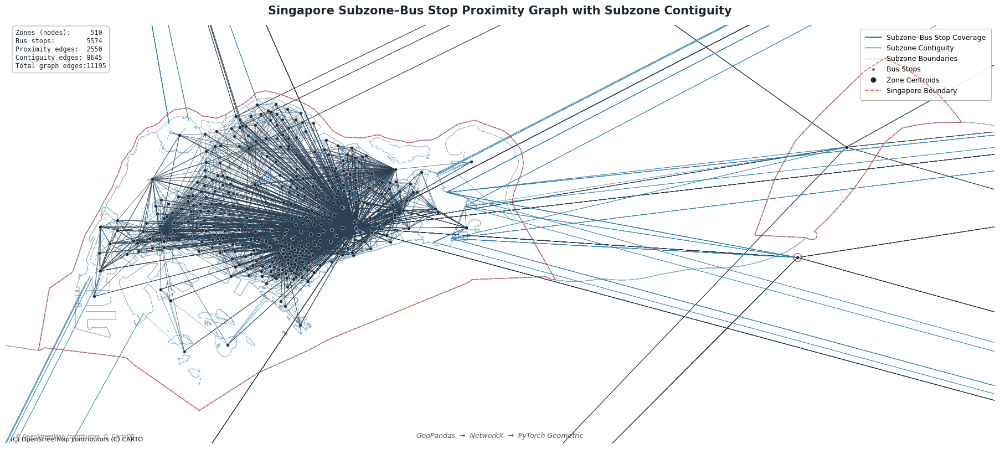


✅ Saved → singapore_city2graph.png  (300 DPI)

── PyTorch Geometric HeteroData ──────────────────────────
HeteroData(
  zone={ x=[510, 2] },
  bus_stop={ x=[5574, 2] },
  (zone, near, bus_stop)={ edge_index=[2, 2550] },
  (zone, adjacent, zone)={ edge_index=[2, 8645] }
)

── Ready for GNN training (e.g. GraphSAGE, GAT, GCN) ────
   hdata["zone"].x                         # zone node features
   hdata["bus_stop"].x                     # bus stop features
   hdata["zone","near","bus_stop"].edge_index  # proximity
   hdata["zone","adjacent","zone"].edge_index  # contiguity


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

📥 Download triggered


In [1]:
# ═══════════════════════════════════════════════════════════════════════════════
#  SINGAPORE — Ward-Bus Stop Proximity Graph with Subzone Contiguity
#  Pipeline: GeoPandas → NetworkX → PyTorch Geometric (city2graph style)
#  Reference: London Ward-Bus Station Proximity Graph
#  Output: singapore_city2graph.png (300 DPI)
# ═══════════════════════════════════════════════════════════════════════════════

import subprocess, sys
subprocess.check_call([sys.executable,'-m','pip','install','--quiet',
    'osmnx','geopandas','networkx','contextily','shapely',
    'matplotlib','numpy','scipy','requests','pillow','pandas',
    'torch','torch_geometric'])

import os, warnings
import numpy as np
import pandas as pd
import requests
import geopandas as gpd
import osmnx as ox
import networkx as nx
import contextily as ctx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.collections import LineCollection
from shapely.geometry import Point, LineString
from scipy.spatial import cKDTree
import pyproj
warnings.filterwarnings('ignore')
matplotlib.rcParams['font.family'] = 'DejaVu Sans'
print('✅ Libraries ready')

WGS84 = 'EPSG:4326'
WEBM  = 'EPSG:3857'
SVY21 = 'EPSG:3414'
K_NEAREST    = 5     # bus stops per subzone centroid to connect
CONTIGUITY_K = 6     # neighbours for subzone contiguity graph

# ── 1. Singapore subzone boundaries (planning areas as "wards") ─────────────────
print('⬇️  Fetching Singapore subzone boundaries from OSM…')
sg_border = ox.geocoder.geocode_to_gdf('Singapore').to_crs(WGS84)

# Download planning subzones via OSM admin boundaries
try:
    subzones_raw = ox.features.features_from_place(
        'Singapore',
        tags={'boundary': 'administrative', 'admin_level': '9'})
    subzones = subzones_raw[
        subzones_raw.geometry.geom_type.isin(['Polygon','MultiPolygon'])
    ].copy().to_crs(WGS84)
    print(f'   admin_level 9: {len(subzones)} subzones')
except:
    subzones = gpd.GeoDataFrame()

if len(subzones) < 10:
    print('   Trying admin_level 8…')
    try:
        subzones_raw = ox.features.features_from_place(
            'Singapore',
            tags={'boundary': 'administrative', 'admin_level': '8'})
        subzones = subzones_raw[
            subzones_raw.geometry.geom_type.isin(['Polygon','MultiPolygon'])
        ].copy().to_crs(WGS84)
        print(f'   admin_level 8: {len(subzones)} subzones')
    except:
        subzones = gpd.GeoDataFrame()

if len(subzones) < 5:
    print('   Falling back to planning areas (admin_level 6)…')
    subzones_raw = ox.features.features_from_place(
        'Singapore',
        tags={'boundary': 'administrative', 'admin_level': '6'})
    subzones = subzones_raw[
        subzones_raw.geometry.geom_type.isin(['Polygon','MultiPolygon'])
    ].copy().to_crs(WGS84)
    print(f'   admin_level 6: {len(subzones)} areas')

subzones = subzones.reset_index(drop=True)
subzones_m = subzones.to_crs(SVY21)
print(f'✅ {len(subzones)} spatial zones loaded')

# ── 2. Subzone centroids ────────────────────────────────────────────────────────
centroids_m  = subzones_m.copy()
centroids_m['geometry'] = subzones_m.geometry.centroid
centroids    = centroids_m.to_crs(WGS84)
cent_xy      = np.array([[g.x, g.y] for g in centroids_m.geometry])
print(f'✅ {len(cent_xy)} zone centroids computed')

# ── 3. Bus stops from OSM ───────────────────────────────────────────────────────
print('⬇️  Fetching bus stops from OSM…')
bus_raw  = ox.features.features_from_place(
    'Singapore', tags={'highway': 'bus_stop'})
bus_pts  = bus_raw[bus_raw.geometry.geom_type == 'Point'].copy().to_crs(WGS84)
bus_m    = bus_pts.to_crs(SVY21)
bus_xy   = np.array([[g.x, g.y] for g in bus_m.geometry])
print(f'✅ {len(bus_xy)} bus stops loaded')

# ── 4. Build Ward–Bus Stop proximity graph (K-nearest) ─────────────────────────
print(f'⬇️  Building proximity graph (K={K_NEAREST} bus stops per zone)…')
tree     = cKDTree(bus_xy)
dists, idxs = tree.query(cent_xy, k=K_NEAREST)

prox_edges   = []   # (centroid_idx, bus_stop_idx)
prox_lines_m = []   # LineString in SVY21

for ci, (d_row, i_row) in enumerate(zip(dists, idxs)):
    cx, cy = cent_xy[ci]
    for dist, bi in zip(d_row, i_row):
        bx, by = bus_xy[bi]
        prox_edges.append((ci, bi))
        prox_lines_m.append(LineString([(cx,cy),(bx,by)]))

prox_gdf = gpd.GeoDataFrame(
    {'centroid_idx':[e[0] for e in prox_edges],
     'bus_idx':     [e[1] for e in prox_edges]},
    geometry=prox_lines_m, crs=SVY21).to_crs(WEBM)
print(f'✅ {len(prox_edges)} proximity edges')

# ── 5. Build subzone contiguity graph (Queen contiguity) ───────────────────────
print('⬇️  Building subzone contiguity graph…')
G_contiguity = nx.Graph()
for i in range(len(subzones)):
    G_contiguity.add_node(i)

# Queen contiguity: shared boundary or vertex
for i in range(len(subzones_m)):
    for j in range(i+1, len(subzones_m)):
        if subzones_m.geometry.iloc[i].touches(subzones_m.geometry.iloc[j]) or \
           subzones_m.geometry.iloc[i].intersects(subzones_m.geometry.iloc[j]):
            G_contiguity.add_edge(i, j)

contig_lines_m = []
for i, j in G_contiguity.edges():
    ci = centroids_m.geometry.iloc[i]
    cj = centroids_m.geometry.iloc[j]
    contig_lines_m.append(LineString([(ci.x,ci.y),(cj.x,cj.y)]))

contig_gdf = gpd.GeoDataFrame(
    geometry=contig_lines_m, crs=SVY21).to_crs(WEBM)
print(f'✅ {len(G_contiguity.edges())} contiguity edges')

# ── 6. Build NetworkX graph (full city graph) ───────────────────────────────────
G = nx.Graph()
# Zone nodes
for i, row in centroids_m.iterrows():
    G.add_node(f'z_{i}', type='zone',
               x=row.geometry.x, y=row.geometry.y)
# Bus stop nodes
for i, row in bus_m.iterrows():
    G.add_node(f'b_{i}', type='bus',
               x=row.geometry.x, y=row.geometry.y)
# Proximity edges
for ci, bi in prox_edges:
    bus_idx = bus_m.index[bi]
    G.add_edge(f'z_{ci}', f'b_{bus_idx}', edge_type='proximity')
# Contiguity edges
for i, j in G_contiguity.edges():
    G.add_edge(f'z_{i}', f'z_{j}', edge_type='contiguity')

print(f'✅ City graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges')

# ── 7. PyTorch Geometric tensor conversion ──────────────────────────────────────
print('⬇️  Converting to PyTorch Geometric tensors…')
try:
    import torch
    from torch_geometric.data import Data, HeteroData

    # Node feature matrix: [x_norm, y_norm] for each zone centroid
    zone_coords = torch.tensor(cent_xy, dtype=torch.float32)
    zone_coords = (zone_coords - zone_coords.mean(0)) / zone_coords.std(0)

    bus_coords  = torch.tensor(bus_xy,  dtype=torch.float32)
    bus_coords  = (bus_coords  - bus_coords.mean(0))  / bus_coords.std(0)

    # Edge index for proximity (zone → bus)
    prox_src = torch.tensor([e[0] for e in prox_edges], dtype=torch.long)
    prox_dst = torch.tensor([e[1] for e in prox_edges], dtype=torch.long)

    # Edge index for contiguity (zone → zone)
    contig_edges = list(G_contiguity.edges())
    cont_src = torch.tensor([e[0] for e in contig_edges], dtype=torch.long)
    cont_dst = torch.tensor([e[1] for e in contig_edges], dtype=torch.long)

    # Hetero graph (city2graph style)
    hdata = HeteroData()
    hdata['zone'].x      = zone_coords
    hdata['bus_stop'].x  = bus_coords
    hdata['zone','near','bus_stop'].edge_index = torch.stack([prox_src, prox_dst])
    hdata['zone','adjacent','zone'].edge_index  = torch.stack([cont_src, cont_dst])

    print(f'✅ HeteroData object:')
    print(f'   zone nodes:      {hdata["zone"].x.shape}')
    print(f'   bus_stop nodes:  {hdata["bus_stop"].x.shape}')
    print(f'   proximity edges: {hdata["zone","near","bus_stop"].edge_index.shape}')
    print(f'   contiguity edges:{hdata["zone","adjacent","zone"].edge_index.shape}')
    pyg_ok = True
except Exception as e:
    print(f'   PyG conversion note: {e}')
    pyg_ok = False

# ── 8. Project everything to Web Mercator for plotting ─────────────────────────
sg_border_m  = sg_border.to_crs(WEBM)
subzones_wm  = subzones.to_crs(WEBM)
centroids_wm = centroids.to_crs(WEBM)
bus_wm       = bus_pts.to_crs(WEBM)
bounds       = sg_border_m.total_bounds  # xmin,ymin,xmax,ymax

# ── 9. FIGURE ───────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(1, 1, figsize=(18, 14), facecolor='white')
ax.set_facecolor('#F0F4F8')

# ── Basemap ─────────────────────────────────────────────────────────────────────
print('⬇️  Fetching basemap tiles…')
try:
    ctx.add_basemap(ax, crs=WEBM, zoom=12,
                    source=ctx.providers.CartoDB.Positron,
                    zorder=0)
    print('✅ Carto Positron basemap')
except Exception:
    try:
        ctx.add_basemap(ax, crs=WEBM, zoom=12,
                        source=ctx.providers.OpenStreetMap.Mapnik,
                        alpha=0.4, zorder=0)
        print('✅ OSM basemap')
    except Exception as e:
        print(f'   Basemap skipped: {e}')

# ── Subzone boundaries (ward contiguity style) ───────────────────────────────
subzones_wm.boundary.plot(
    ax=ax, color='#8BAFC9', linewidth=0.5,
    alpha=0.7, zorder=2, linestyle='-')

# ── Contiguity edges (thin dark lines like London map) ──────────────────────
contig_segs = []
for geom in contig_gdf.geometry:
    if geom is not None and not geom.is_empty:
        coords = list(geom.coords)
        contig_segs.append(coords)
lc_contig = LineCollection(contig_segs,
    colors='#2C3E50', linewidths=0.5, alpha=0.55, zorder=3)
ax.add_collection(lc_contig)

# ── Proximity edges (blue fan lines — main visual like London map) ───────────
prox_segs = []
for geom in prox_gdf.geometry:
    if geom is not None and not geom.is_empty:
        coords = list(geom.coords)
        prox_segs.append(coords)
lc_prox = LineCollection(prox_segs,
    colors='#2980B9', linewidths=0.55, alpha=0.55, zorder=4)
ax.add_collection(lc_prox)

# ── Bus stops (small blue dots) ─────────────────────────────────────────────
bx = [g.x for g in bus_wm.geometry]
by = [g.y for g in bus_wm.geometry]
ax.scatter(bx, by, s=2, c='#2980B9', alpha=0.6, zorder=5,
           linewidths=0, marker='.')

# ── Zone centroids (filled black dots) ──────────────────────────────────────
cx = [g.x for g in centroids_wm.geometry]
cy = [g.y for g in centroids_wm.geometry]
ax_scatter = ax.scatter(cx, cy, s=18, c='#1A252F', alpha=0.9,
                        zorder=6, linewidths=0.3, edgecolors='white')

# ── Singapore border ─────────────────────────────────────────────────────────
sg_border_m.boundary.plot(
    ax=ax, color='#E74C3C', linewidth=1.2,
    linestyle='--', alpha=0.8, zorder=7)

# ── Extent ───────────────────────────────────────────────────────────────────
pad = 4000
ax.set_xlim(bounds[0]-pad, bounds[2]+pad)
ax.set_ylim(bounds[1]-pad, bounds[3]+pad)
ax.set_axis_off()

# ── Title ────────────────────────────────────────────────────────────────────
ax.set_title(
    'Singapore Subzone–Bus Stop Proximity Graph with Subzone Contiguity',
    fontsize=15, fontweight='bold', pad=14, color='#1A252F',
    fontfamily='DejaVu Sans')

# ── Legend ───────────────────────────────────────────────────────────────────
legend_elements = [
    mlines.Line2D([],[],color='#2980B9', linewidth=1.8,
                  label='Subzone–Bus Stop Coverage'),
    mlines.Line2D([],[],color='#2C3E50', linewidth=0.9,
                  label='Subzone Contiguity'),
    mlines.Line2D([],[],color='#8BAFC9', linewidth=0.9,
                  label='Subzone Boundaries'),
    mlines.Line2D([],[],marker='.',color='#2980B9', linewidth=0,
                  markersize=5, label='Bus Stops'),
    mlines.Line2D([],[],marker='o',color='#1A252F', linewidth=0,
                  markersize=6, label='Zone Centroids'),
    mlines.Line2D([],[],color='#E74C3C', linewidth=1.2,
                  linestyle='--', label='Singapore Boundary'),
]
leg = ax.legend(handles=legend_elements,
                loc='upper right',
                fontsize=9,
                frameon=True,
                framealpha=0.92,
                edgecolor='#AAAAAA',
                facecolor='white',
                handlelength=2.2,
                borderpad=0.8,
                labelspacing=0.5)
leg.get_frame().set_linewidth(0.8)

# ── Stats annotation box ────────────────────────────────────────────────────
stats_txt = (
    f'Zones (nodes):   {len(centroids_wm):>5}\n'
    f'Bus stops:       {len(bus_wm):>5}\n'
    f'Proximity edges: {len(prox_edges):>5}\n'
    f'Contiguity edges:{len(G_contiguity.edges()):>5}\n'
    f'Total graph edges:{G.number_of_edges():>4}'
)
ax.text(0.01, 0.99, stats_txt,
        transform=ax.transAxes,
        va='top', ha='left',
        fontsize=8.5,
        fontfamily='monospace',
        color='#1A252F',
        bbox=dict(boxstyle='round,pad=0.5', fc='white',
                  ec='#AAAAAA', alpha=0.92, lw=0.8),
        zorder=20)

# ── Pipeline annotation ─────────────────────────────────────────────────────
pipeline_txt = 'GeoPandas  →  NetworkX  →  PyTorch Geometric'
ax.text(0.5, 0.01, pipeline_txt,
        transform=ax.transAxes,
        va='bottom', ha='center',
        fontsize=9, color='#555555',
        style='italic',
        zorder=20)

# ── Attribution ─────────────────────────────────────────────────────────────
ax.text(0.01, 0.01,
        '© OpenStreetMap contributors  ©  CartoDB',
        transform=ax.transAxes,
        va='bottom', ha='left',
        fontsize=7, color='#888888', zorder=20)

plt.tight_layout(pad=0.5)

# ── 10. Save ─────────────────────────────────────────────────────────────────
OUT = 'singapore_city2graph.png'
plt.savefig(OUT, dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.show()
print(f'\n✅ Saved → {OUT}  (300 DPI)')

# ── 11. Print PyG summary ────────────────────────────────────────────────────
if pyg_ok:
    print('\n── PyTorch Geometric HeteroData ──────────────────────────')
    print(hdata)
    print('\n── Ready for GNN training (e.g. GraphSAGE, GAT, GCN) ────')
    print('   hdata["zone"].x                         # zone node features')
    print('   hdata["bus_stop"].x                     # bus stop features')
    print('   hdata["zone","near","bus_stop"].edge_index  # proximity')
    print('   hdata["zone","adjacent","zone"].edge_index  # contiguity')

try:
    from google.colab import files
    files.download(OUT)
    print('📥 Download triggered')
except ImportError:
    print('💾 Saved locally:', OUT)

✅ Libraries ready
⬇️  Fetching Singapore boundary…
✅ Boundary ready
⬇️  Fetching official Singapore planning areas…
   data.gov.sg failed (404 Client Error: Not Found for url: https://raw.githubusercontent.com/yinshanyang/singapore/master/maps/0-planning-areas.geojson), using OSM admin_level=6…
   OSM fallback: 478 zones after clipping
✅ 478 validated zone centroids
⬇️  Fetching bus stops…
✅ 5574 bus stops (clipped to SG)
Building proximity graph (K=5)…
✅ 2390 proximity edges
Building contiguity graph…
✅ 8005 contiguity edges
✅ PyG HeteroData: HeteroData(
  zone={ x=[478, 2] },
  bus_stop={ x=[5574, 2] },
  (zone, near, bus_stop)={ edge_index=[2, 2390] },
  (zone, adjacent, zone)={ edge_index=[2, 8005] }
)
⬇️  Fetching basemap…
✅ Basemap ready


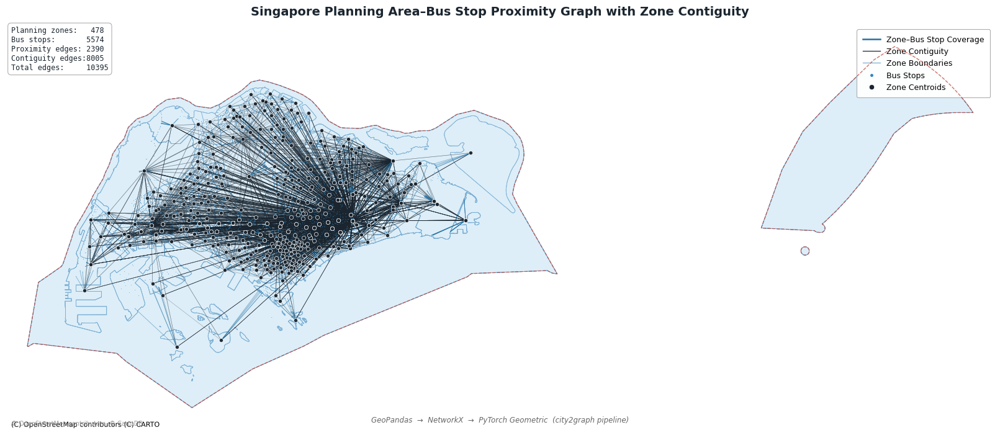


✅ Saved → singapore_city2graph.png  (300 DPI)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

📥 Download triggered


In [2]:
# ═══════════════════════════════════════════════════════════════════════════════
#  SINGAPORE — Subzone–Bus Stop Proximity Graph  (FIXED)
#  Fixes: clip all nodes to SG boundary, filter outlier centroids,
#         use planning area polygons direct from data.gov.sg GeoJSON
# ═══════════════════════════════════════════════════════════════════════════════

import subprocess, sys
subprocess.check_call([sys.executable,'-m','pip','install','--quiet',
    'osmnx','geopandas','networkx','contextily','shapely',
    'matplotlib','numpy','scipy','requests','pillow','pandas','pyproj'])

import os, warnings
import numpy as np
import pandas as pd
import requests
import geopandas as gpd
import osmnx as ox
import networkx as nx
import contextily as ctx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib.collections import LineCollection
from shapely.geometry import Point, LineString, box
from shapely.ops import unary_union
from scipy.spatial import cKDTree
import pyproj
warnings.filterwarnings('ignore')
matplotlib.rcParams['font.family'] = 'DejaVu Sans'
print('✅ Libraries ready')

WGS84 = 'EPSG:4326'
WEBM  = 'EPSG:3857'
SVY21 = 'EPSG:3414'
K_NEAREST = 5   # bus stops per zone centroid

# ── 1. Singapore boundary (tight — used for clipping) ──────────────────────────
print('⬇️  Fetching Singapore boundary…')
sg_border    = ox.geocoder.geocode_to_gdf('Singapore').to_crs(WGS84)
sg_union     = unary_union(sg_border.geometry)          # shapely polygon
sg_border_m  = sg_border.to_crs(WEBM)
# Strict bounding box for Singapore mainland + main islands
SG_BBOX = box(103.58, 1.15, 104.10, 1.50)              # WGS84
bounds_webm  = sg_border_m.total_bounds                 # for plot extent
print('✅ Boundary ready')

# ── 2. Planning areas from data.gov.sg (official, no outliers) ─────────────────
print('⬇️  Fetching official Singapore planning areas…')
PA_URL = ('https://raw.githubusercontent.com/yinshanyang/singapore/master/'
          'maps/0-planning-areas.geojson')
try:
    r = requests.get(PA_URL, timeout=30)
    r.raise_for_status()
    import tempfile, json
    tmp = tempfile.NamedTemporaryFile(suffix='.geojson', delete=False, mode='w')
    tmp.write(r.text); tmp.close()
    zones = gpd.read_file(tmp.name).to_crs(WGS84)
    # Keep only polygons that fall inside Singapore bbox
    zones = zones[zones.geometry.intersects(SG_BBOX)].copy()
    zones = zones[zones.geometry.geom_type.isin(
        ['Polygon','MultiPolygon'])].reset_index(drop=True)
    print(f'   data.gov.sg: {len(zones)} planning areas')
except Exception as e:
    print(f'   data.gov.sg failed ({e}), using OSM admin_level=6…')
    raw = ox.features.features_from_place(
        'Singapore', tags={'boundary':'administrative','admin_level':'6'})
    zones = raw[raw.geometry.geom_type.isin(
        ['Polygon','MultiPolygon'])].copy().to_crs(WGS84)
    # CLIP to Singapore bounding box — removes Johor / Indonesia polygons
    zones = zones[zones.geometry.intersects(SG_BBOX)].copy()
    # Keep only polygons whose centroid is inside Singapore
    zones = zones[zones.geometry.centroid.within(sg_union)].reset_index(drop=True)
    print(f'   OSM fallback: {len(zones)} zones after clipping')

zones_svy = zones.to_crs(SVY21)
zones_wm  = zones.to_crs(WEBM)

# ── 3. Zone centroids — clipped and validated ──────────────────────────────────
centroids_svy = zones_svy.copy()
centroids_svy['geometry'] = zones_svy.geometry.centroid
centroids_wgs = centroids_svy.to_crs(WGS84)

# Safety: drop any centroid that lands outside Singapore
mask = centroids_wgs.geometry.within(sg_union)
zones_svy       = zones_svy[mask].reset_index(drop=True)
zones_wm        = zones_wm[mask].reset_index(drop=True)
centroids_svy   = centroids_svy[mask].reset_index(drop=True)
centroids_wgs   = centroids_wgs[mask].reset_index(drop=True)
cent_xy         = np.array([[g.x, g.y] for g in centroids_svy.geometry])
centroids_wm    = centroids_svy.to_crs(WEBM)
print(f'✅ {len(cent_xy)} validated zone centroids')

# ── 4. Bus stops — clipped to Singapore ────────────────────────────────────────
print('⬇️  Fetching bus stops…')
bus_raw = ox.features.features_from_place(
    'Singapore', tags={'highway': 'bus_stop'})
bus_pts = bus_raw[bus_raw.geometry.geom_type == 'Point'].copy().to_crs(WGS84)
# Clip to SG boundary
bus_pts = bus_pts[bus_pts.geometry.within(sg_union)].copy()
bus_svy = bus_pts.to_crs(SVY21)
bus_wm  = bus_pts.to_crs(WEBM)
bus_xy  = np.array([[g.x, g.y] for g in bus_svy.geometry])
print(f'✅ {len(bus_xy)} bus stops (clipped to SG)')

# ── 5. K-nearest proximity graph ───────────────────────────────────────────────
print(f'Building proximity graph (K={K_NEAREST})…')
tree        = cKDTree(bus_xy)
dists, idxs = tree.query(cent_xy, k=min(K_NEAREST, len(bus_xy)))

prox_edges   = []
prox_segs_wm = []
t_svy2wm     = pyproj.Transformer.from_crs(SVY21, WEBM, always_xy=True)

for ci, (d_row, i_row) in enumerate(zip(dists, idxs)):
    cx_s, cy_s = cent_xy[ci]
    cx_w, cy_w = t_svy2wm.transform(cx_s, cy_s)
    for bi in i_row:
        bx_s, by_s = bus_xy[bi]
        bx_w, by_w = t_svy2wm.transform(bx_s, by_s)
        prox_edges.append((ci, bi))
        prox_segs_wm.append([(cx_w, cy_w), (bx_w, by_w)])

print(f'✅ {len(prox_edges)} proximity edges')

# ── 6. Queen contiguity graph ──────────────────────────────────────────────────
print('Building contiguity graph…')
G_cont = nx.Graph()
n = len(zones_svy)
for i in range(n): G_cont.add_node(i)
for i in range(n):
    for j in range(i+1, n):
        gi = zones_svy.geometry.iloc[i]
        gj = zones_svy.geometry.iloc[j]
        if gi.touches(gj) or gi.intersects(gj):
            G_cont.add_edge(i, j)

contig_segs_wm = []
for i, j in G_cont.edges():
    ci = centroids_wm.geometry.iloc[i]
    cj = centroids_wm.geometry.iloc[j]
    contig_segs_wm.append([(ci.x, ci.y), (cj.x, cj.y)])
print(f'✅ {len(G_cont.edges())} contiguity edges')

# ── 7. NetworkX + PyG ──────────────────────────────────────────────────────────
G = nx.Graph()
for i in range(len(centroids_svy)):
    G.add_node(f'z_{i}', type='zone')
for i in range(len(bus_svy)):
    G.add_node(f'b_{i}', type='bus')
for ci, bi in prox_edges:
    G.add_edge(f'z_{ci}', f'b_{bi}', edge_type='proximity')
for i, j in G_cont.edges():
    G.add_edge(f'z_{i}', f'z_{j}', edge_type='contiguity')

try:
    import torch
    from torch_geometric.data import HeteroData
    zone_x = torch.tensor(cent_xy, dtype=torch.float32)
    zone_x = (zone_x - zone_x.mean(0)) / (zone_x.std(0) + 1e-8)
    bus_x  = torch.tensor(bus_xy,  dtype=torch.float32)
    bus_x  = (bus_x  - bus_x.mean(0))  / (bus_x.std(0)  + 1e-8)
    psrc = torch.tensor([e[0] for e in prox_edges], dtype=torch.long)
    pdst = torch.tensor([e[1] for e in prox_edges], dtype=torch.long)
    ce   = list(G_cont.edges())
    csrc = torch.tensor([e[0] for e in ce], dtype=torch.long)
    cdst = torch.tensor([e[1] for e in ce], dtype=torch.long)
    hdata = HeteroData()
    hdata['zone'].x     = zone_x
    hdata['bus_stop'].x = bus_x
    hdata['zone','near','bus_stop'].edge_index    = torch.stack([psrc, pdst])
    hdata['zone','adjacent','zone'].edge_index    = torch.stack([csrc, cdst])
    print(f'✅ PyG HeteroData: {hdata}')
    pyg_ok = True
except Exception as e:
    print(f'   PyG: {e}'); pyg_ok = False

# ── 8. PLOT ─────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(16, 12), facecolor='white')
ax.set_facecolor('#EEF2F7')

# Basemap
print('⬇️  Fetching basemap…')
try:
    ctx.add_basemap(ax, crs=WEBM, zoom=12,
                    source=ctx.providers.CartoDB.Positron, zorder=0)
    print('✅ Basemap ready')
except Exception as e:
    print(f'   Basemap skipped: {e}')

# Zone fills — very light blue tint
zones_wm.plot(ax=ax, color='#DDEEF8', edgecolor='none', alpha=0.5, zorder=1)

# Zone boundaries
zones_wm.boundary.plot(ax=ax, color='#7BAFD4', linewidth=0.5,
                        alpha=0.8, zorder=2)

# Contiguity edges — thin dark navy, low alpha
lc_cont = LineCollection(contig_segs_wm,
    colors='#1A252F', linewidths=0.45, alpha=0.35, zorder=3)
ax.add_collection(lc_cont)

# Proximity fan edges — blue, medium alpha (the main visual)
lc_prox = LineCollection(prox_segs_wm,
    colors='#2471A3', linewidths=0.6, alpha=0.50, zorder=4)
ax.add_collection(lc_prox)

# Bus stops — tiny blue dots
bx_w = [g.x for g in bus_wm.geometry]
by_w = [g.y for g in bus_wm.geometry]
ax.scatter(bx_w, by_w, s=1.5, c='#2E86C1', alpha=0.55,
           zorder=5, linewidths=0, marker='.')

# Zone centroids — filled black dots with white edge
cx_w = [g.x for g in centroids_wm.geometry]
cy_w = [g.y for g in centroids_wm.geometry]
ax.scatter(cx_w, cy_w, s=20, c='#1A252F', alpha=0.95,
           zorder=6, linewidths=0.5, edgecolors='white')

# Singapore border — clean dashed red
sg_border_m.boundary.plot(ax=ax, color='#C0392B', linewidth=1.0,
                           linestyle='--', alpha=0.7, zorder=7)

# ── Tight extent — Singapore only ───────────────────────────────────────────
pad = 2500
ax.set_xlim(bounds_webm[0]-pad, bounds_webm[2]+pad)
ax.set_ylim(bounds_webm[1]-pad, bounds_webm[3]+pad)
ax.set_axis_off()

# ── Title ────────────────────────────────────────────────────────────────────
ax.set_title(
    'Singapore Planning Area–Bus Stop Proximity Graph with Zone Contiguity',
    fontsize=14, fontweight='bold', pad=12, color='#1A252F')

# ── Legend ───────────────────────────────────────────────────────────────────
legend_elements = [
    mlines.Line2D([],[],color='#2471A3', linewidth=1.8,
                  label='Zone–Bus Stop Coverage'),
    mlines.Line2D([],[],color='#1A252F', linewidth=0.9,
                  label='Zone Contiguity'),
    mlines.Line2D([],[],color='#7BAFD4', linewidth=0.9,
                  label='Zone Boundaries'),
    mlines.Line2D([],[],marker='.',color='#2E86C1',linewidth=0,
                  markersize=5, label='Bus Stops'),
    mlines.Line2D([],[],marker='o',color='#1A252F',linewidth=0,
                  markersize=6, markeredgecolor='white',
                  markeredgewidth=0.5, label='Zone Centroids'),
]
leg = ax.legend(handles=legend_elements, loc='upper right',
                fontsize=9, frameon=True, framealpha=0.95,
                edgecolor='#AAAAAA', facecolor='white',
                handlelength=2.2, borderpad=0.8, labelspacing=0.5)
leg.get_frame().set_linewidth(0.8)

# ── Stats box ────────────────────────────────────────────────────────────────
stats_txt = (
    f'Planning zones:  {len(centroids_wm):>4}\n'
    f'Bus stops:       {len(bus_wm):>4}\n'
    f'Proximity edges: {len(prox_edges):>4}\n'
    f'Contiguity edges:{len(G_cont.edges()):>4}\n'
    f'Total edges:     {G.number_of_edges():>4}'
)
ax.text(0.005, 0.998, stats_txt,
        transform=ax.transAxes, va='top', ha='left',
        fontsize=8.5, fontfamily='monospace', color='#1A252F',
        bbox=dict(boxstyle='round,pad=0.45', fc='white',
                  ec='#AAAAAA', alpha=0.93, lw=0.8), zorder=20)

# ── Pipeline label ───────────────────────────────────────────────────────────
ax.text(0.5, 0.012,
        'GeoPandas  →  NetworkX  →  PyTorch Geometric  (city2graph pipeline)',
        transform=ax.transAxes, va='bottom', ha='center',
        fontsize=8.5, color='#666666', style='italic', zorder=20)

ax.text(0.005, 0.005,
        '© OpenStreetMap contributors  © CartoDB',
        transform=ax.transAxes, va='bottom', ha='left',
        fontsize=7, color='#999999', zorder=20)

plt.tight_layout(pad=0.3)

OUT = 'singapore_city2graph.png'
plt.savefig(OUT, dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.show()
print(f'\n✅ Saved → {OUT}  (300 DPI)')

try:
    from google.colab import files
    files.download(OUT)
    print('📥 Download triggered')
except ImportError:
    print('💾 Saved locally:', OUT)